In [1]:
# Importing Libraries:

import mne
import matplotlib.pyplot as plt
import pyedflib
import numpy as np
import os
import seaborn as sns
import pandas as pd

mne.set_log_level('ERROR')

In [2]:
# Importing EDF Files:

file_participant_1 = 'Data/RawData/Participant_1.edf'
file_participant_2 = 'Data/RawData/Participant_2.edf'
file_participant_3 = 'Data/RawData/Participant_3.edf'
file_participant_4 = 'Data/RawData/Participant_4.edf'
file_participant_5 = 'Data/RawData/Participant_5.edf'
file_participant_6 = 'Data/RawData/Participant_6.edf'
file_participant_7 = 'Data/RawData/Participant_7.edf'
file_participant_8 = 'Data/RawData/Participant_8.edf'
file_participant_9 = 'Data/RawData/Participant_9.edf'
file_participant_10 = 'Data/RawData/Participant_10.edf'
file_participant_11 = 'Data/RawData/Participant_11.edf'
file_participant_12 = 'Data/RawData/Participant_12.edf'
file_participant_13 = 'Data/RawData/Participant_13.edf'

edf_data_files = [
    file_participant_1,
    file_participant_2,
    file_participant_3,
    file_participant_4,
    file_participant_5,
    file_participant_6,
    file_participant_7,
    file_participant_8,
    file_participant_9,
    file_participant_10,
    file_participant_11,
    file_participant_12,
    file_participant_13
]

##### Basic Information:

In [3]:
# Function to Display Basic Information of the Raw Data:

def display_basic_info(file_path):

    with pyedflib.EdfReader(file_path) as f:

        n_channels = f.signals_in_file
        signal_labels = f.getSignalLabels()
        sample_frequencies = f.getSampleFrequencies()
        duration = f.file_duration
        
        print(f"File: {file_path}")
        print(f"Number of Channels: {n_channels}")
        print(f"Signal Labels: {signal_labels}")
        print(f"Sample Frequencies: {sample_frequencies}")
        print(f"Duration: {duration} seconds")
        print("\n")

In [4]:
# Display Basic Information for each Participant:

for file_path in edf_data_files:
    display_basic_info(file_path)

File: Data/RawData/Participant_1.edf
Number of Channels: 60
Signal Labels: ['TIME_STAMP_s', 'TIME_STAMP_ms', 'OR_TIME_STAMP_s', 'OR_TIME_STAMP_ms', 'COUNTER', 'INTERPOLATED', 'AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4', 'RAW_CQ', 'BATTERY', 'BATTERY_PERCENT', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'MARKER_HARDWARE', 'CQ_AF3', 'CQ_F7', 'CQ_F3', 'CQ_FC5', 'CQ_T7', 'CQ_P7', 'CQ_O1', 'CQ_O2', 'CQ_P8', 'CQ_T8', 'CQ_FC6', 'CQ_F4', 'CQ_F8', 'CQ_AF4', 'CQ_Overall', 'EQ_SampleRateQua', 'EQ_OVERALL', 'EQ_AF3', 'EQ_F7', 'EQ_F3', 'EQ_FC5', 'EQ_T7', 'EQ_P7', 'EQ_O1', 'EQ_O2', 'EQ_P8', 'EQ_T8', 'EQ_FC6', 'EQ_F4', 'EQ_F8', 'EQ_AF4', 'CQ_CMS', 'CQ_DRL']
Sample Frequencies: [128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.

##### Channels of Interest:

In [5]:
# COI:

channels_of_interest = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']

##### Further Analysis:

In [6]:
# Function to Analyse EDFs:

def analyse_edf(file_path, channels_of_interest):

    try:
        # Load EDF file:
        edf_file = pyedflib.EdfReader(file_path)

        # Extract signal information:
        signal_labels = edf_file.getSignalLabels()
        num_signals = edf_file.signals_in_file

        # Read data from COI and calculate statistics:
        statistics = {channel: {"data": [], "Mean": 0, "Median": 0, "Variance": 0, "Standard Deviation": 0}
                      for channel in channels_of_interest}
        
        for signal_index in range(num_signals):
            label = signal_labels[signal_index]

            if label in channels_of_interest:
                signal_data = edf_file.readSignal(signal_index)

                # Calculate basic statistics:
                mean = np.mean(signal_data)
                median = np.median(signal_data)
                variance = np.var(signal_data)
                std_dev = np.std(signal_data)

                statistics[label]["data"] = signal_data
                statistics[label]["Mean"] = mean
                statistics[label]["Median"] = median
                statistics[label]["Variance"] = variance
                statistics[label]["Standard Deviation"] = std_dev

                # Plot the signal data:
                plt.figure(figsize=(12, 6))
                plt.plot(signal_data)
                plt.title(f'Signal: {label} from {os.path.basename(file_path)}')
                plt.xlabel('Time (s)')
                plt.ylabel('Amplitude')
                plt.show()

        edf_file.close()

        # Calculate average statistics for COI:
        average_statistics = {
            "Mean": np.mean([stats["Mean"] for stats in statistics.values()]),
            "Median": np.mean([stats["Median"] for stats in statistics.values()]),
            "Variance": np.mean([stats["Variance"] for stats in statistics.values()]),
            "Standard Deviation": np.mean([stats["Standard Deviation"] for stats in statistics.values()])
        }

        # Print the statistics:
        print(f'Statistics for {os.path.basename(file_path)}:')
        
        for label, stats in statistics.items():
            print(f'Statistics for {label}:')
            print(f"  Mean: {stats['Mean']}")
            print(f"  Median: {stats['Median']}")
            print(f"  Variance: {stats['Variance']}")
            print(f"  Standard Deviation: {stats['Standard Deviation']}")
            print()
        
        print(f'Average Statistics for channels of interest:')
        print(f"  Mean: {average_statistics['Mean']}")
        print(f"  Median: {average_statistics['Median']}")
        print(f"  Variance: {average_statistics['Variance']}")
        print(f"  Standard Deviation: {average_statistics['Standard Deviation']}")
        print()

    except Exception as e:
        print(f"An error occurred while processing {file_path}: {e}")

##### Participant 1:

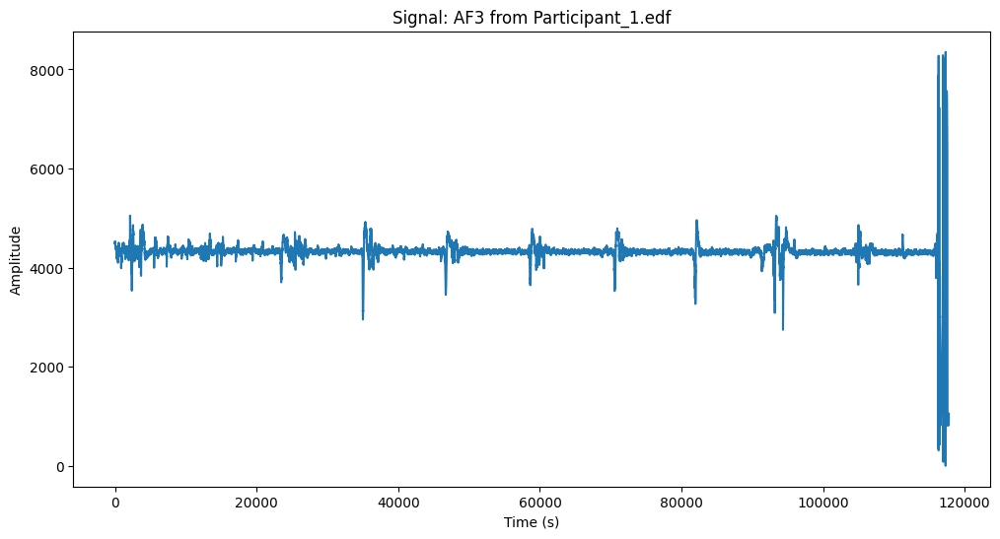

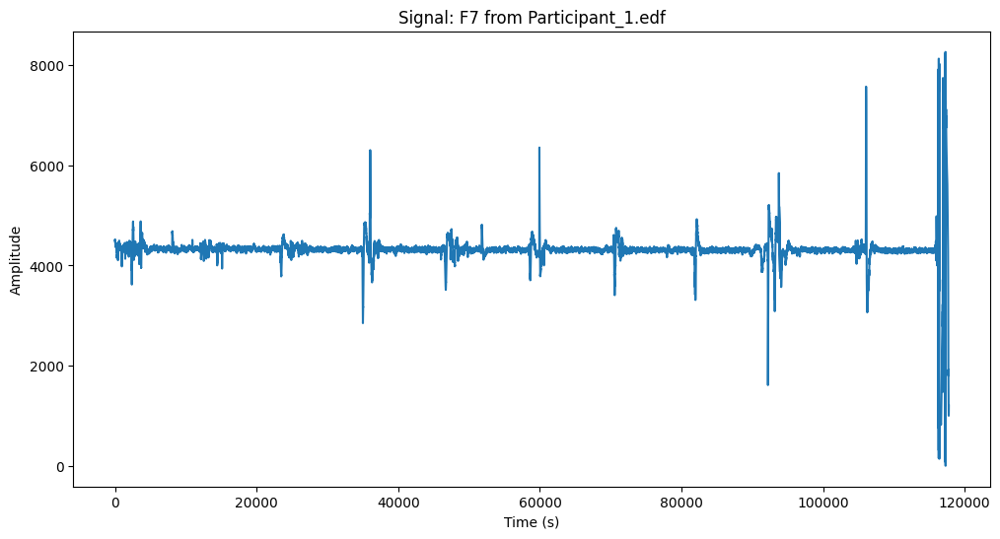

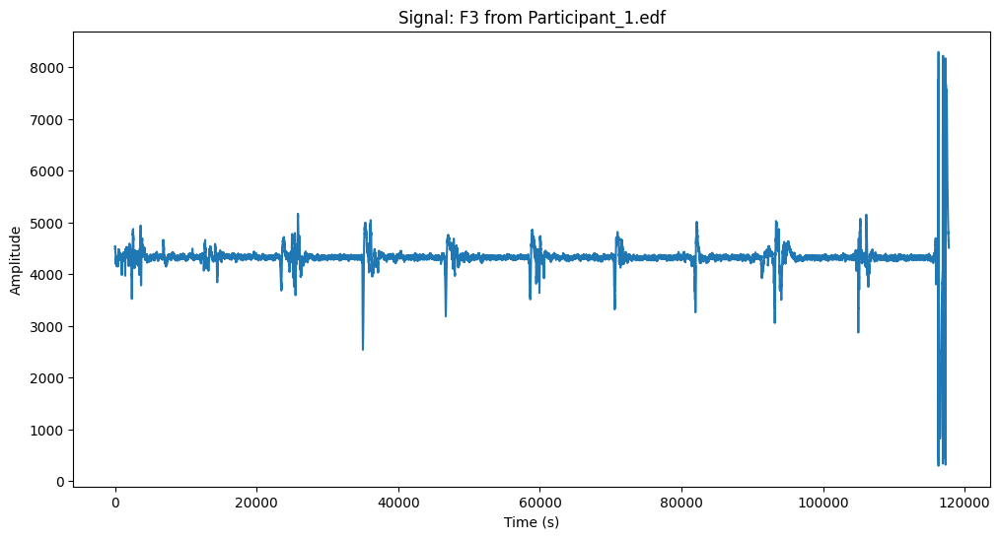

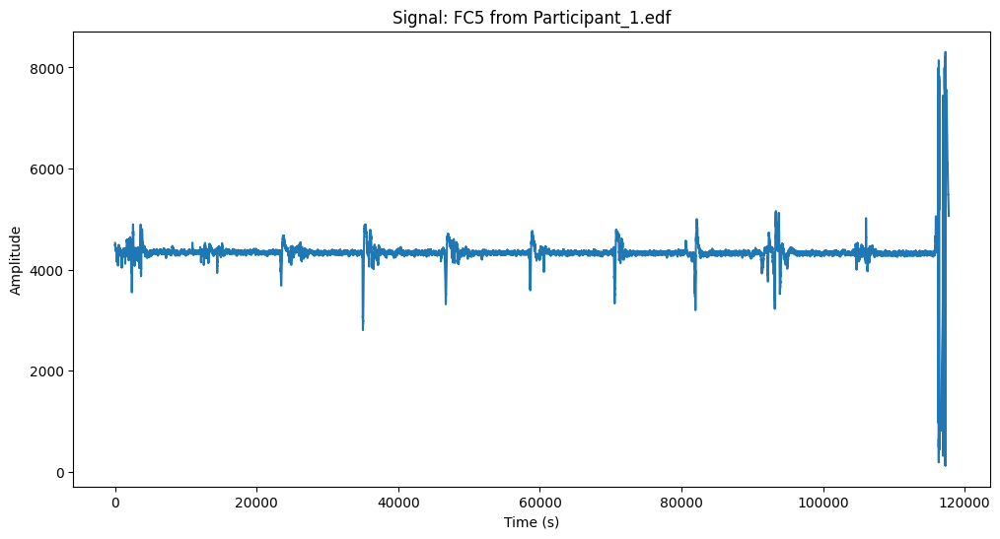

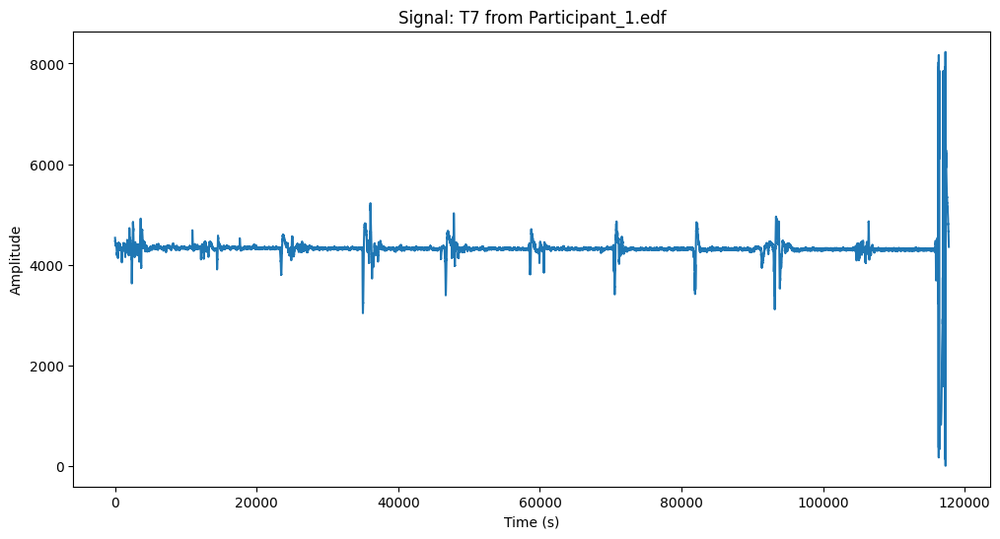

...

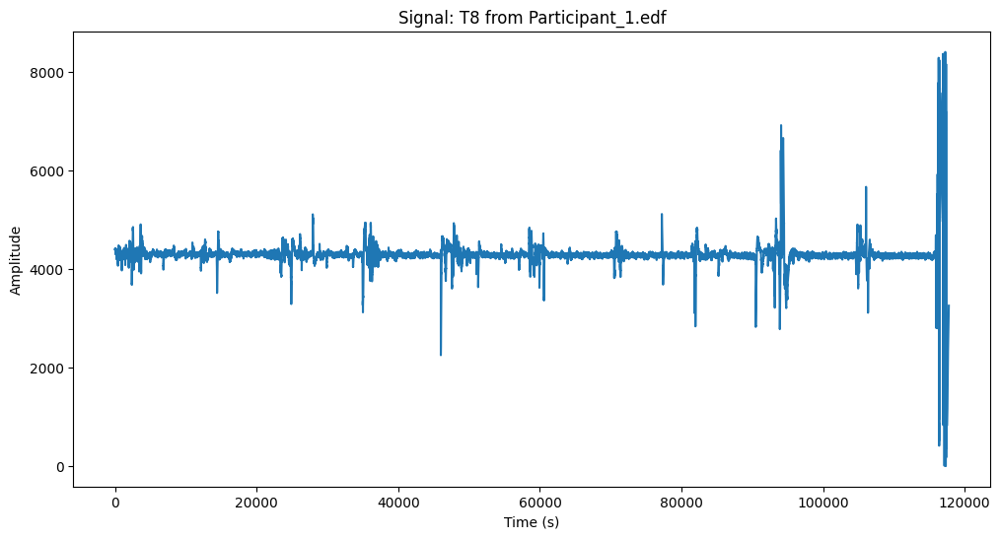

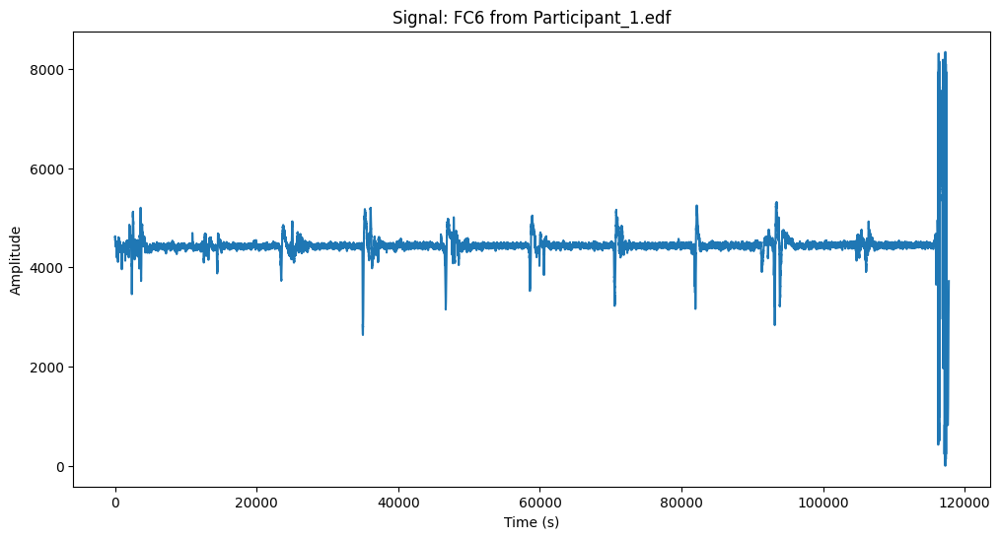

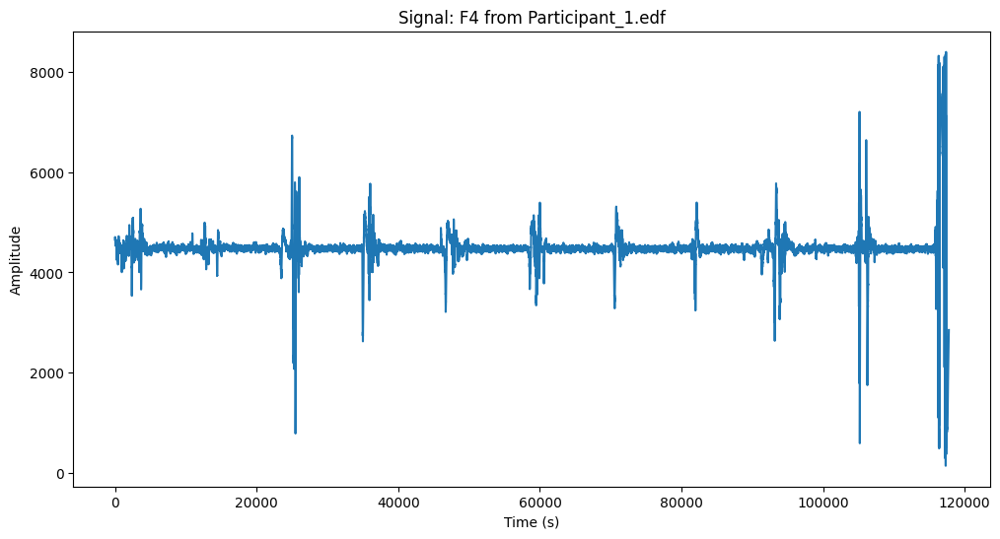

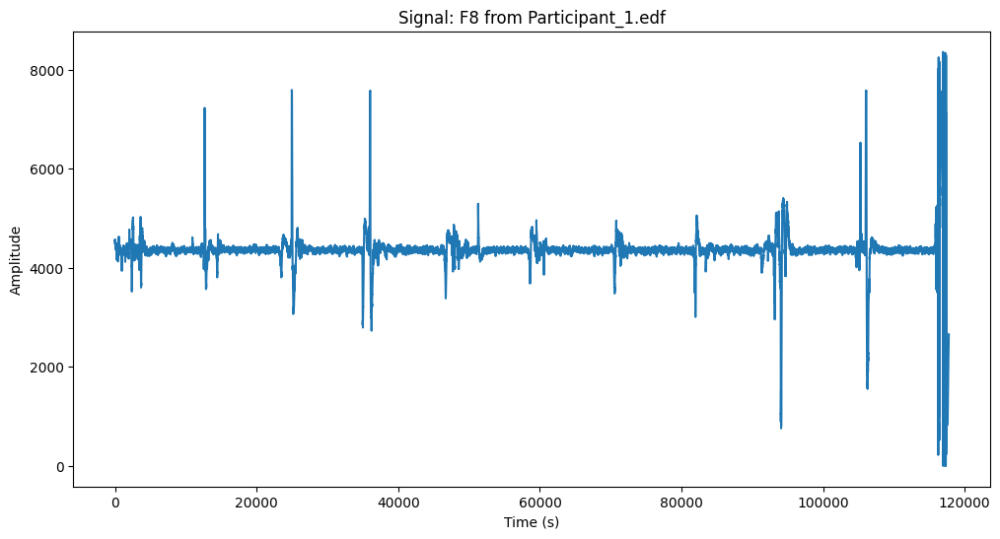

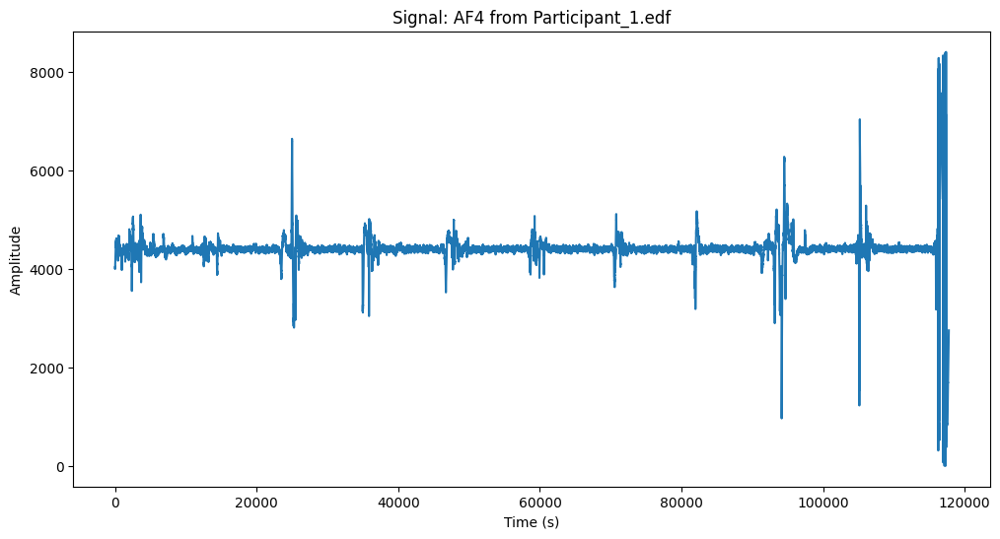

Statistics for Participant_1.edf:
Statistics for AF3:
  Mean: 4317.446854096992
  Median: 4329.743589743592
  Variance: 136193.06870087888
  Standard Deviation: 369.04345096597893

Statistics for F7:
  Mean: 4322.40005748328
  Median: 4325.641025641027
  Variance: 117527.20532969253
  Standard Deviation: 342.82241077516

Statistics for F3:
  Mean: 4322.08219237737
  Median: 4334.3589743589755
  Variance: 105561.22853012328
  Standard Deviation: 324.901875233313

Statistics for FC5:
  Mean: 4335.53377578038
  Median: 4342.051282051283
  Variance: 119336.9058751937
  Standard Deviation: 345.4517417457809

Statistics for T7:
  Mean: 4319.794013900504
  Median: 4320.512820512822
  Variance: 91400.51230568784
  Standard Deviation: 302.3251764337331

Statistics for P7:
  Mean: 4314.202763552119
  Median: 4320.000000000002
  Variance: 96346.21672110421
  Standard Deviation: 310.3968697024894

Statistics for O1:
  Mean: 4309.662612353681
  Median: 4315.384615384617
  Variance: 97834.1380294080

In [7]:
analyse_edf(file_participant_1, channels_of_interest)

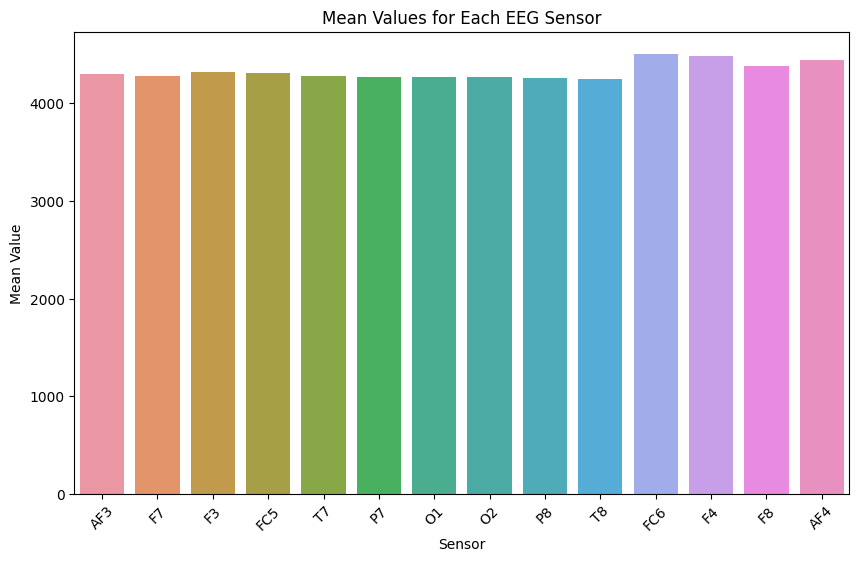

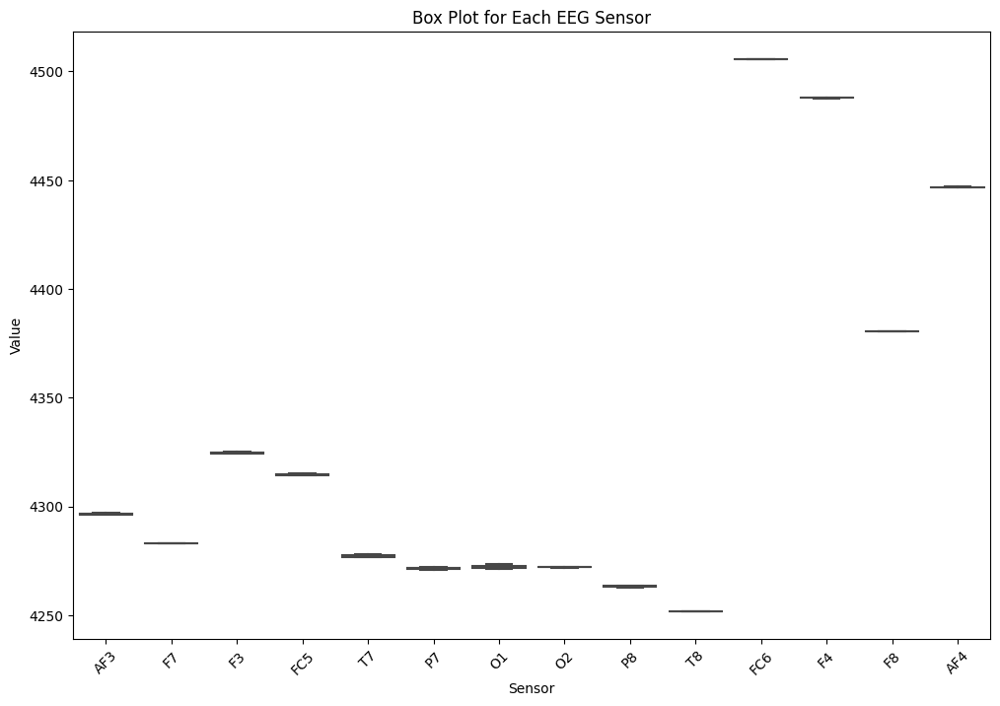

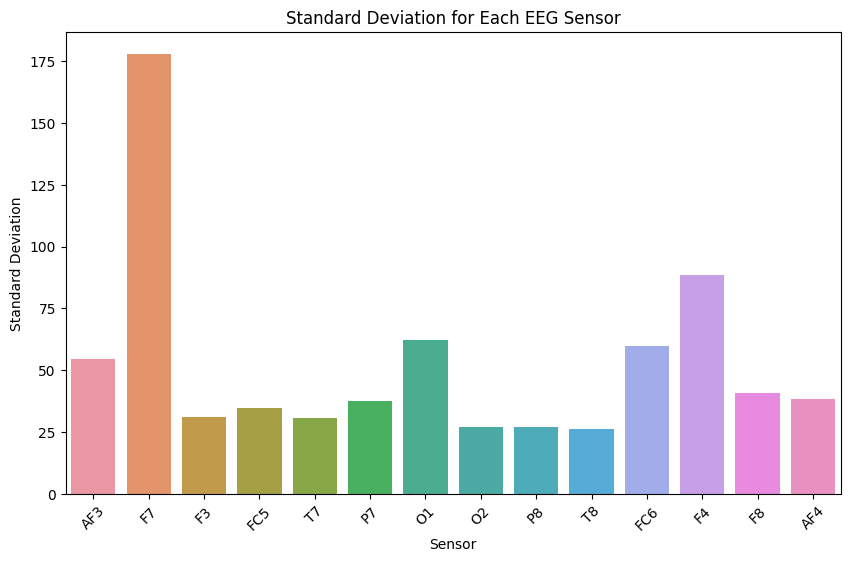

In [8]:
# Further Graphs for Participant 1:

data_participant_1 = {
    "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
    "Mean": [4296.20, 4282.89, 4324.27, 4315.10, 4276.58, 4270.71, 4271.07, 4271.92, 4262.79, 4251.99, 4505.53, 4488.15, 4380.36, 4446.99],
    "Median": [4296.92, 4283.08, 4325.13, 4314.36, 4277.95, 4272.31, 4273.33, 4272.31, 4263.59, 4251.79, 4505.64, 4487.69, 4380.51, 4446.67],
    "Variance": [2994.53, 31633.92, 975.80, 1218.28, 937.64, 1402.77, 3853.16, 737.29, 737.39, 690.21, 3558.36, 7841.24, 1680.50, 1470.76],
    "Standard Deviation": [54.72, 177.86, 31.24, 34.90, 30.62, 37.45, 62.07, 27.15, 27.15, 26.27, 59.65, 88.55, 40.99, 38.35]
}

# Create DataFrame
df_participant_1 = pd.DataFrame(data_participant_1)

# Bar Chart of Mean Values:
# To compare the mean values recorded by each sensor. Identifies which sensors have higher or lower average activity, giving an indication of the overall brain activity distribution.
# By looking at this chart, you can quickly see which sensors recorded higher average activity. For example, if the mean value for sensor FC6 is higher than others, it suggests that this area of the brain had more activity on average.
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Mean", data = df_participant_1)
plt.title('Mean Values for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.show()

# Box Plot for Each Sensor:
# To show the distribution of values for each sensor, including median, quartiles, and potential outliers. Helps in understanding the spread and variability of the data from each sensor. It can reveal any significant differences in data distribution among sensors.
# This chart helps you understand the spread of the data for each sensor. The median line inside the box shows the middle value, the edges of the box show the interquartile range (IQR), and the "whiskers" show the range of the data. Outliers are shown as individual points. If sensor F7 has a wide IQR and many outliers, it suggests a lot of variability in the data from this sensor.
plt.figure(figsize = (12, 8))
sns.boxplot(data = df_participant_1.drop(columns = ['Variance', 'Standard Deviation']).set_index('Sensor').T)
plt.title('Box Plot for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Value')
plt.xticks(rotation = 45)
plt.show()

# Bar Chart of Standard Deviation:
# To compare the variability of the data recorded by each sensor. Indicates how much variation or dispersion exists from the mean. Higher standard deviation means more variability in the data, while lower standard deviation indicates more consistency.
# Standard deviation measures the amount of variation or dispersion in the data. A higher standard deviation for sensor F7, for example, means that the data from this sensor is more spread out from the mean. This can indicate inconsistent or varied brain activity in that region.
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Standard Deviation", data = df_participant_1)
plt.title('Standard Deviation for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Standard Deviation')
plt.xticks(rotation = 45)
plt.show()

##### Participant 2:

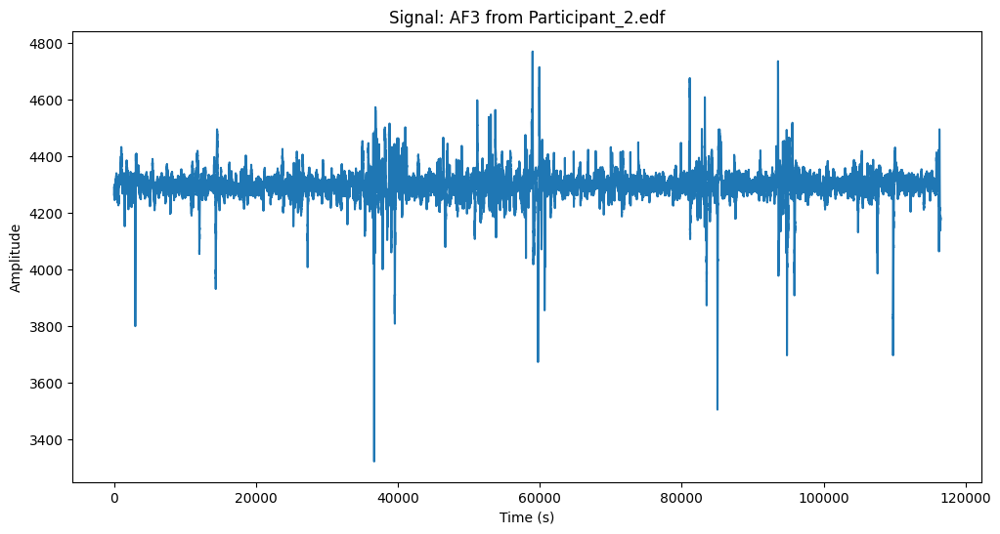

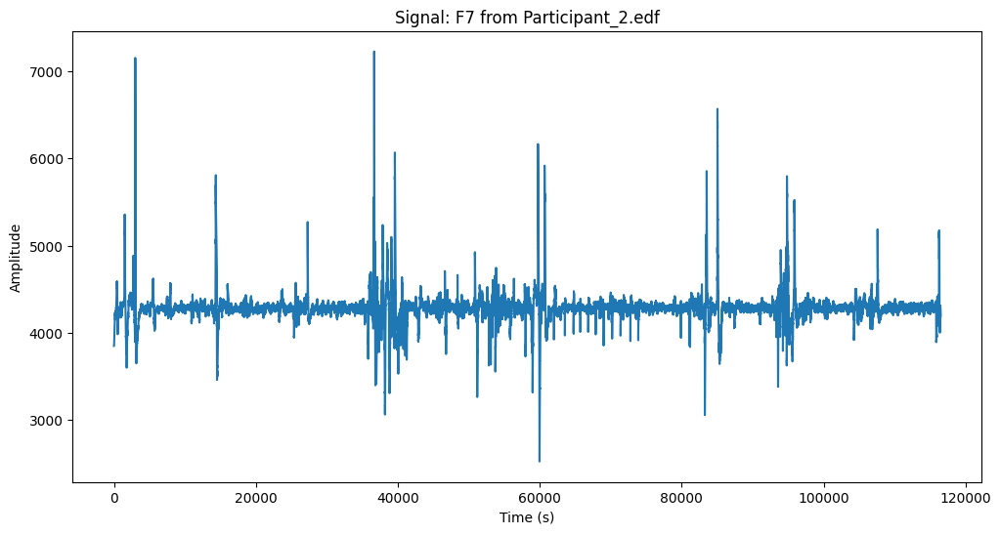

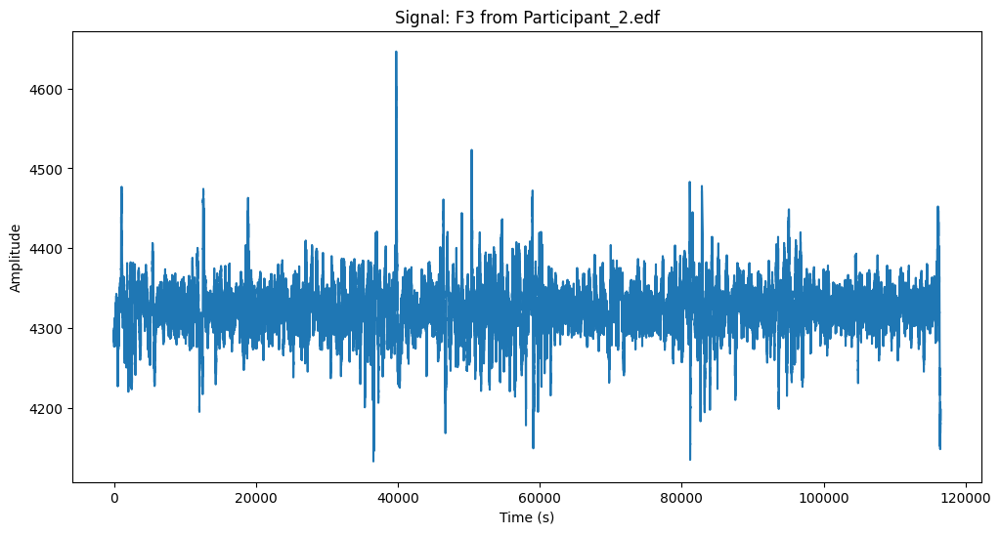

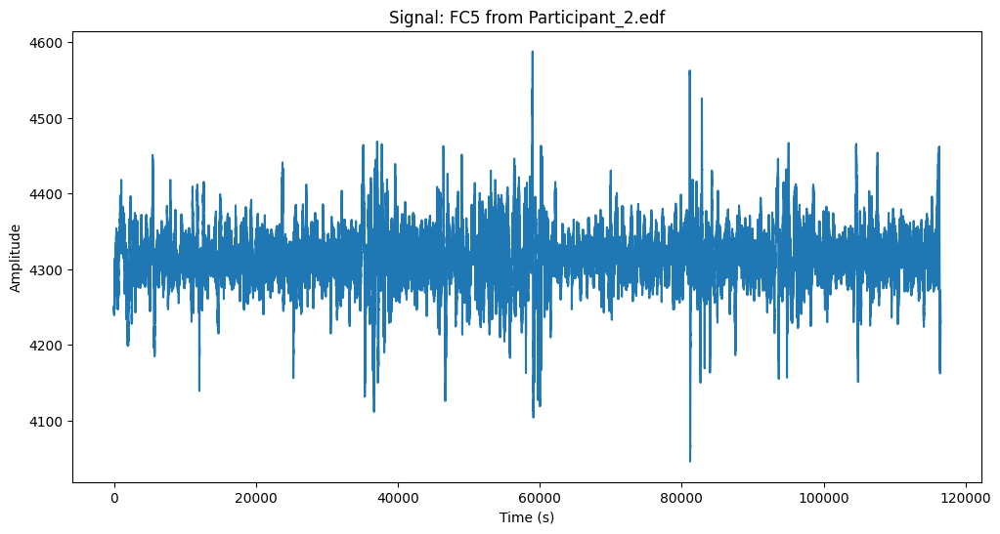

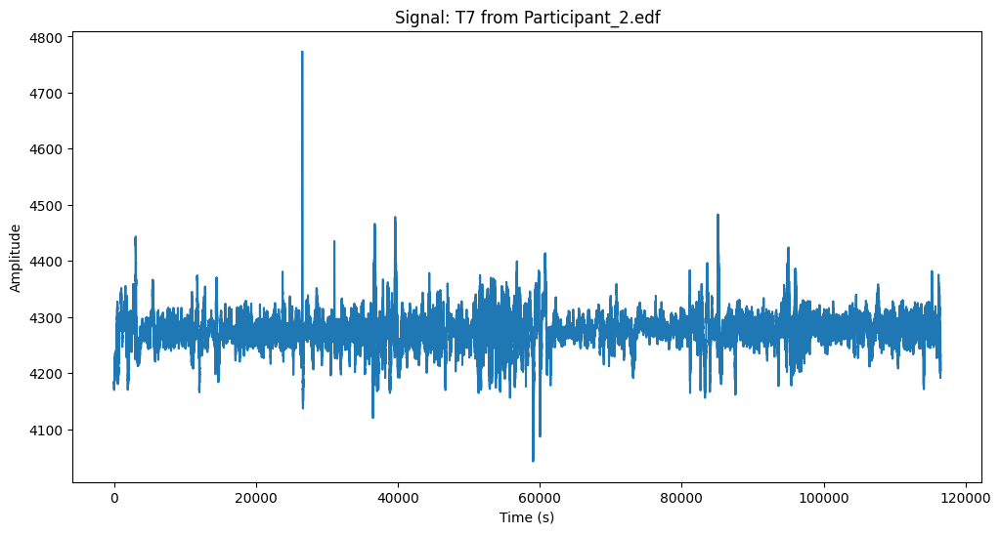

...

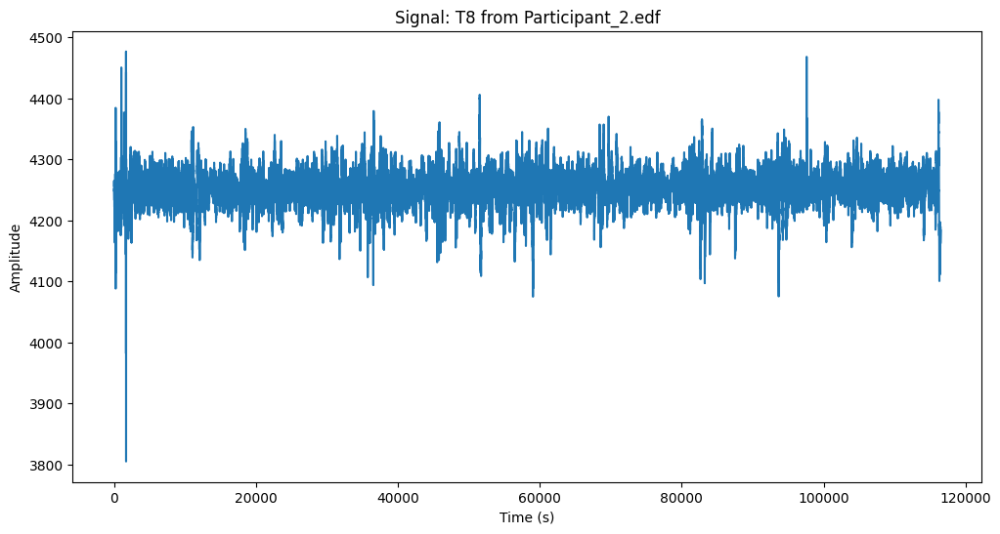

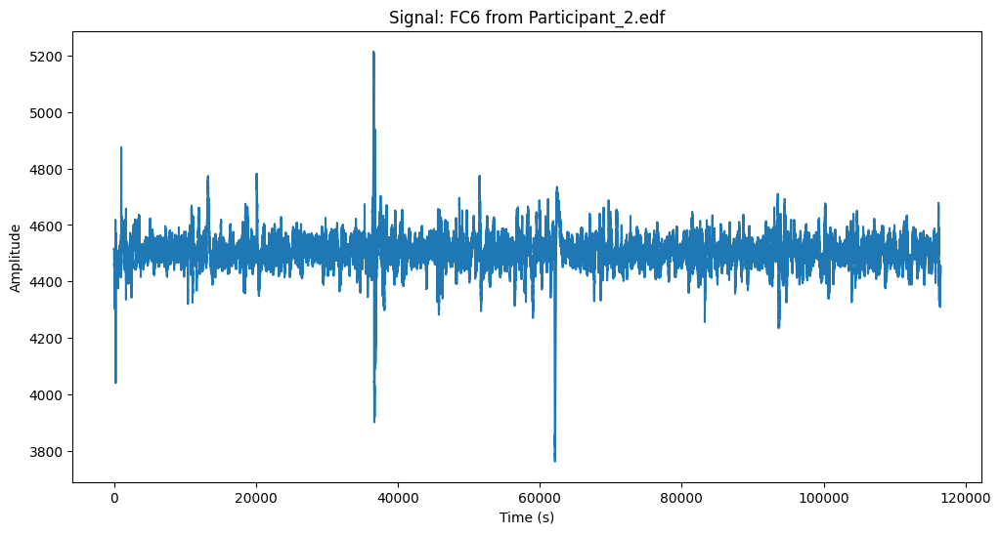

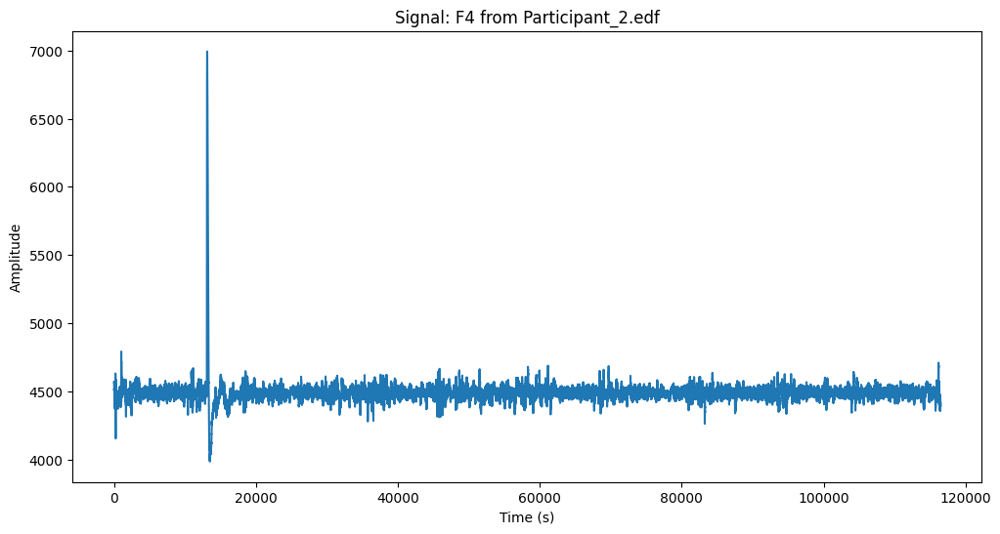

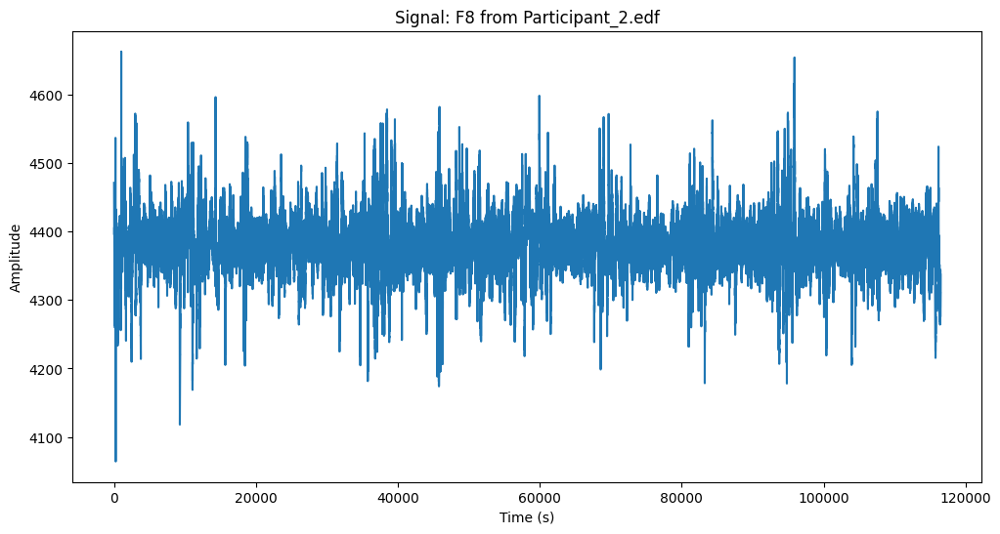

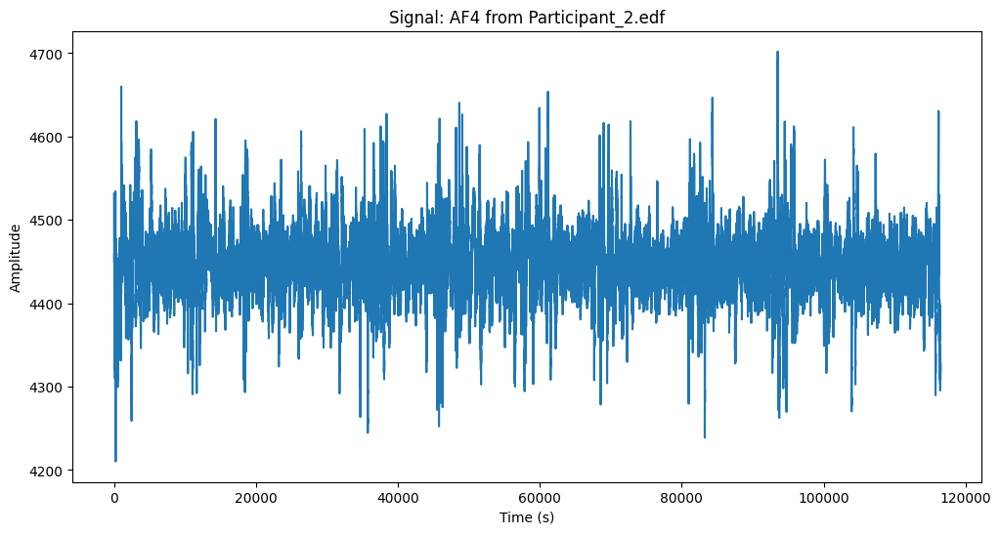

Statistics for Participant_2.edf:
Statistics for AF3:
  Mean: 4296.200051951255
  Median: 4296.923076923078
  Variance: 2994.532078345481
  Standard Deviation: 54.722317918245025

Statistics for F7:
  Mean: 4282.890946393351
  Median: 4283.076923076925
  Variance: 31633.919858129084
  Standard Deviation: 177.85926981220035

Statistics for F3:
  Mean: 4324.271233974361
  Median: 4325.128205128207
  Variance: 975.8025966881606
  Standard Deviation: 31.237839180842208

Statistics for FC5:
  Mean: 4315.097677162582
  Median: 4314.3589743589755
  Variance: 1218.282215697764
  Standard Deviation: 34.90389972048631

Statistics for T7:
  Mean: 4276.579023140323
  Median: 4277.94871794872
  Variance: 937.6413132731186
  Standard Deviation: 30.620929333923204

Statistics for P7:
  Mean: 4270.708086785011
  Median: 4272.307692307694
  Variance: 1402.7693565790398
  Standard Deviation: 37.4535626687107

Statistics for O1:
  Mean: 4271.071089567485
  Median: 4273.333333333335
  Variance: 3853.16278

In [9]:
analyse_edf(file_participant_2, channels_of_interest)

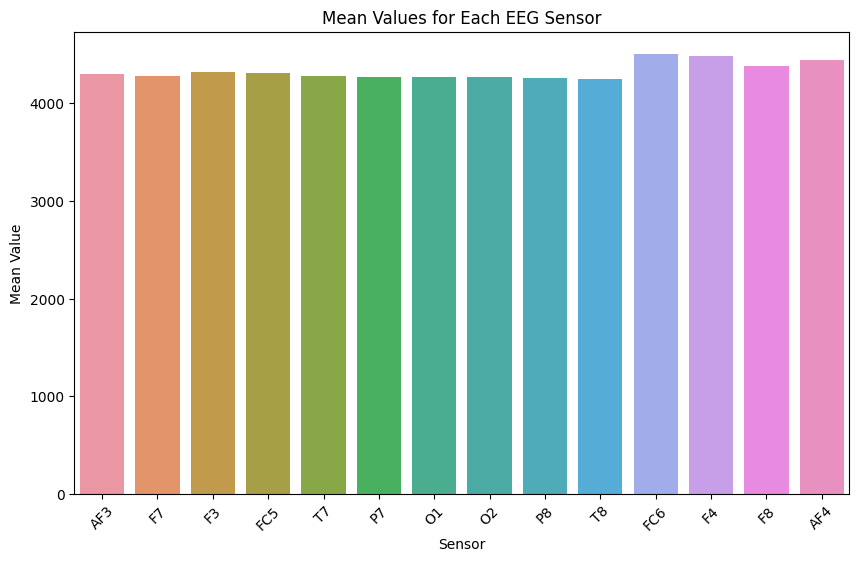

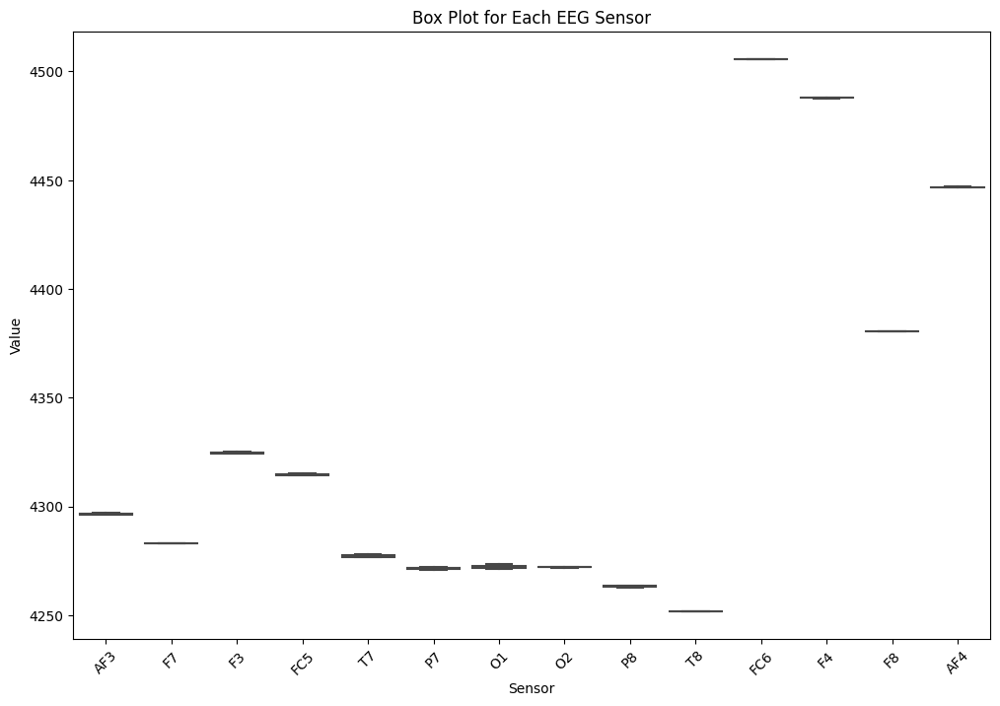

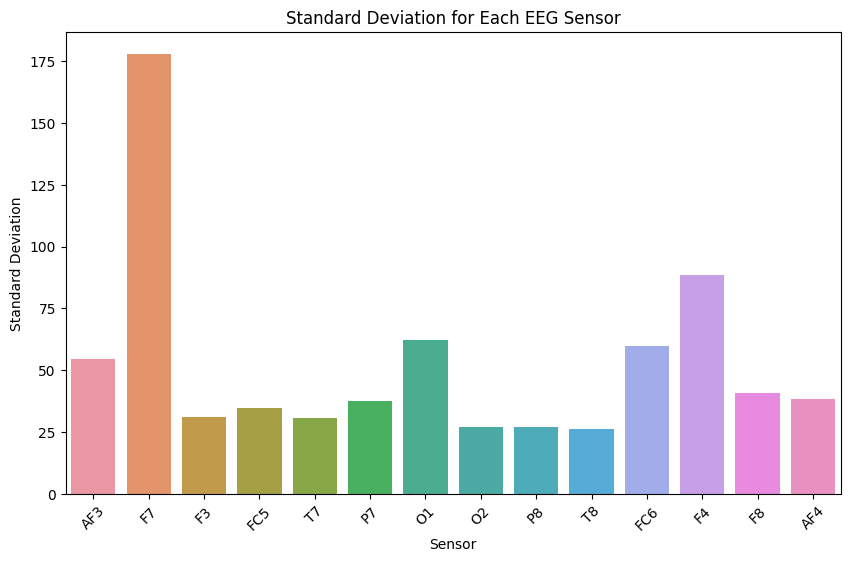

In [10]:
# Further Graphs for Participant 2:

data_participant_2 = {
    "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
    "Mean": [4296.20, 4282.89, 4324.27, 4315.10, 4276.58, 4270.71, 4271.07, 4271.92, 4262.79, 4251.99, 4505.53, 4488.15, 4380.36, 4446.99],
    "Median": [4296.92, 4283.08, 4325.13, 4314.36, 4277.95, 4272.31, 4273.33, 4272.31, 4263.59, 4251.79, 4505.64, 4487.69, 4380.51, 4446.67],
    "Variance": [2994.53, 31633.92, 975.80, 1218.28, 937.64, 1402.77, 3853.16, 737.29, 737.39, 690.21, 3558.36, 7841.24, 1680.50, 1470.76],
    "Standard Deviation": [54.72, 177.86, 31.24, 34.90, 30.62, 37.45, 62.07, 27.15, 27.15, 26.27, 59.65, 88.55, 40.99, 38.35]
}

# Create DataFrame
df_participant_2 = pd.DataFrame(data_participant_2)

# Bar Chart of Mean Values:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Mean", data = df_participant_2)
plt.title('Mean Values for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.show()

# Box Plot for Each Sensor:
plt.figure(figsize = (12, 8))
sns.boxplot(data = df_participant_2.drop(columns = ['Variance', 'Standard Deviation']).set_index('Sensor').T)
plt.title('Box Plot for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Value')
plt.xticks(rotation = 45)
plt.show()

# Bar Chart of Standard Deviation:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Standard Deviation", data = df_participant_2)
plt.title('Standard Deviation for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Standard Deviation')
plt.xticks(rotation = 45)
plt.show()

##### Participant 3:

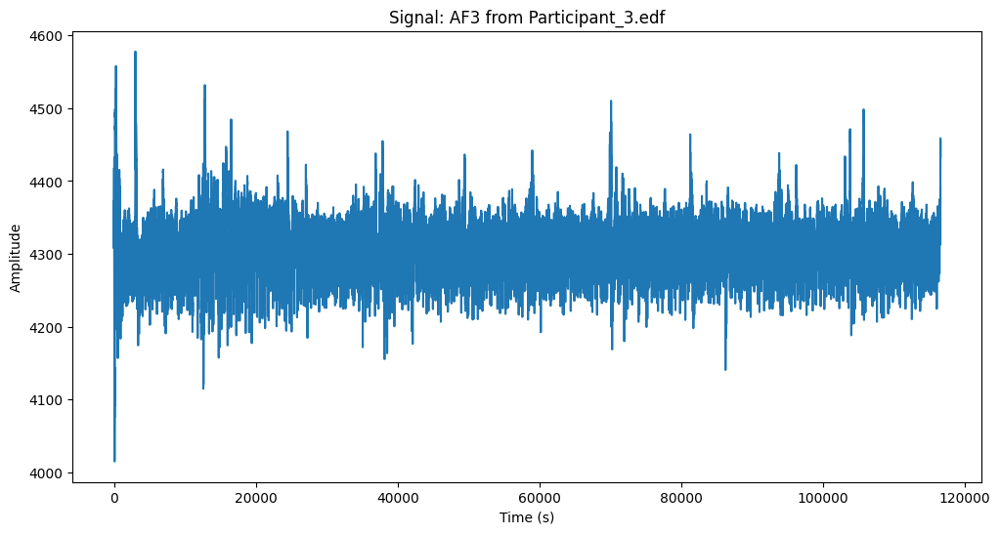

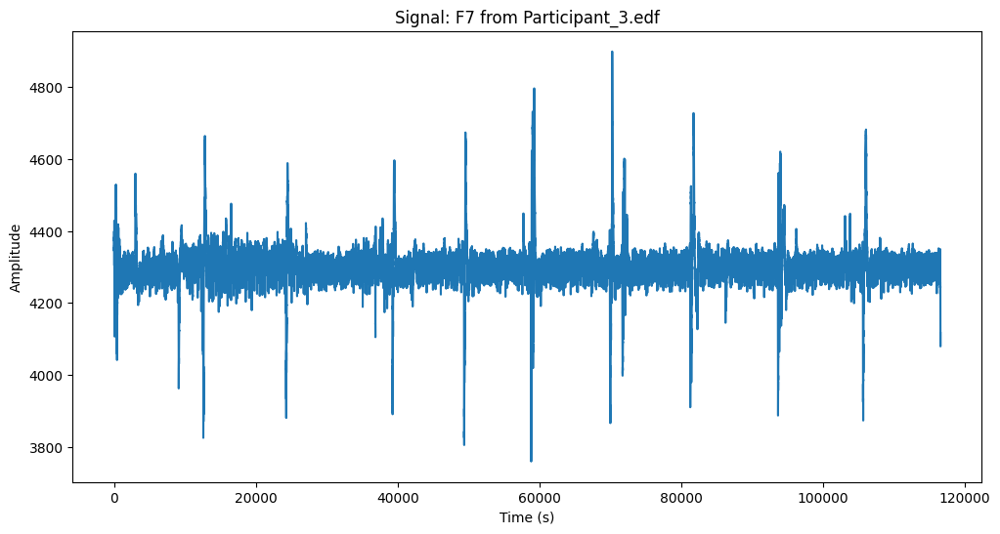

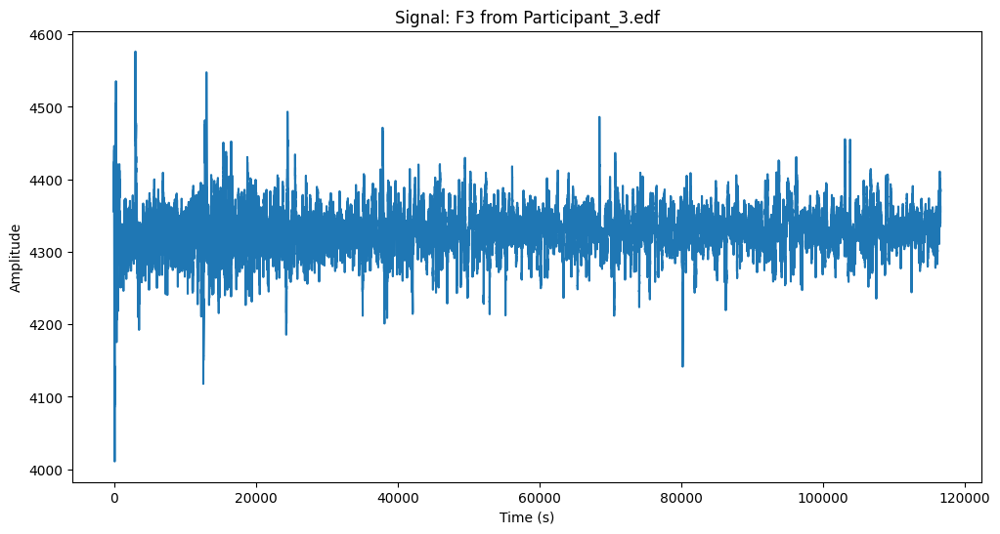

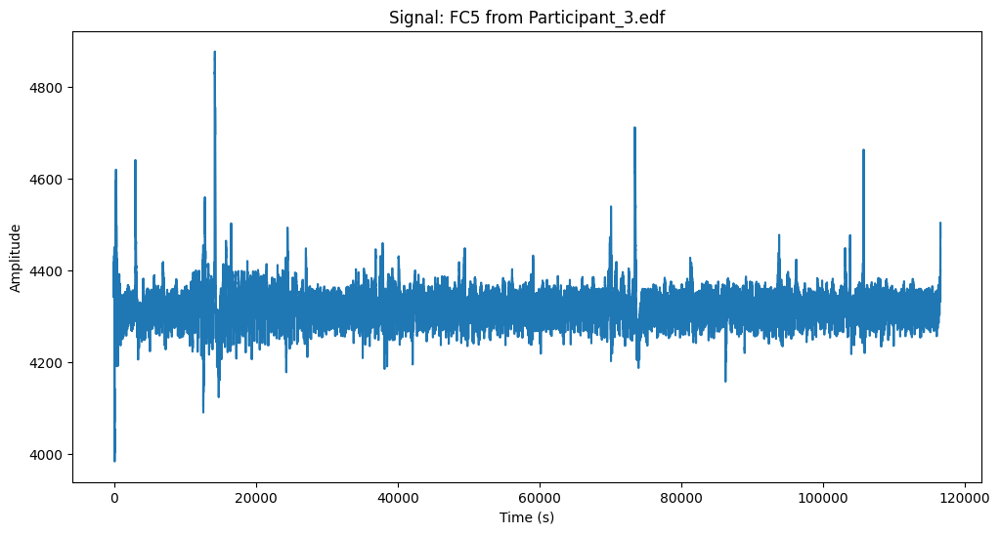

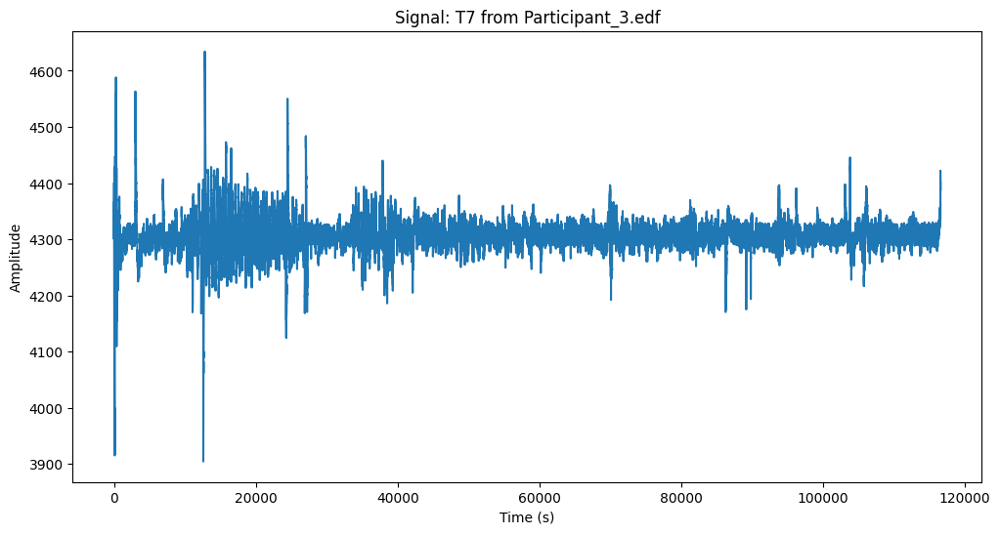

...

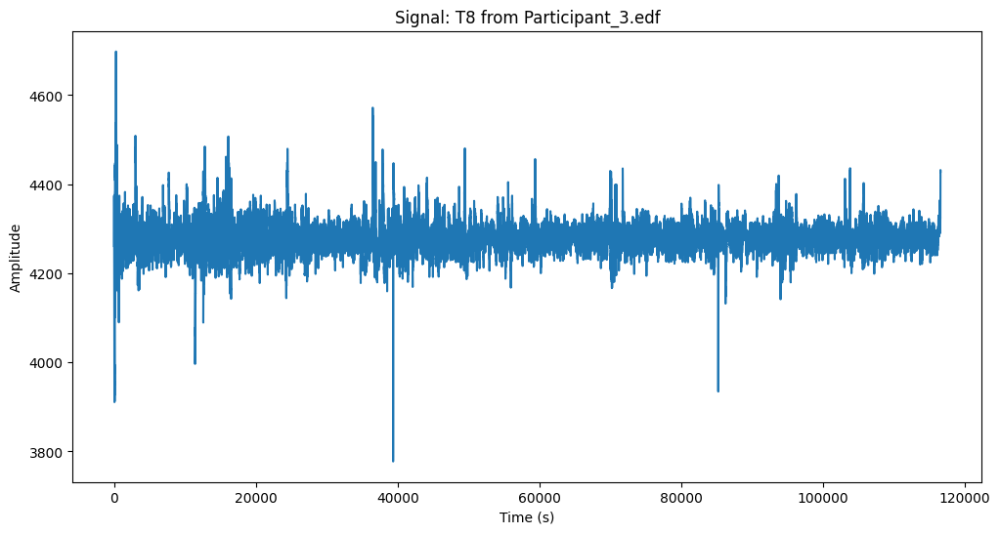

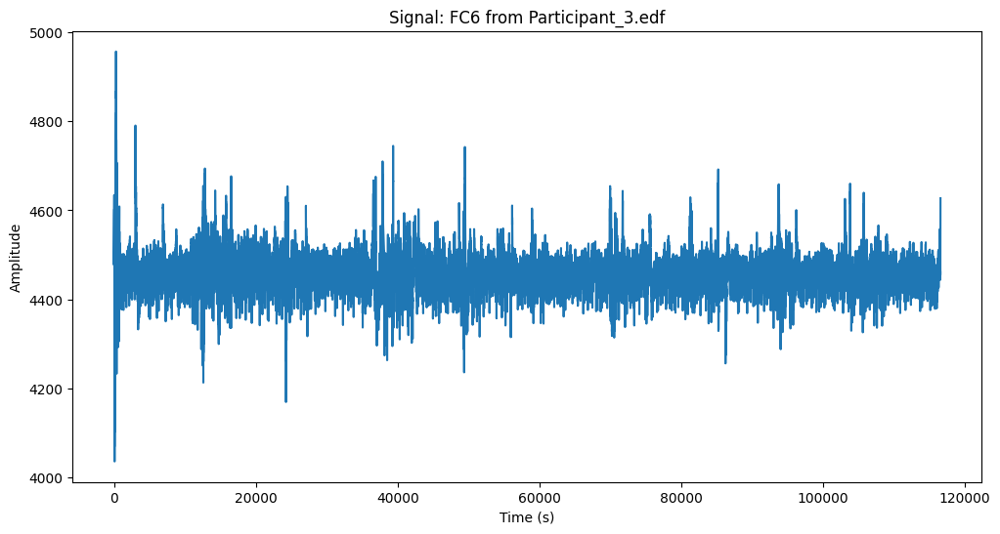

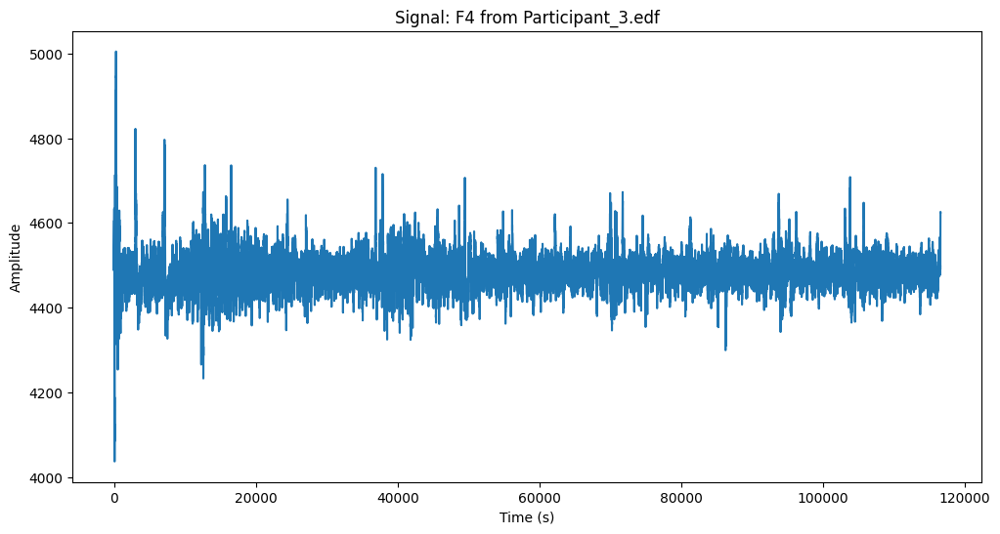

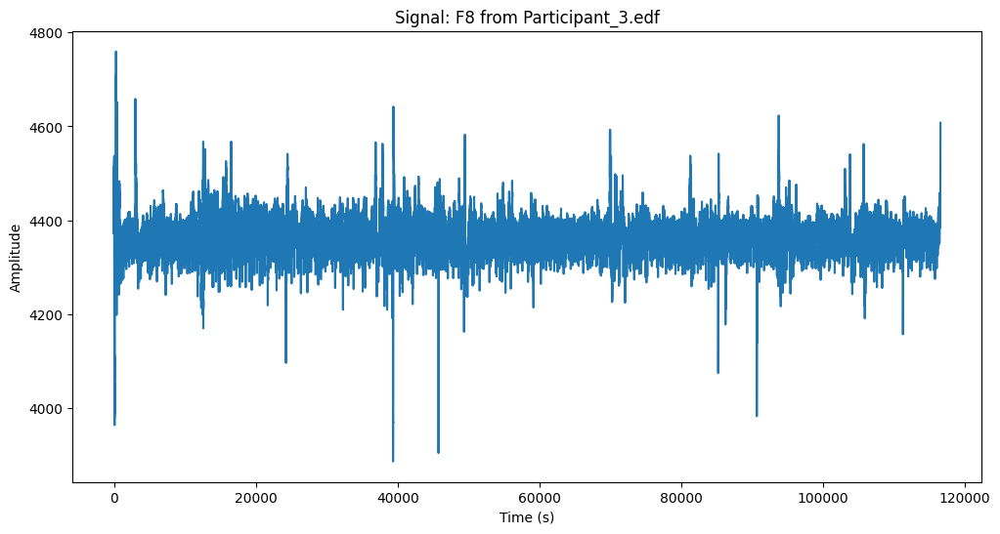

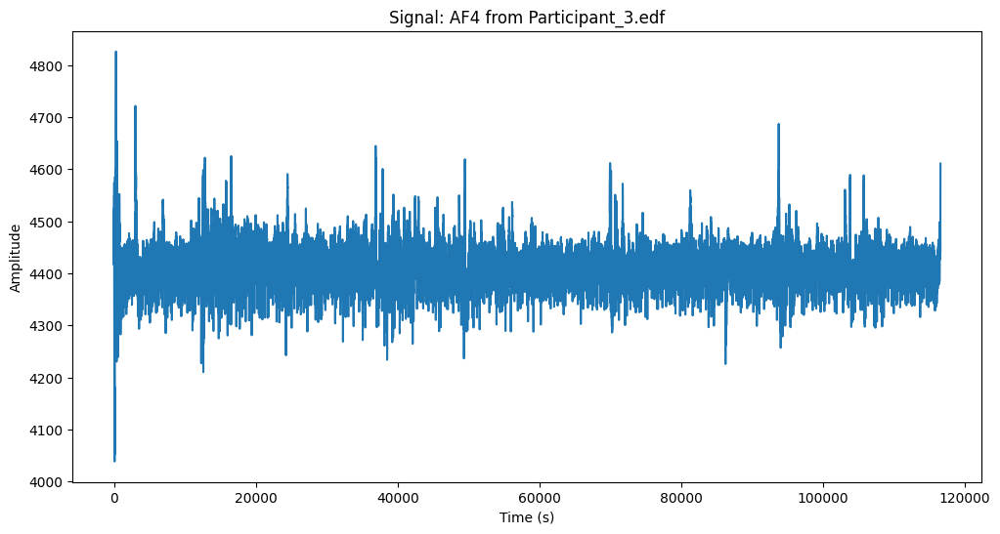

Statistics for Participant_3.edf:
Statistics for AF3:
  Mean: 4323.103573841089
  Median: 4324.615384615386
  Variance: 839.6524017485528
  Standard Deviation: 28.97675623234169

Statistics for F7:
  Mean: 4314.086415322696
  Median: 4314.3589743589755
  Variance: 2835.278657269406
  Standard Deviation: 53.247334743340964

Statistics for F3:
  Mean: 4330.486464402321
  Median: 4330.769230769232
  Variance: 931.5666517485263
  Standard Deviation: 30.521576822774513

Statistics for FC5:
  Mean: 4334.012035062908
  Median: 4335.384615384617
  Variance: 1116.2972548617995
  Standard Deviation: 33.41103492652988

Statistics for T7:
  Mean: 4310.412378796196
  Median: 4310.769230769232
  Variance: 833.0804267213957
  Standard Deviation: 28.86313265606136

Statistics for P7:
  Mean: 4308.401499479301
  Median: 4308.20512820513
  Variance: 709.9115937031535
  Standard Deviation: 26.644166222705365

Statistics for O1:
  Mean: 4306.270876431931
  Median: 4307.179487179489
  Variance: 1072.044262

In [11]:
analyse_edf(file_participant_3, channels_of_interest)

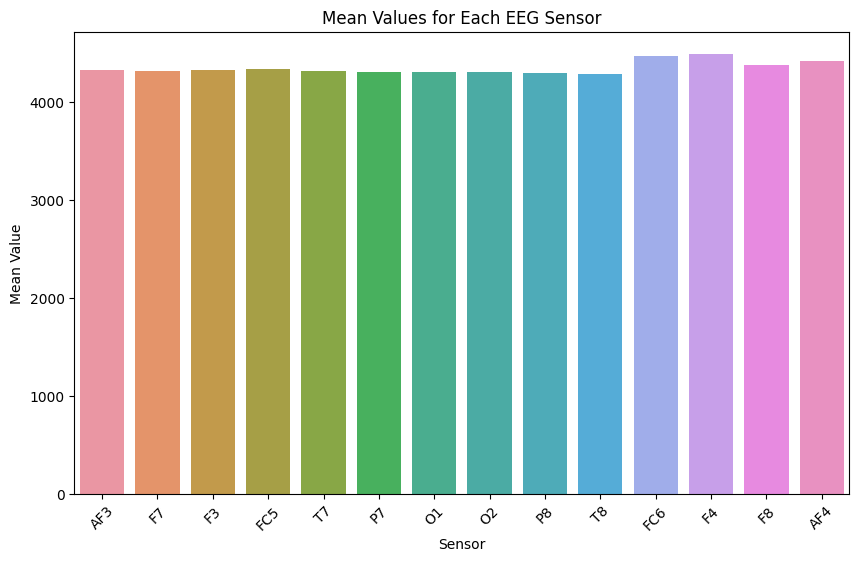

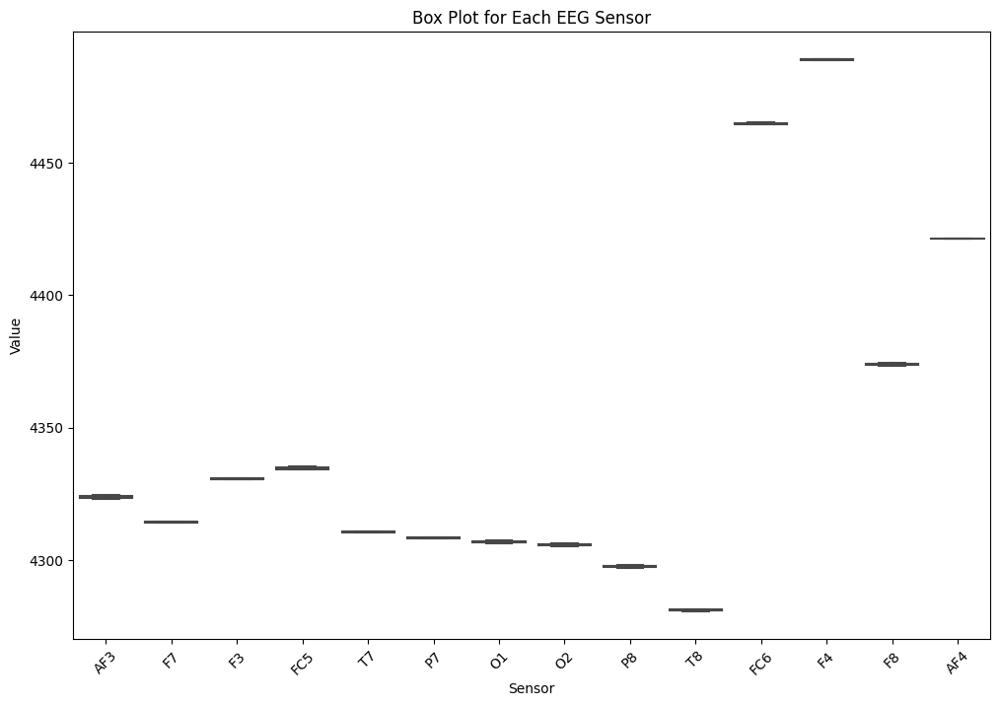

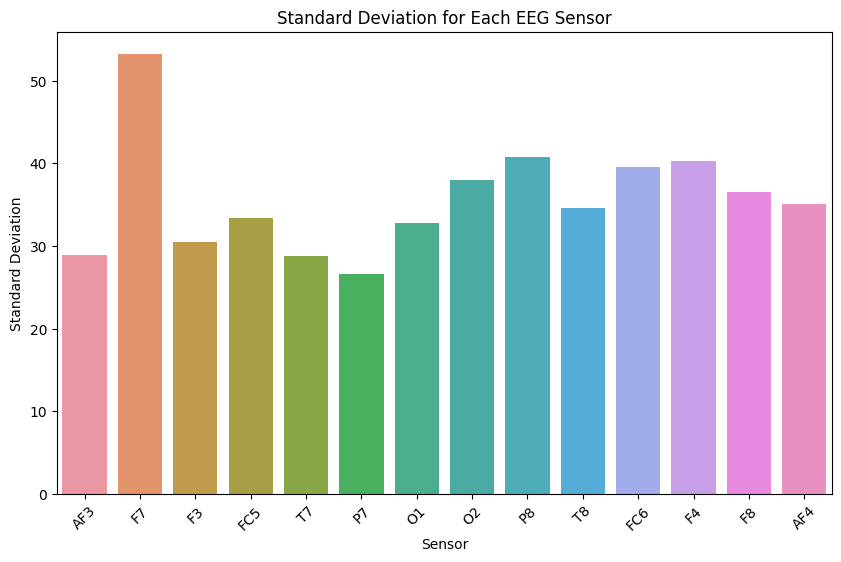

In [12]:
# Further Graphs for Participant 3:

data_participant_3 = {
    "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
    "Mean": [4323.10, 4314.09, 4330.49, 4334.01, 4310.41, 4308.40, 4306.27, 4305.29, 4297.00, 4281.28, 4465.36, 4488.97, 4373.42, 4421.28],
    "Median": [4324.62, 4314.36, 4330.77, 4335.38, 4310.77, 4308.21, 4307.18, 4306.15, 4297.95, 4280.51, 4464.62, 4489.23, 4374.36, 4421.54],
    "Variance": [839.65, 2835.28, 931.57, 1116.30, 833.08, 709.91, 1072.04, 1440.50, 1660.47, 1200.47, 1562.35, 1625.27, 1331.46, 1229.16],
    "Standard Deviation": [28.98, 53.25, 30.52, 33.41, 28.86, 26.64, 32.74, 37.95, 40.75, 34.65, 39.53, 40.31, 36.49, 35.06]
}

# Create DataFrame
df_participant_3 = pd.DataFrame(data_participant_3)

# Bar Chart of Mean Values:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Mean", data = df_participant_3)
plt.title('Mean Values for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.show()

# Box Plot for Each Sensor:
plt.figure(figsize = (12, 8))
sns.boxplot(data = df_participant_3.drop(columns = ['Variance', 'Standard Deviation']).set_index('Sensor').T)
plt.title('Box Plot for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Value')
plt.xticks(rotation = 45)
plt.show()

# Bar Chart of Standard Deviation:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Standard Deviation", data = df_participant_3)
plt.title('Standard Deviation for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Standard Deviation')
plt.xticks(rotation = 45)
plt.show()

##### Participant 4:

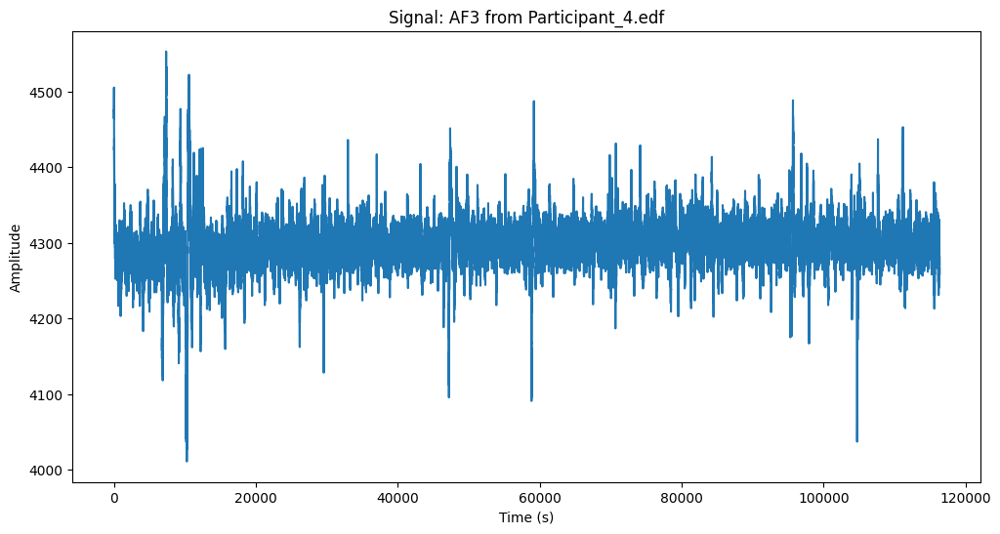

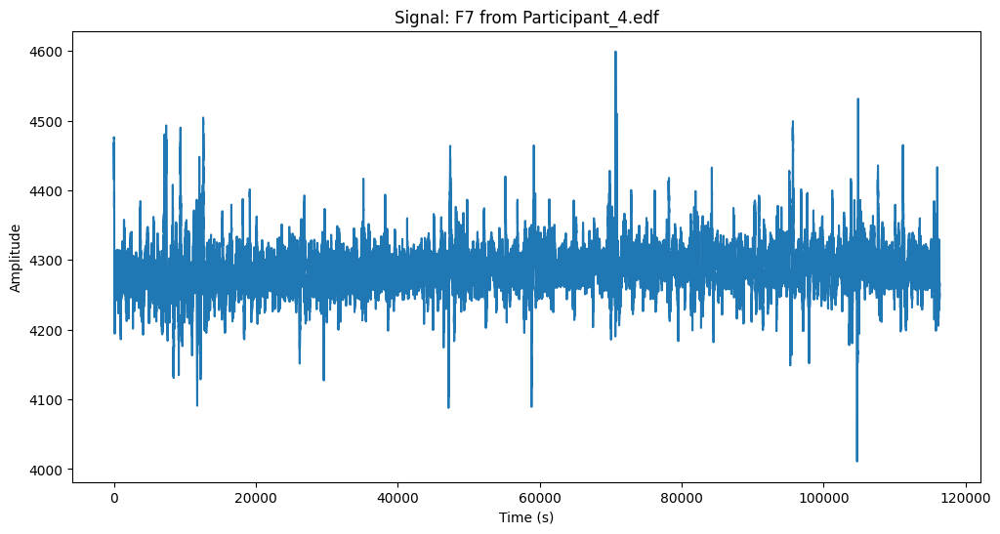

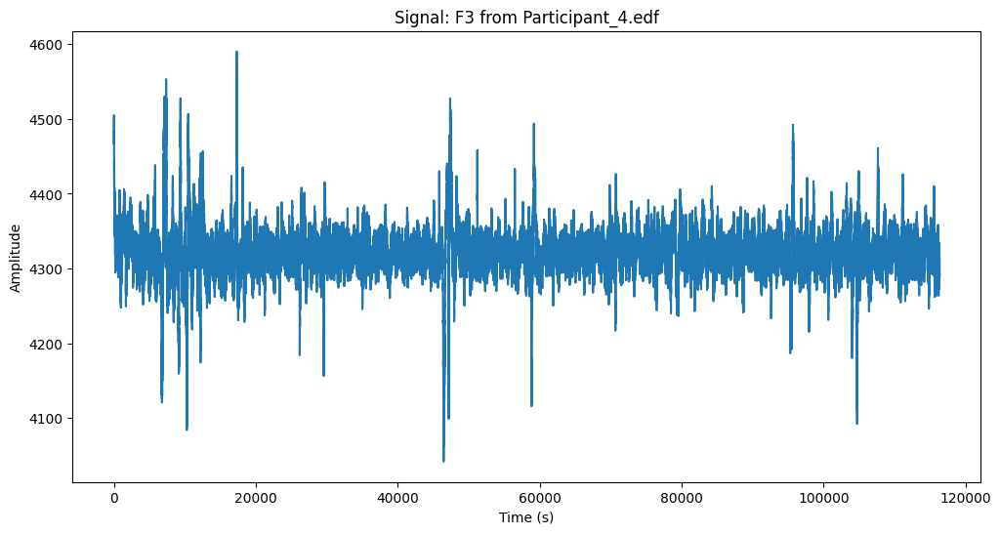

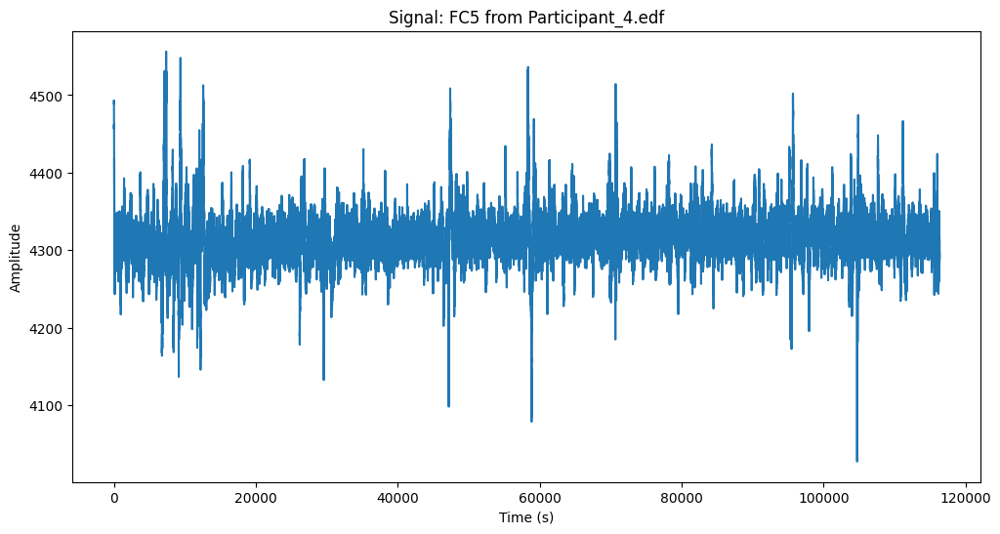

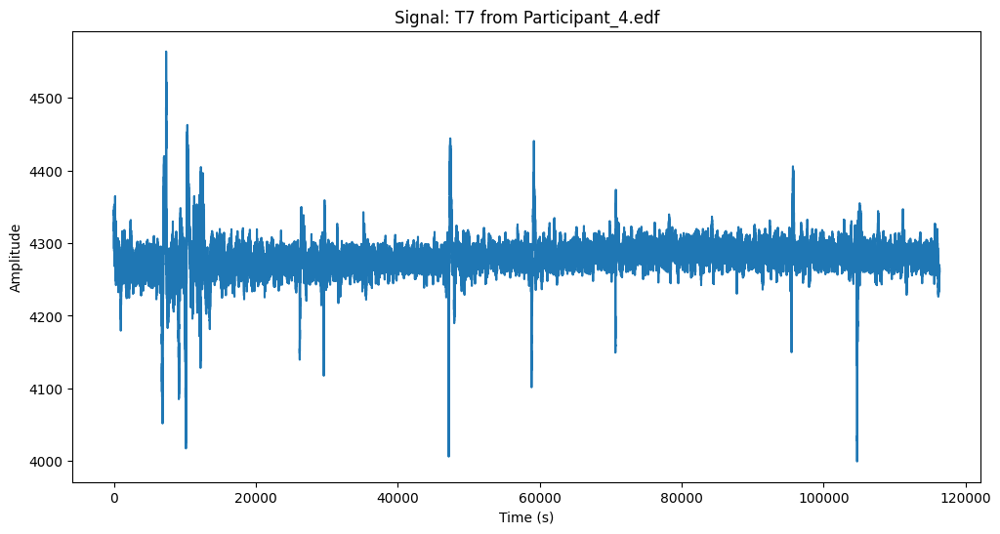

...

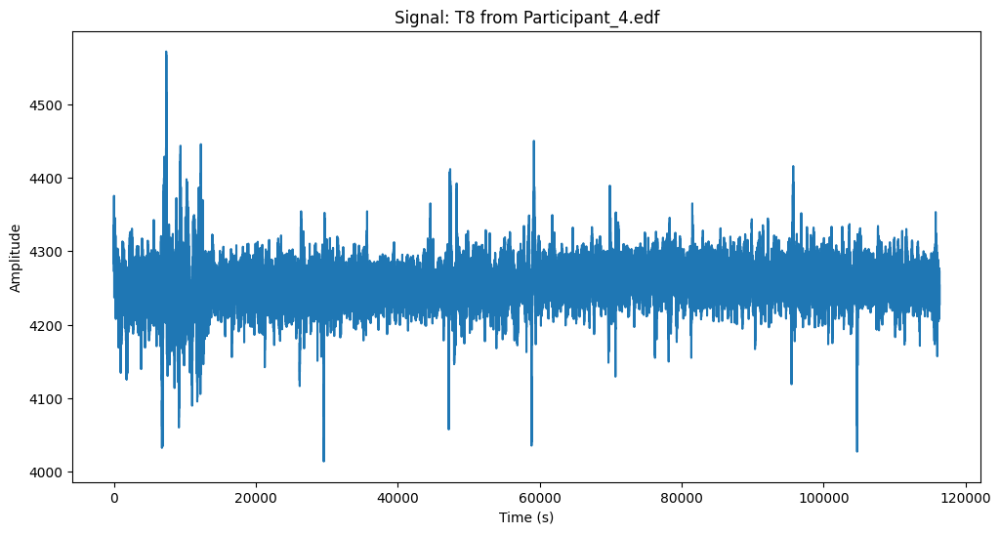

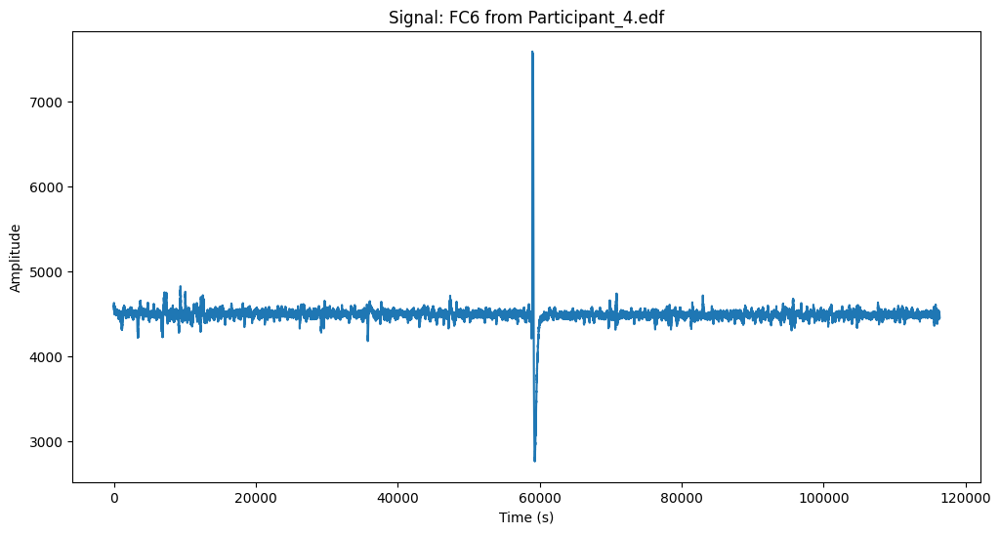

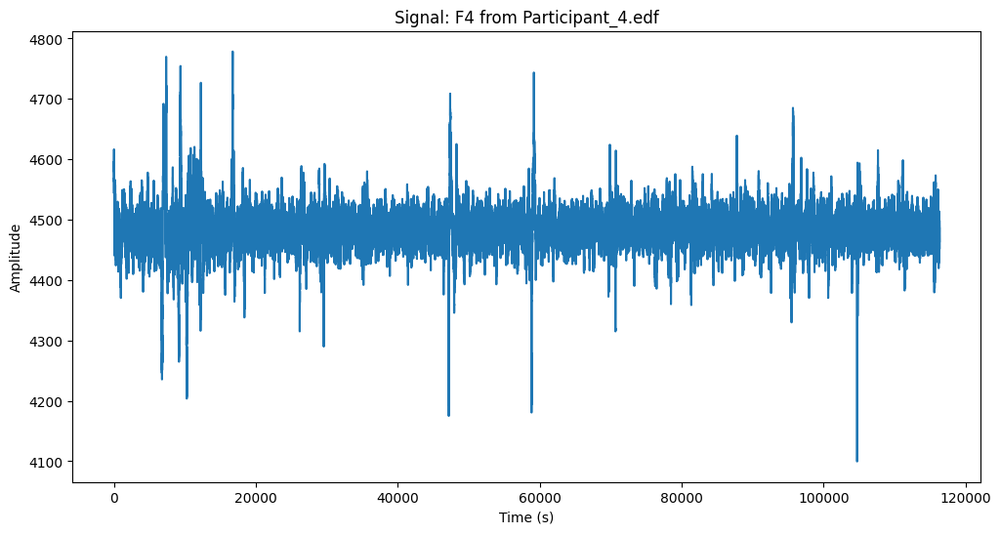

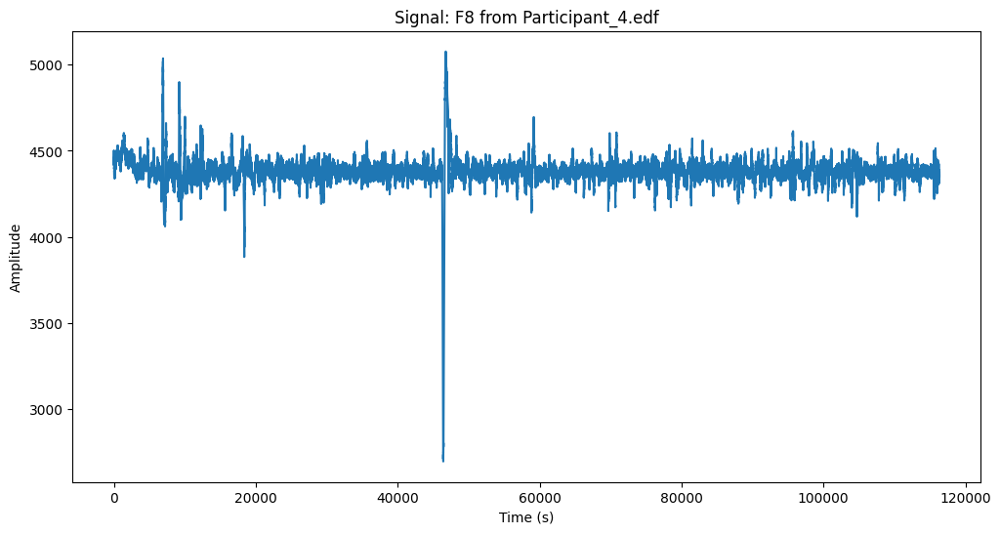

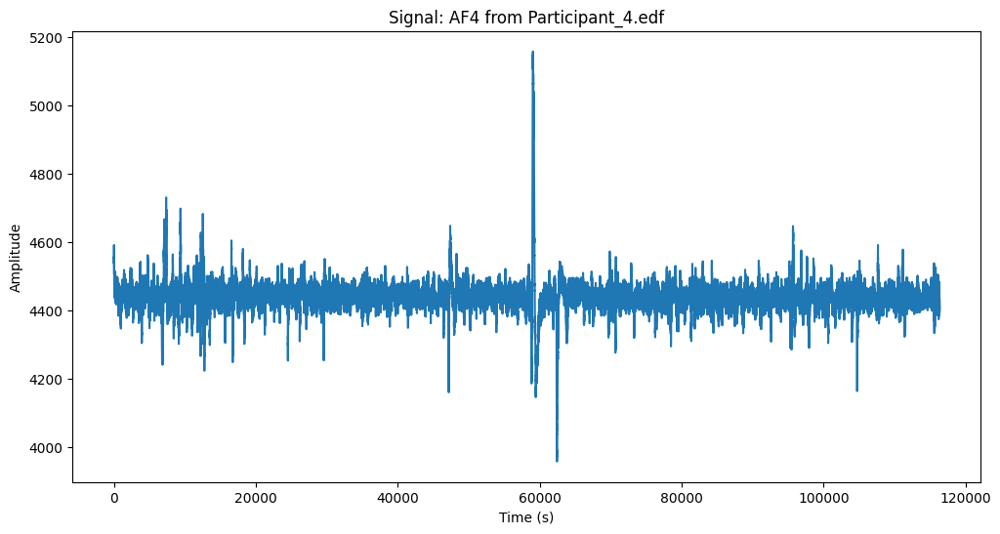

Statistics for Participant_4.edf:
Statistics for AF3:
  Mean: 4298.939151928016
  Median: 4299.487179487181
  Variance: 997.6525733468194
  Standard Deviation: 31.5856387199439

Statistics for F7:
  Mean: 4288.147116795015
  Median: 4288.20512820513
  Variance: 1018.8878507209777
  Standard Deviation: 31.920022724318002

Statistics for F3:
  Mean: 4322.784776875126
  Median: 4322.564102564104
  Variance: 1037.4273125302911
  Standard Deviation: 32.20911846869286

Statistics for FC5:
  Mean: 4316.375309405942
  Median: 4315.897435897437
  Variance: 979.2944492749322
  Standard Deviation: 31.29368066039743

Statistics for T7:
  Mean: 4280.736553623312
  Median: 4280.512820512822
  Variance: 611.5183307744978
  Standard Deviation: 24.728896675235994

Statistics for P7:
  Mean: 4278.620538736567
  Median: 4279.487179487181
  Variance: 799.5668812435013
  Standard Deviation: 28.2766136806284

Statistics for O1:
  Mean: 4274.669156018168
  Median: 4276.410256410258
  Variance: 944.8291049851

In [13]:
analyse_edf(file_participant_4, channels_of_interest)

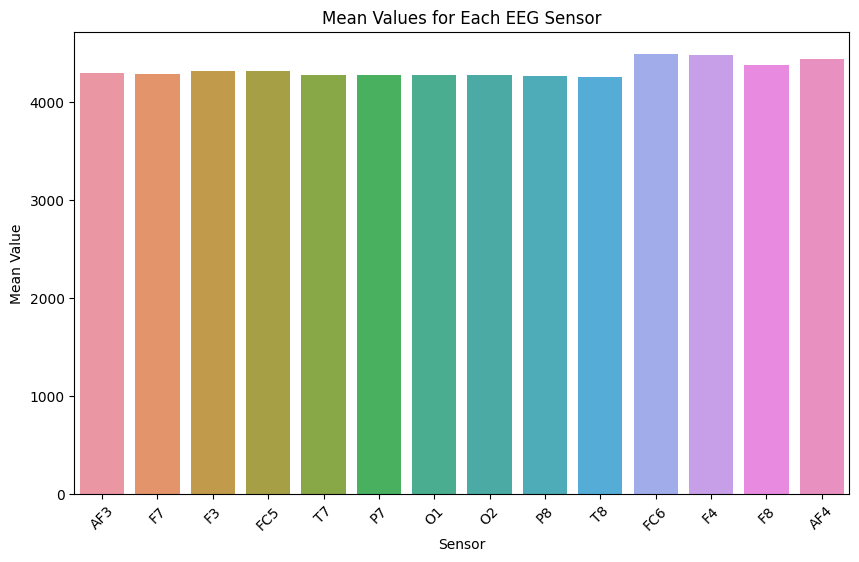

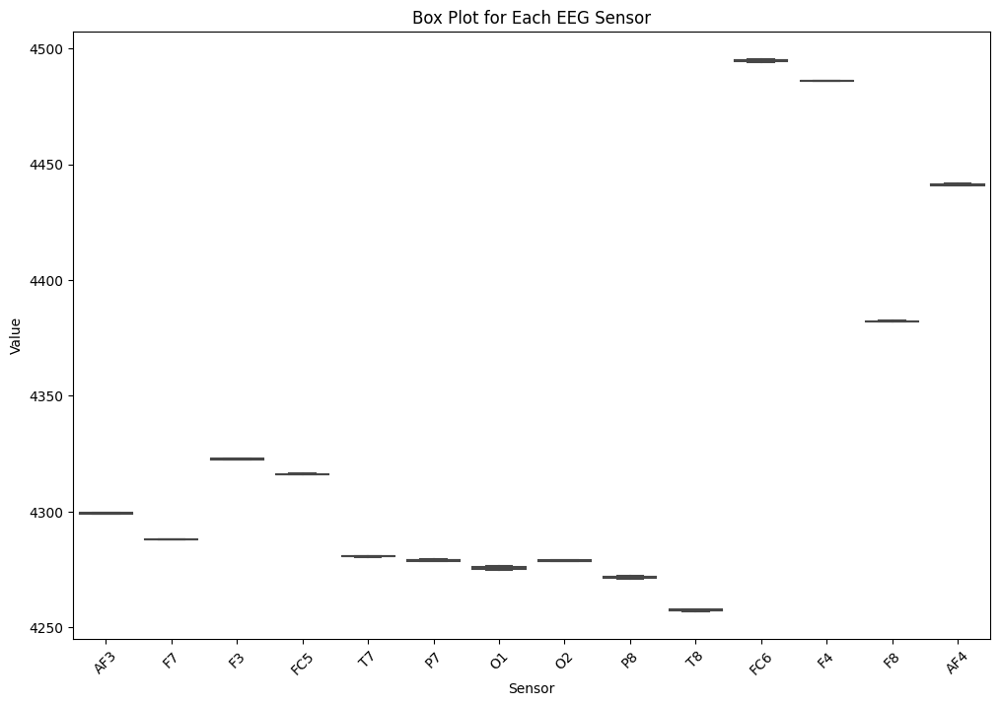

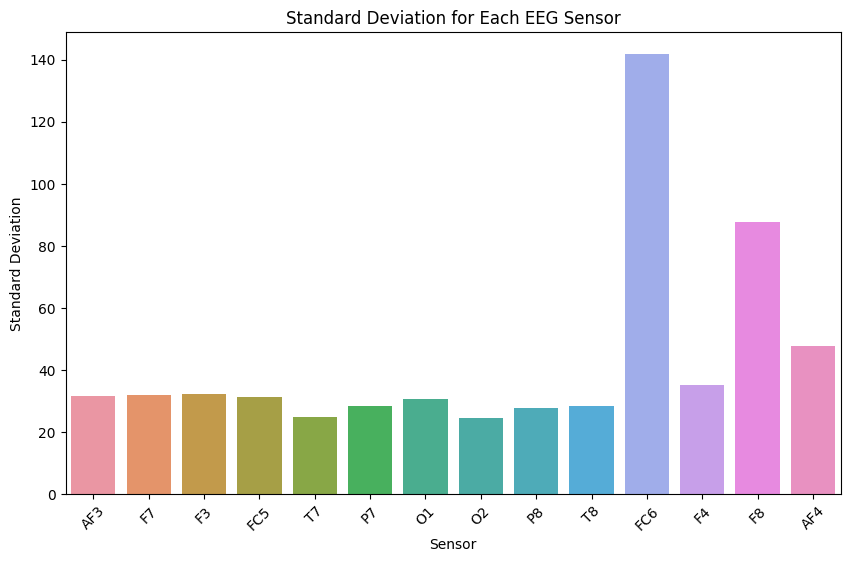

In [14]:
# Further Graphs for Participant 4:

data_participant_4 = {
    "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
    "Mean": [4298.94, 4288.15, 4322.78, 4316.38, 4280.74, 4278.62, 4274.67, 4278.52, 4271.10, 4256.92, 4494.13, 4485.97, 4382.36, 4440.75],
    "Median": [4299.49, 4288.21, 4322.56, 4315.90, 4280.51, 4279.49, 4276.41, 4278.97, 4272.31, 4257.95, 4495.38, 4486.15, 4382.05, 4441.54],
    "Variance": [997.65, 1018.89, 1037.43, 979.29, 611.52, 799.57, 944.83, 605.17, 765.46, 800.01, 20104.29, 1229.00, 7660.60, 2278.38],
    "Standard Deviation": [31.59, 31.92, 32.21, 31.29, 24.73, 28.28, 30.74, 24.60, 27.67, 28.28, 141.79, 35.06, 87.52, 47.73]
}

# Create DataFrame
df_participant_4 = pd.DataFrame(data_participant_4)

# Bar Chart of Mean Values:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Mean", data = df_participant_4)
plt.title('Mean Values for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.show()

# Box Plot for Each Sensor:
plt.figure(figsize = (12, 8))
sns.boxplot(data = df_participant_4.drop(columns = ['Variance', 'Standard Deviation']).set_index('Sensor').T)
plt.title('Box Plot for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Value')
plt.xticks(rotation = 45)
plt.show()

# Bar Chart of Standard Deviation:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Standard Deviation", data = df_participant_4)
plt.title('Standard Deviation for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Standard Deviation')
plt.xticks(rotation = 45)
plt.show()

##### Participant 5:

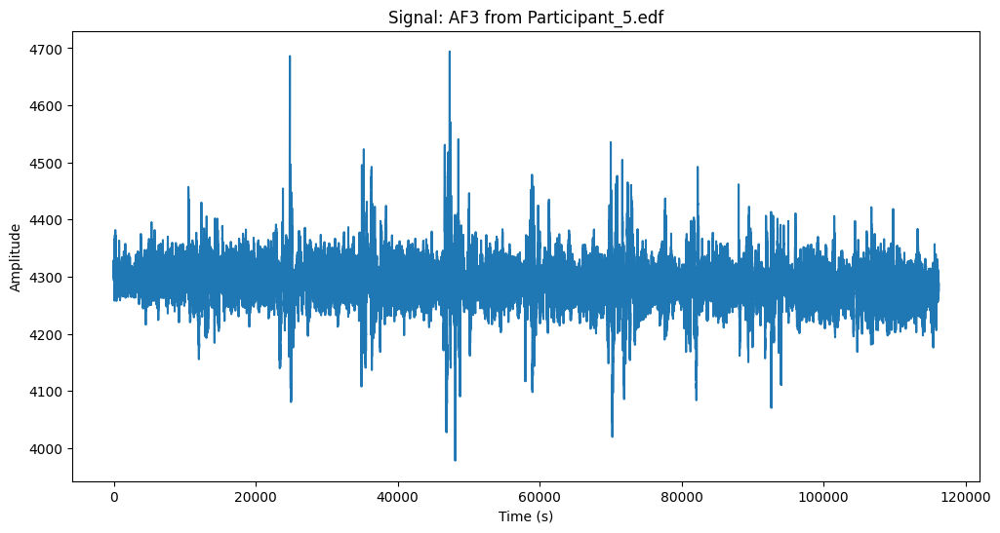

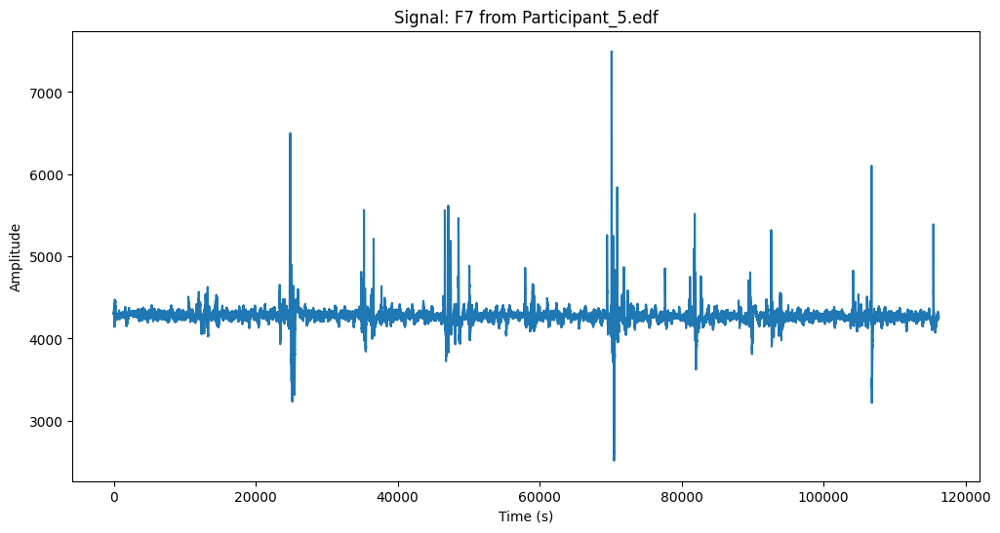

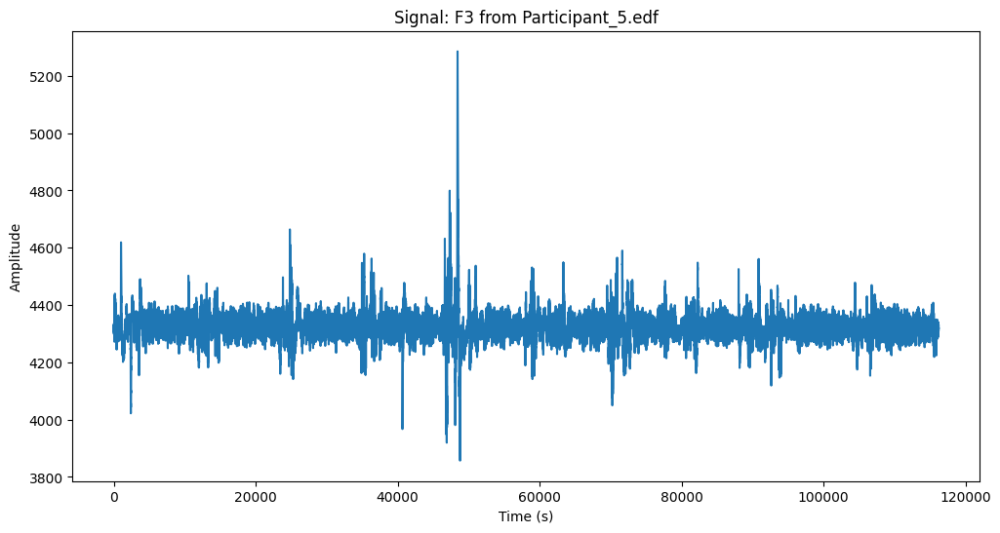

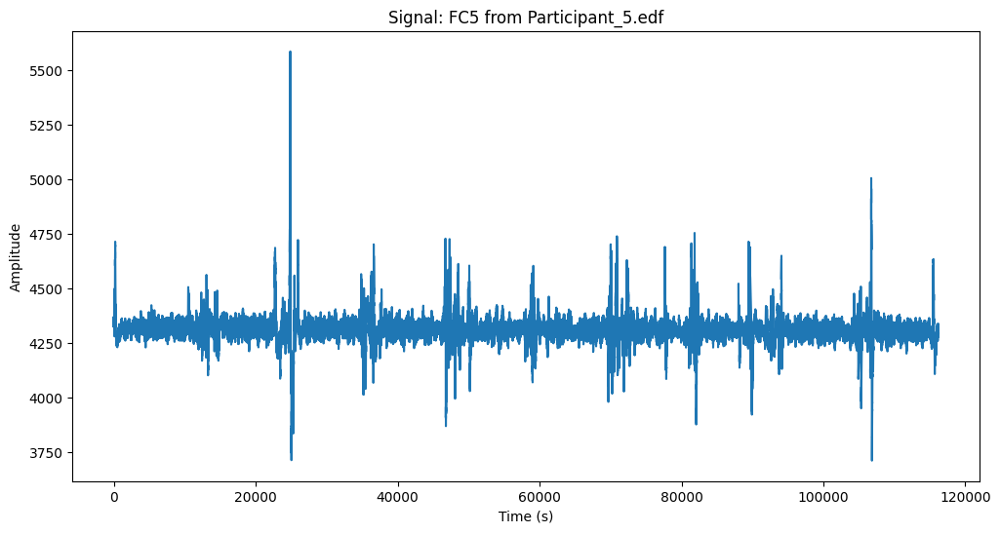

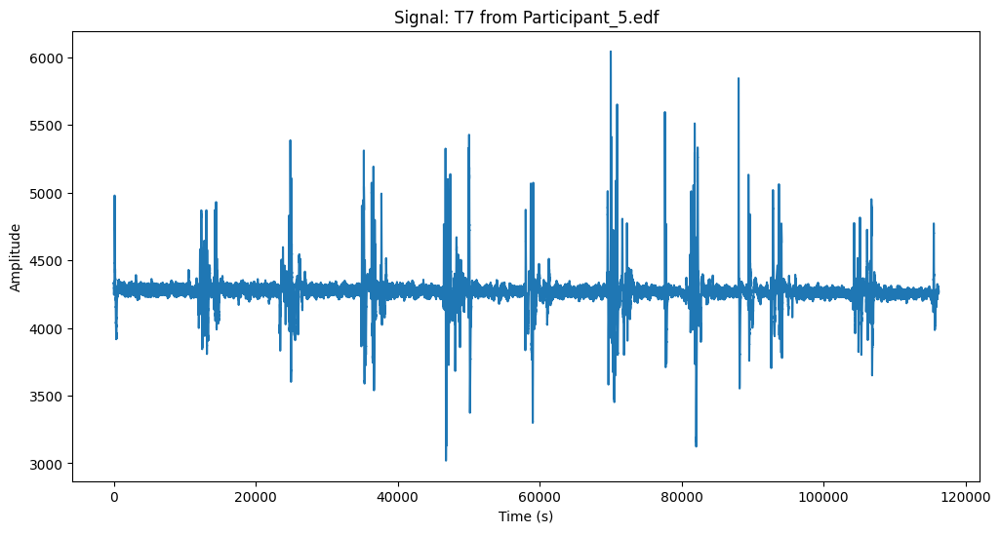

...

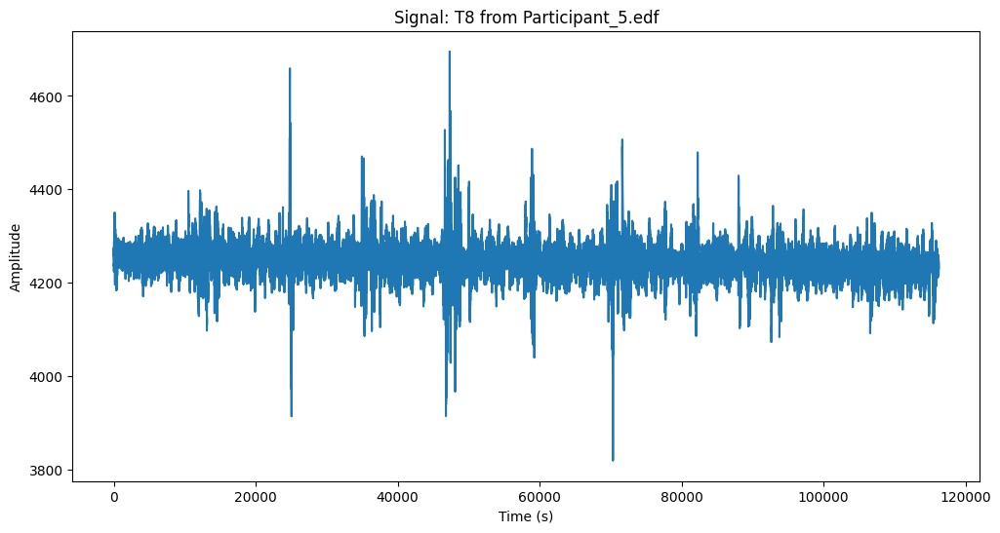

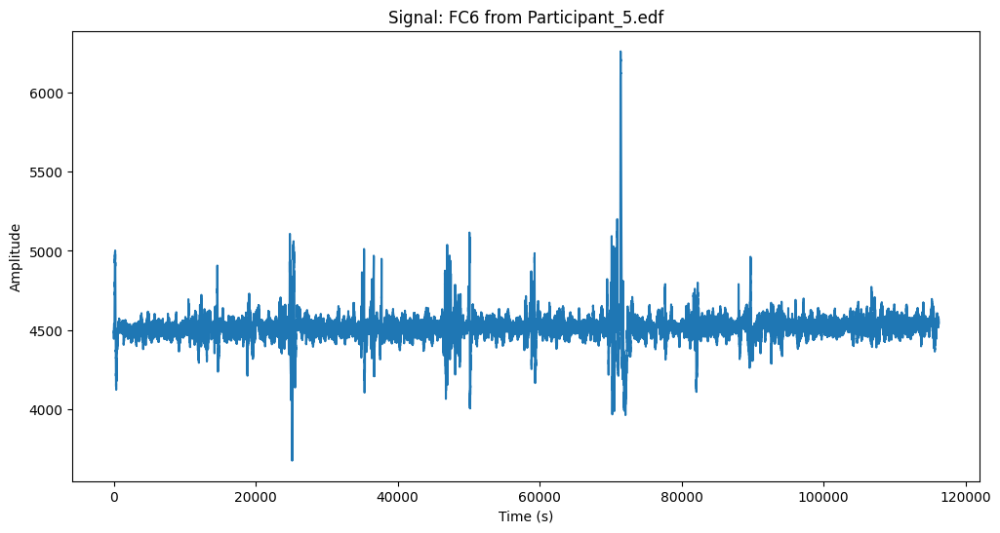

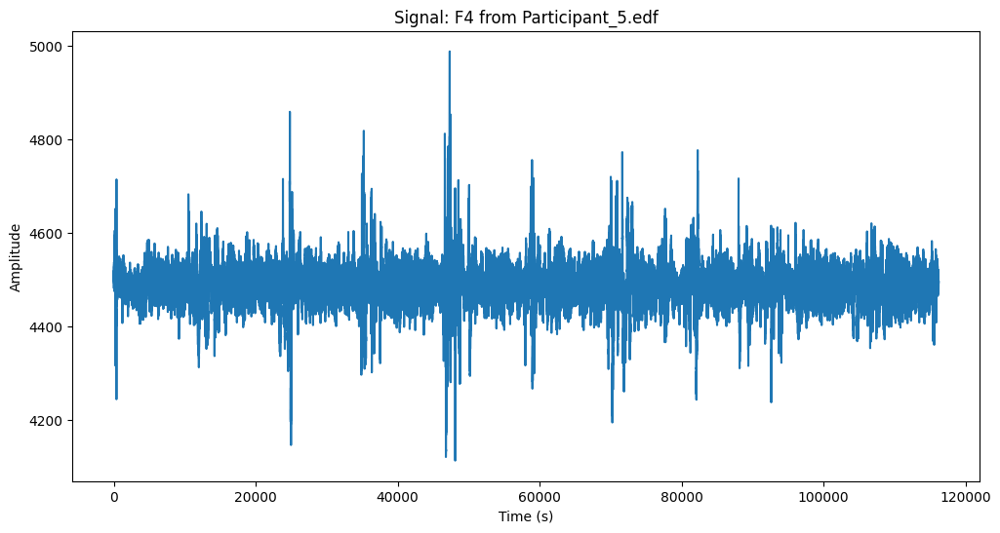

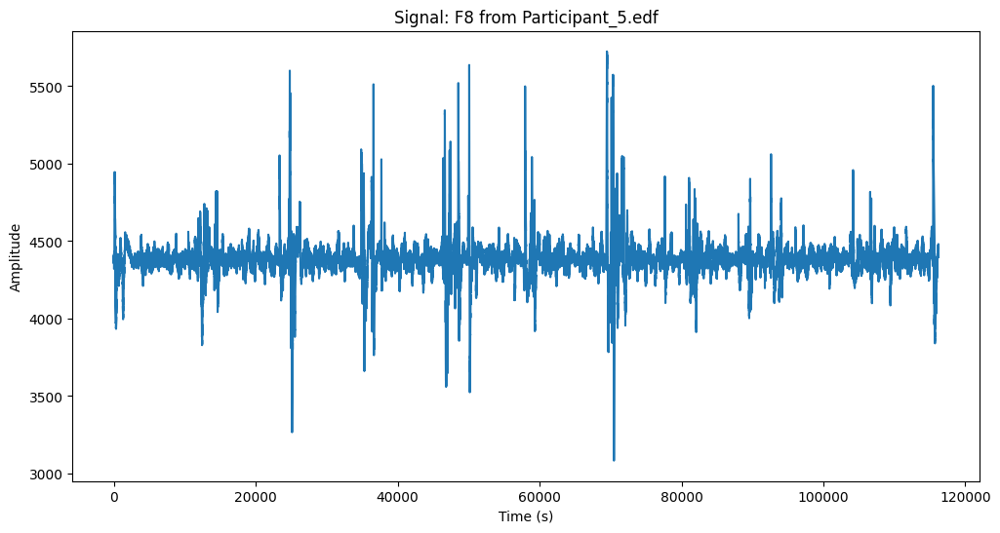

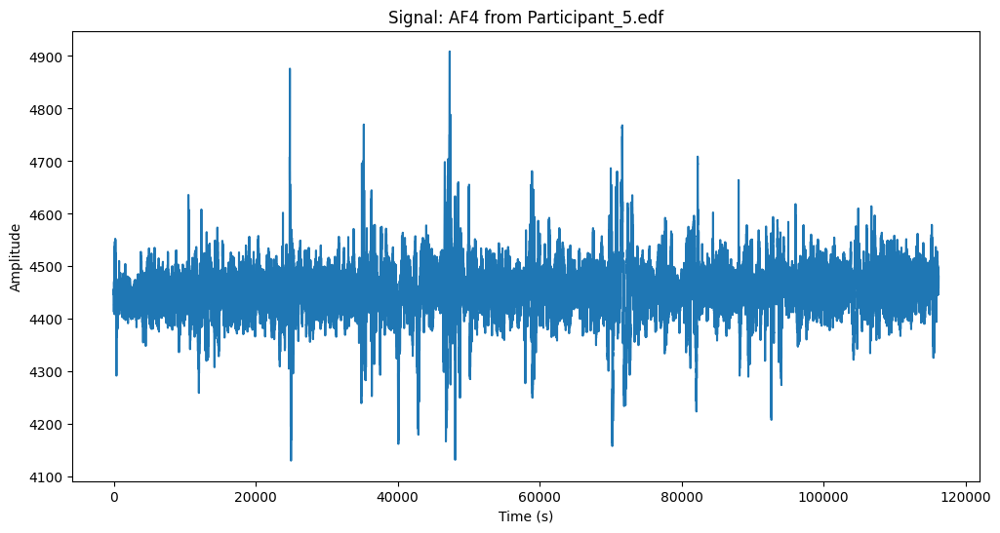

Statistics for Participant_5.edf:
Statistics for AF3:
  Mean: 4288.558817455949
  Median: 4288.20512820513
  Variance: 1498.8150606440088
  Standard Deviation: 38.714532938471685

Statistics for F7:
  Mean: 4274.783450878235
  Median: 4273.846153846155
  Variance: 20170.423000520004
  Standard Deviation: 142.02261439827112

Statistics for F3:
  Mean: 4321.54110012143
  Median: 4320.512820512822
  Variance: 2878.3232725577873
  Standard Deviation: 53.650007199978894

Statistics for FC5:
  Mean: 4309.685871844291
  Median: 4309.23076923077
  Variance: 4738.432744474544
  Standard Deviation: 68.83627491718697

Statistics for T7:
  Mean: 4267.45425720801
  Median: 4265.641025641027
  Variance: 18378.398020204575
  Standard Deviation: 135.5669503242017

Statistics for P7:
  Mean: 4264.295648367786
  Median: 4264.102564102565
  Variance: 4879.207019797088
  Standard Deviation: 69.8513208164104

Statistics for O1:
  Mean: 4263.84663479188
  Median: 4264.102564102565
  Variance: 1000.718596716

In [15]:
analyse_edf(file_participant_5, channels_of_interest)

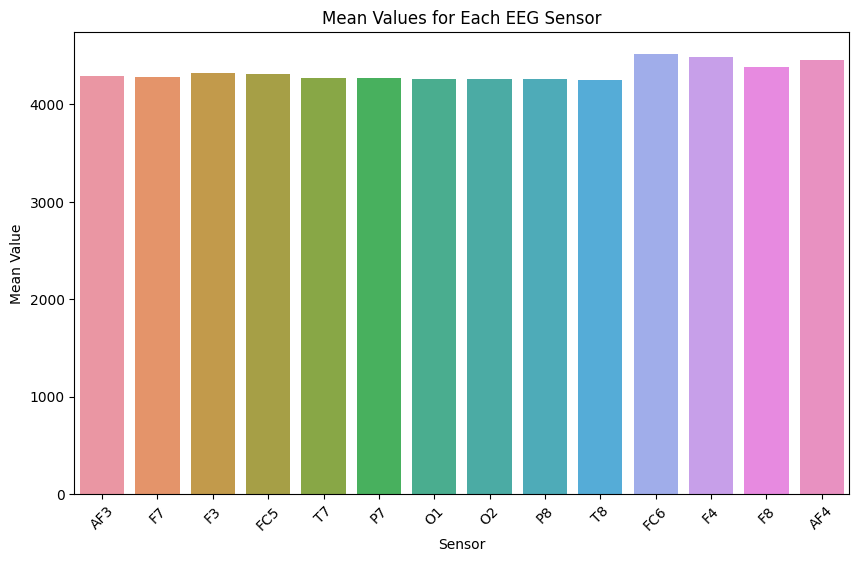

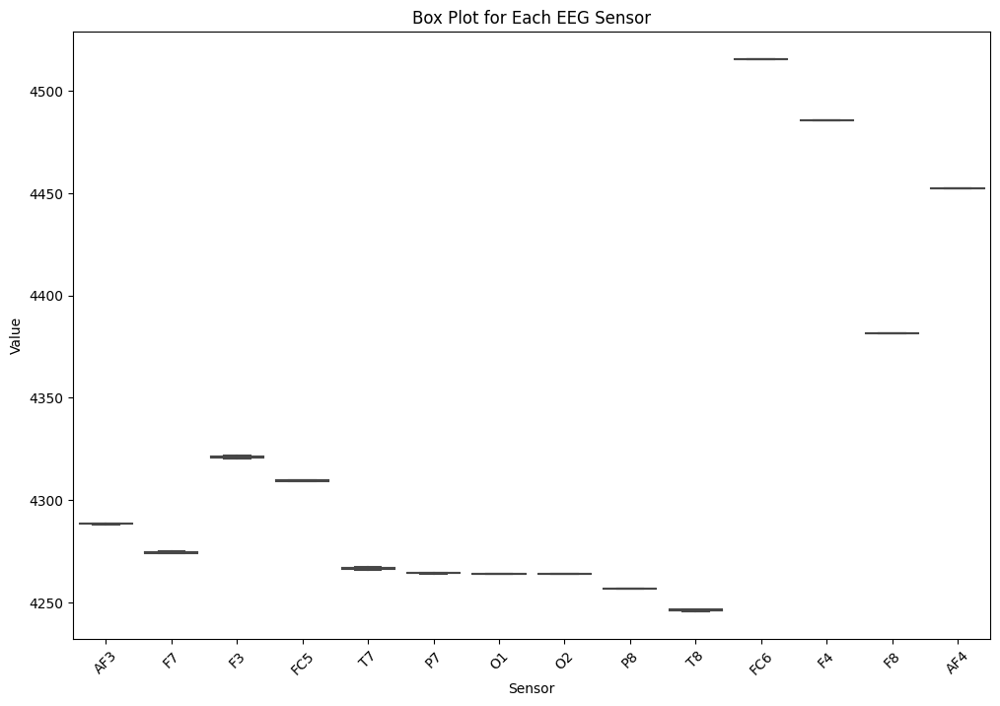

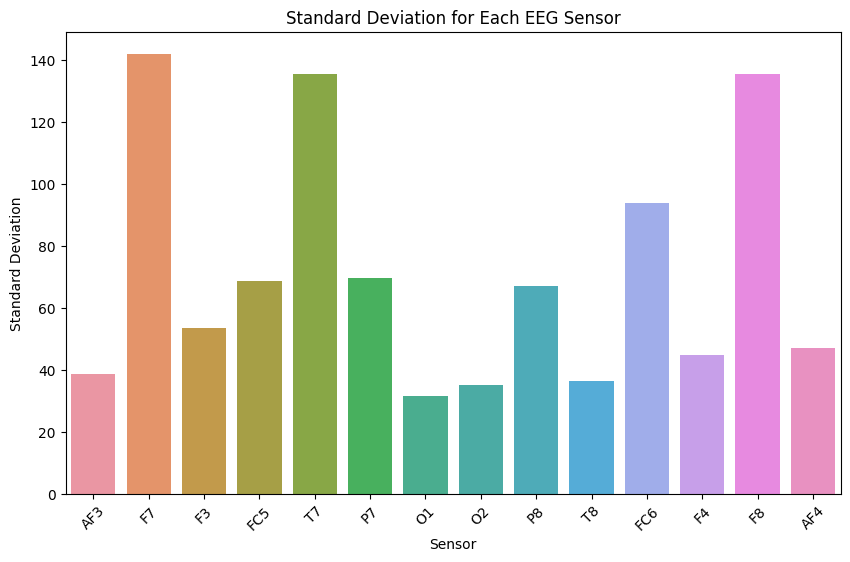

In [16]:
# Further Graphs for Participant 5:

data_participant_5 = {
    "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
    "Mean": [4288.56, 4274.78, 4321.54, 4309.69, 4267.45, 4264.30, 4263.85, 4263.93, 4256.46, 4245.55, 4515.54, 4485.83, 4381.29, 4452.25],
    "Median": [4288.21, 4273.85, 4320.51, 4309.23, 4265.64, 4264.10, 4264.10, 4264.10, 4256.41, 4246.67, 4515.38, 4485.64, 4381.54, 4452.31],
    "Variance": [1498.82, 20170.42, 2878.32, 4738.43, 18378.40, 4879.21, 1000.72, 1238.80, 4507.84, 1334.65, 8835.89, 2018.86, 18411.62, 2222.44],
    "Standard Deviation": [38.71, 142.02, 53.65, 68.84, 135.57, 69.85, 31.63, 35.20, 67.14, 36.53, 94.00, 44.93, 135.69, 47.14]
}

# Create DataFrame
df_participant_5 = pd.DataFrame(data_participant_5)

# Bar Chart of Mean Values:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Mean", data = df_participant_5)
plt.title('Mean Values for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.show()

# Box Plot for Each Sensor:
plt.figure(figsize = (12, 8))
sns.boxplot(data = df_participant_5.drop(columns = ['Variance', 'Standard Deviation']).set_index('Sensor').T)
plt.title('Box Plot for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Value')
plt.xticks(rotation = 45)
plt.show()

# Bar Chart of Standard Deviation:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Standard Deviation", data = df_participant_5)
plt.title('Standard Deviation for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Standard Deviation')
plt.xticks(rotation = 45)
plt.show()

##### Participant 6:

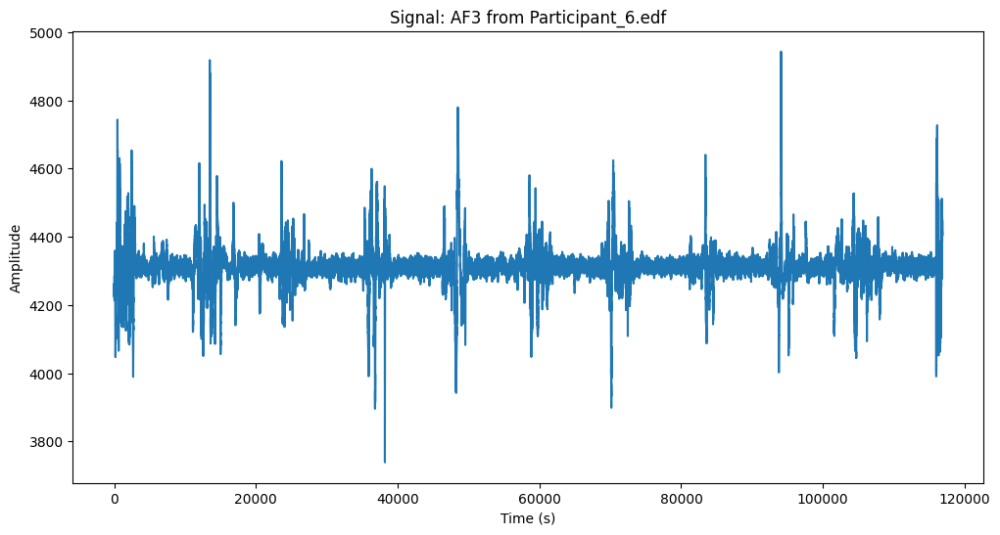

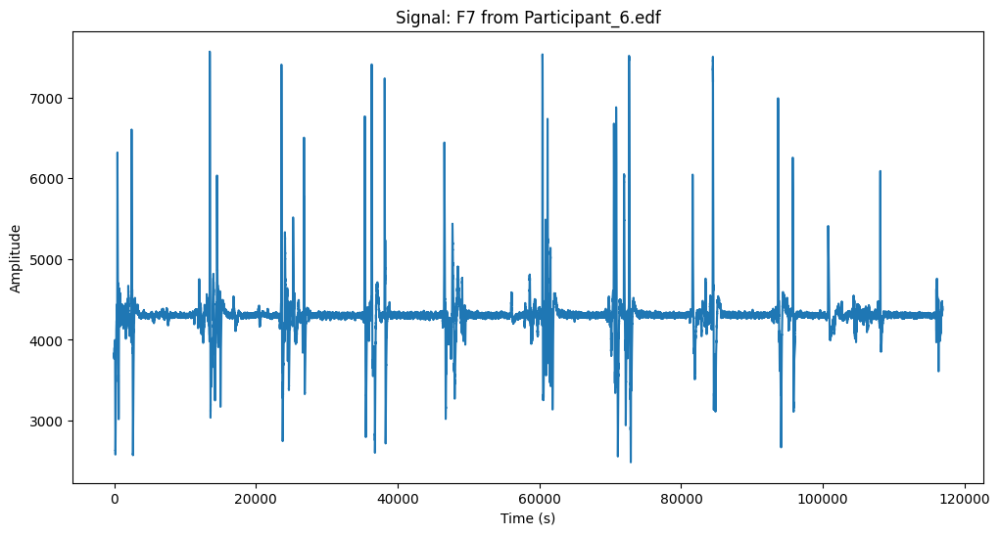

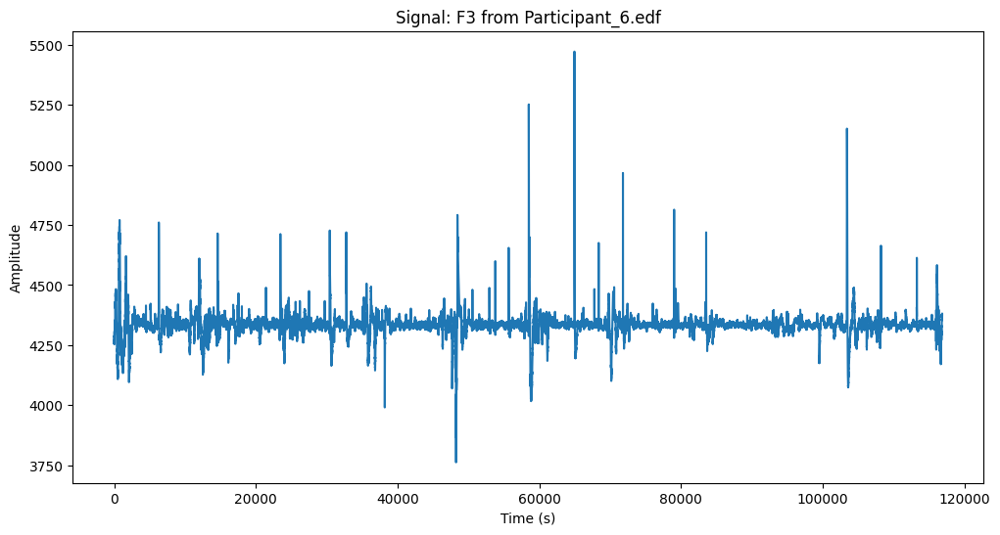

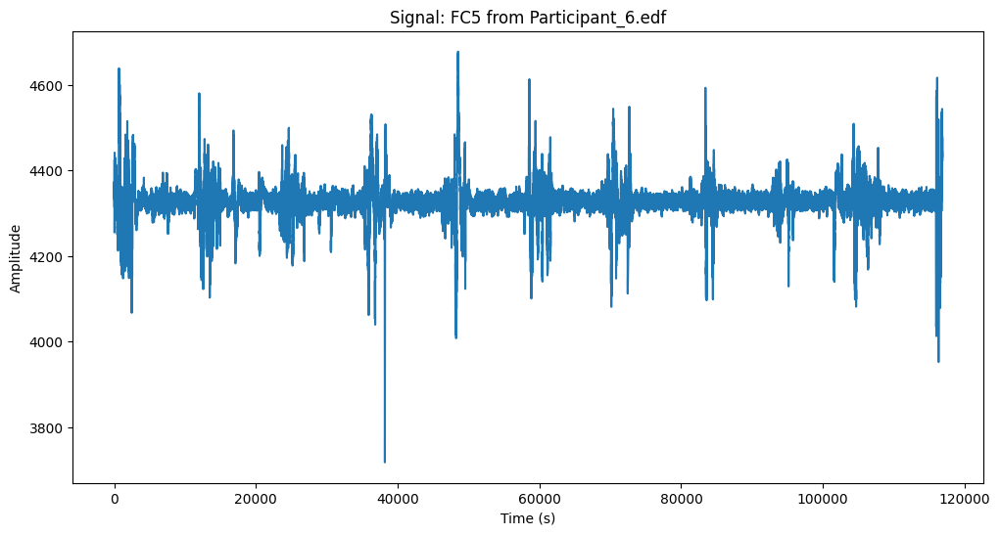

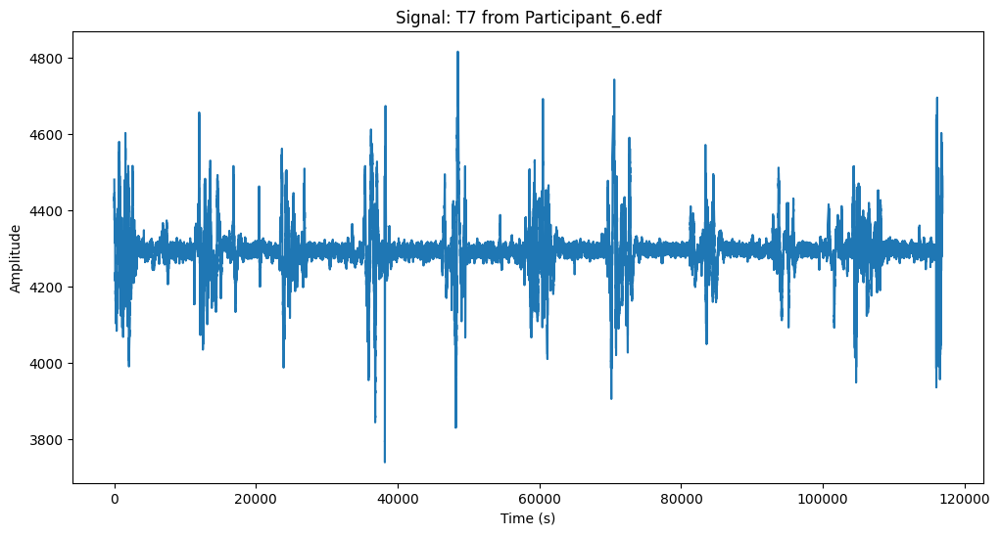

...

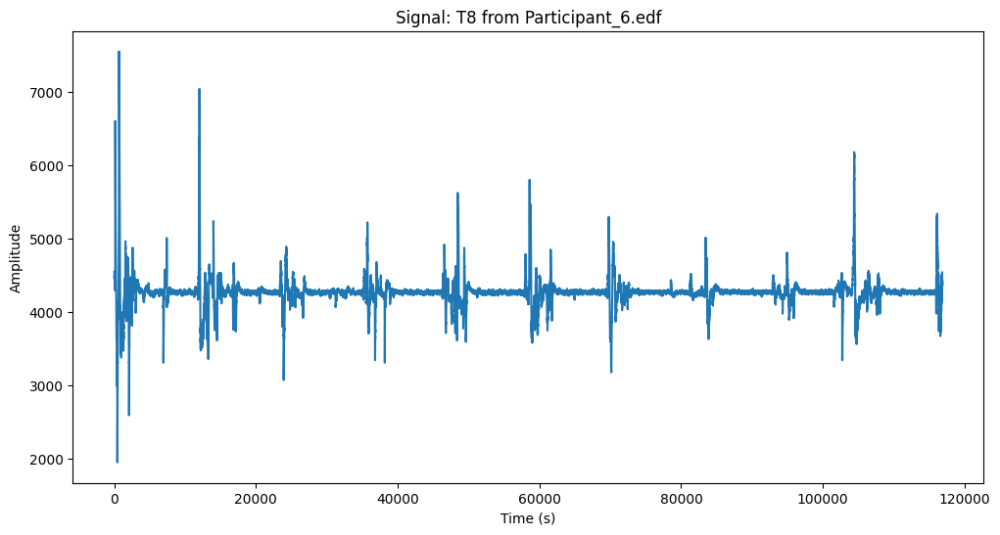

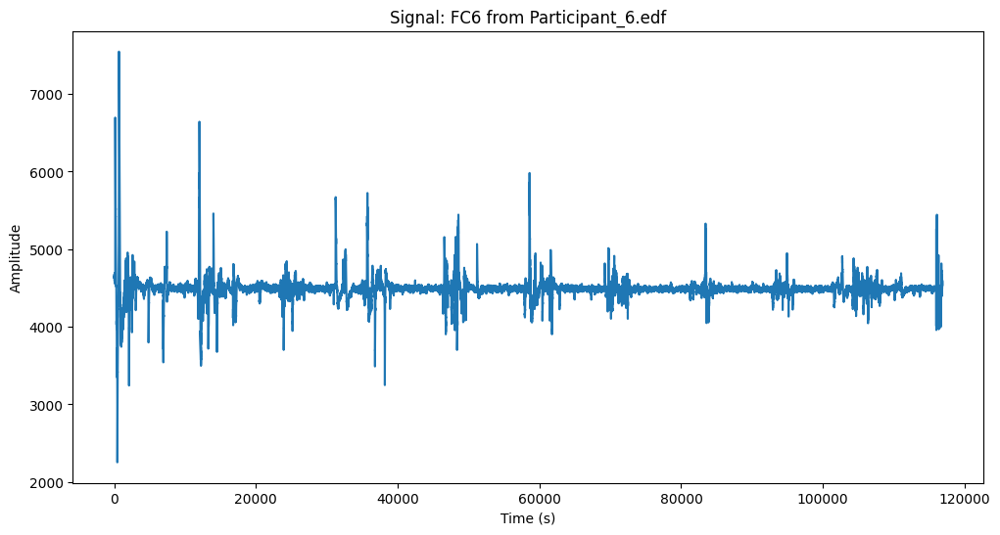

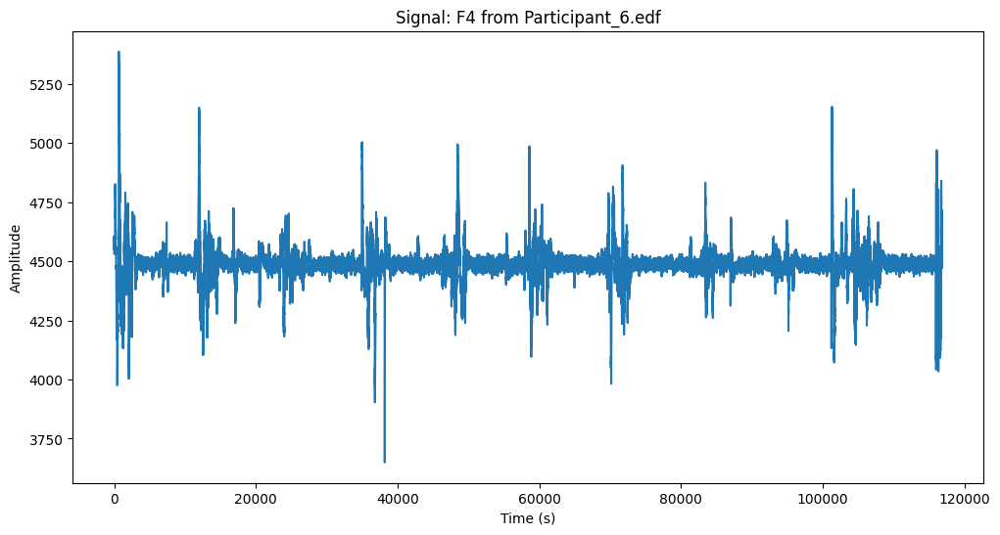

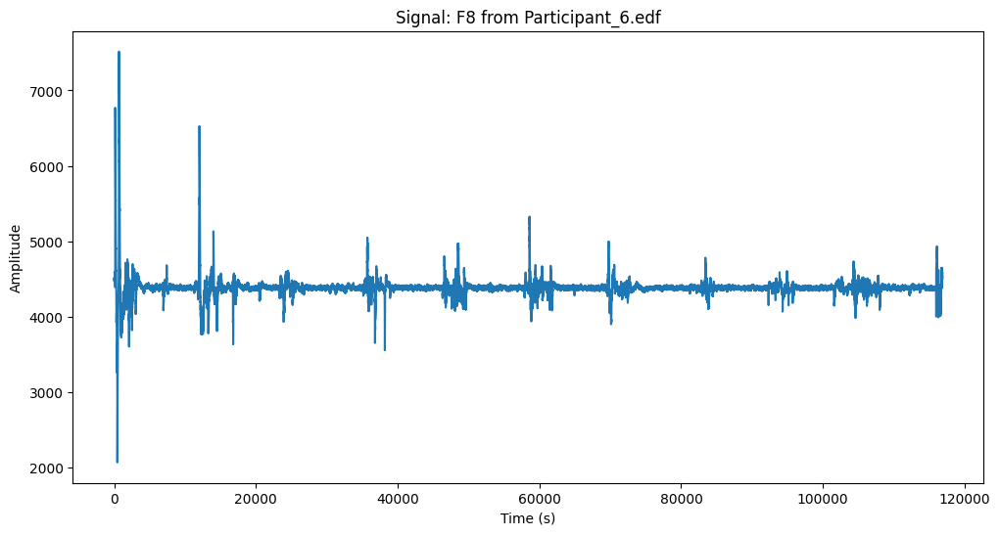

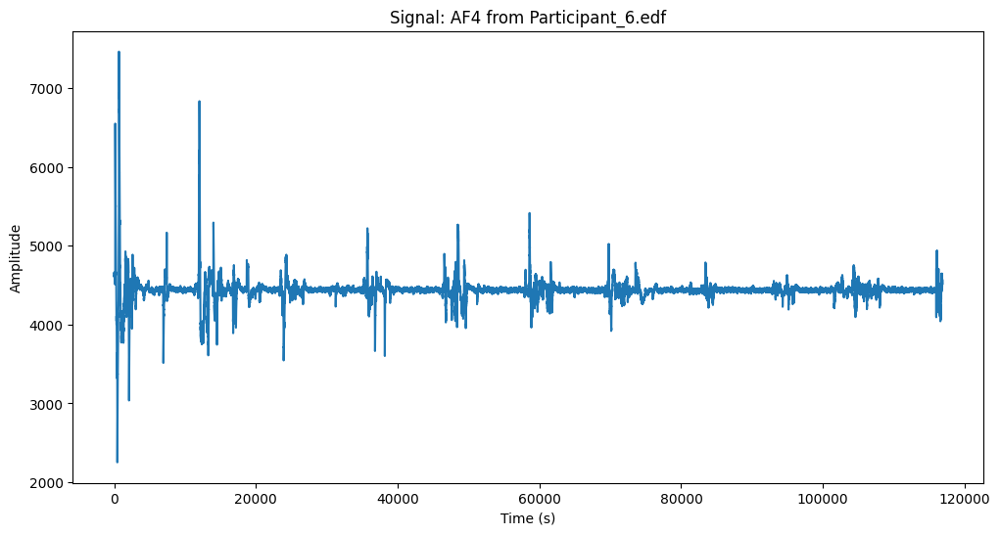

Statistics for Participant_6.edf:
Statistics for AF3:
  Mean: 4311.370925134104
  Median: 4311.794871794873
  Variance: 3316.932705435906
  Standard Deviation: 57.592818175844684

Statistics for F7:
  Mean: 4298.330643377709
  Median: 4300.000000000002
  Variance: 98660.21574032493
  Standard Deviation: 314.1022377193848

Statistics for F3:
  Mean: 4333.163216677902
  Median: 4333.846153846155
  Variance: 2931.082603051745
  Standard Deviation: 54.13947361262155

Statistics for FC5:
  Mean: 4326.736100872021
  Median: 4327.179487179489
  Variance: 1769.0066627861831
  Standard Deviation: 42.05956089625976

Statistics for T7:
  Mean: 4293.0451877439855
  Median: 4293.846153846155
  Variance: 3814.185657043722
  Standard Deviation: 61.75909371941692

Statistics for P7:
  Mean: 4285.683604171934
  Median: 4285.641025641027
  Variance: 4257.366406134677
  Standard Deviation: 65.24849734771428

Statistics for O1:
  Mean: 4282.147313028338
  Median: 4281.538461538463
  Variance: 2605.1831316

In [17]:
analyse_edf(file_participant_6, channels_of_interest)

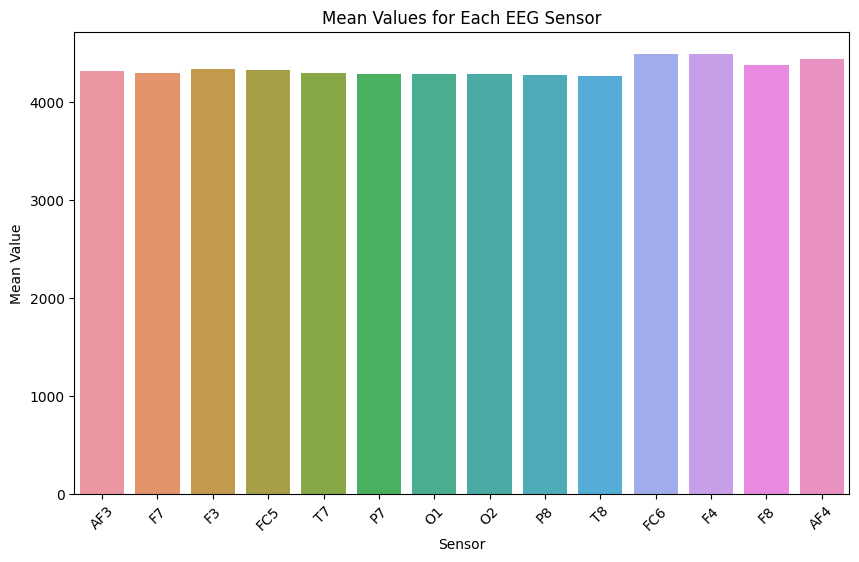

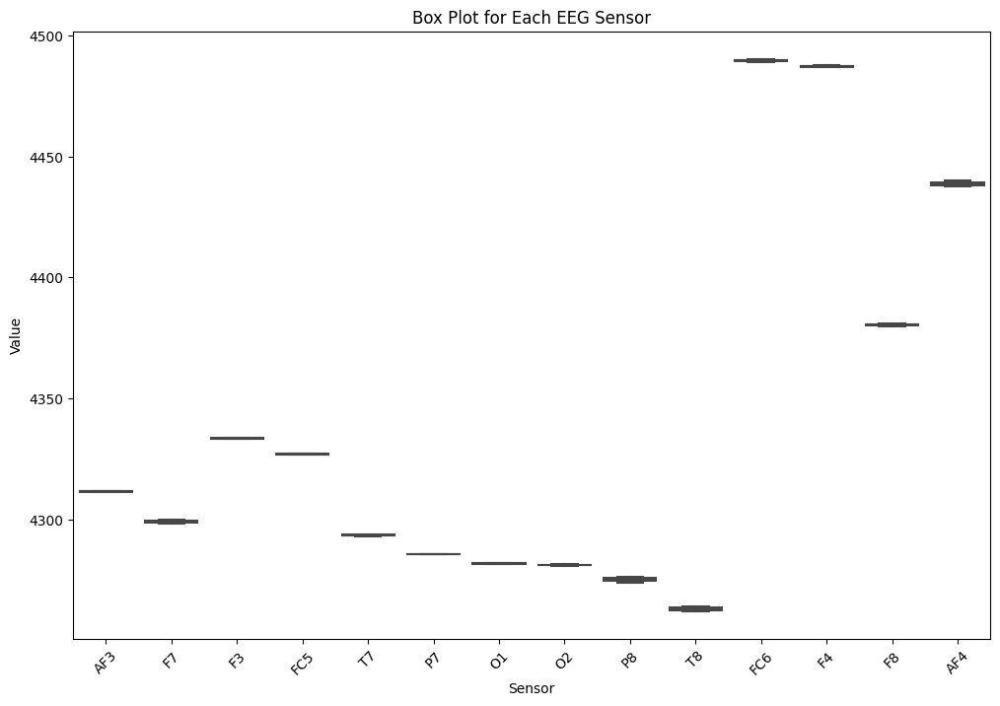

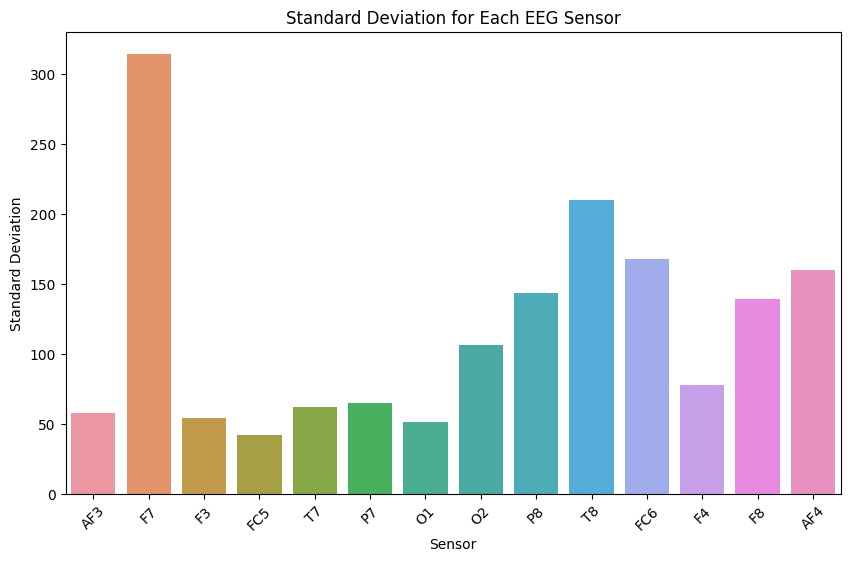

In [18]:
# Further Graphs for Participant 6:

data_participant_6 = {
    "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
    "Mean": [4311.37, 4298.33, 4333.16, 4326.74, 4293.05, 4285.68, 4282.15, 4280.76, 4273.76, 4261.99, 4489.15, 4486.96, 4379.88, 4437.57],
    "Median": [4311.79, 4300.00, 4333.85, 4327.18, 4293.85, 4285.64, 4281.54, 4281.54, 4276.41, 4264.10, 4490.26, 4487.69, 4381.03, 4440.00],
    "Variance": [3316.93, 98660.22, 2931.08, 1769.01, 3814.19, 4257.37, 2605.18, 11380.88, 20647.23, 44086.34, 28212.29, 6105.64, 19397.67, 25567.70],
    "Standard Deviation": [57.59, 314.10, 54.14, 42.06, 61.76, 65.25, 51.04, 106.68, 143.69, 209.97, 167.97, 78.14, 139.28, 159.90]
}

# Create DataFrame
df_participant_6 = pd.DataFrame(data_participant_6)

# Bar Chart of Mean Values:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Mean", data = df_participant_6)
plt.title('Mean Values for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.show()

# Box Plot for Each Sensor:
plt.figure(figsize = (12, 8))
sns.boxplot(data = df_participant_6.drop(columns = ['Variance', 'Standard Deviation']).set_index('Sensor').T)
plt.title('Box Plot for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Value')
plt.xticks(rotation = 45)
plt.show()

# Bar Chart of Standard Deviation:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Standard Deviation", data = df_participant_6)
plt.title('Standard Deviation for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Standard Deviation')
plt.xticks(rotation = 45)
plt.show()

##### Participant 7:

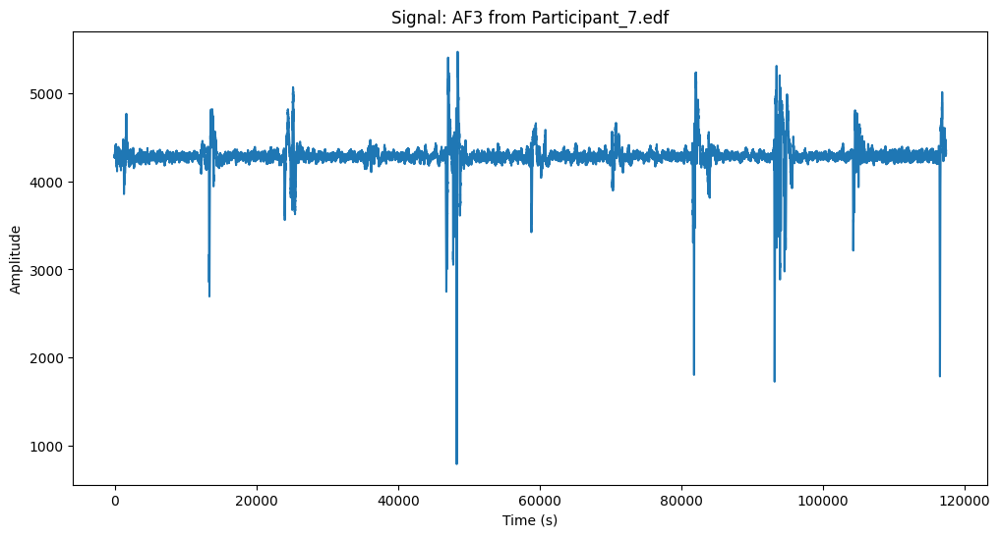

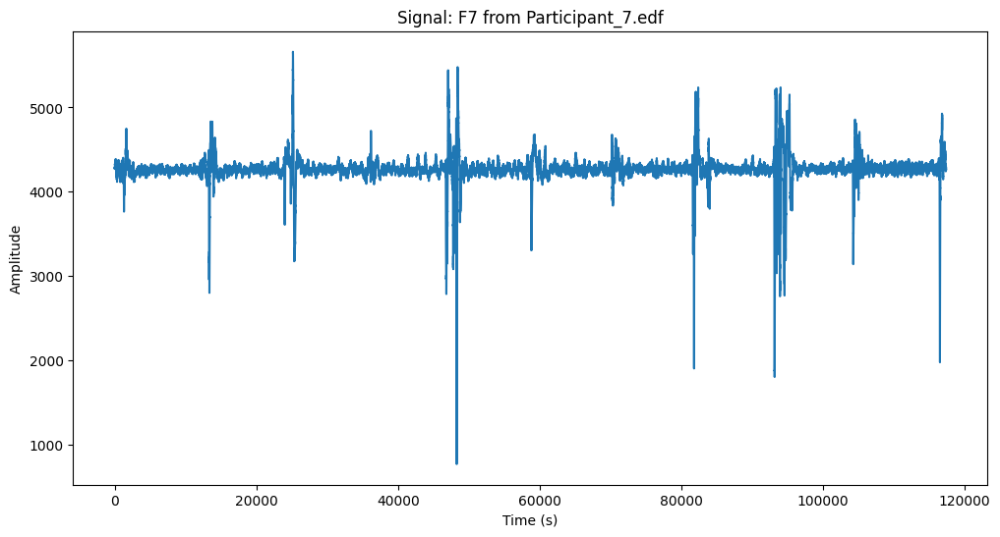

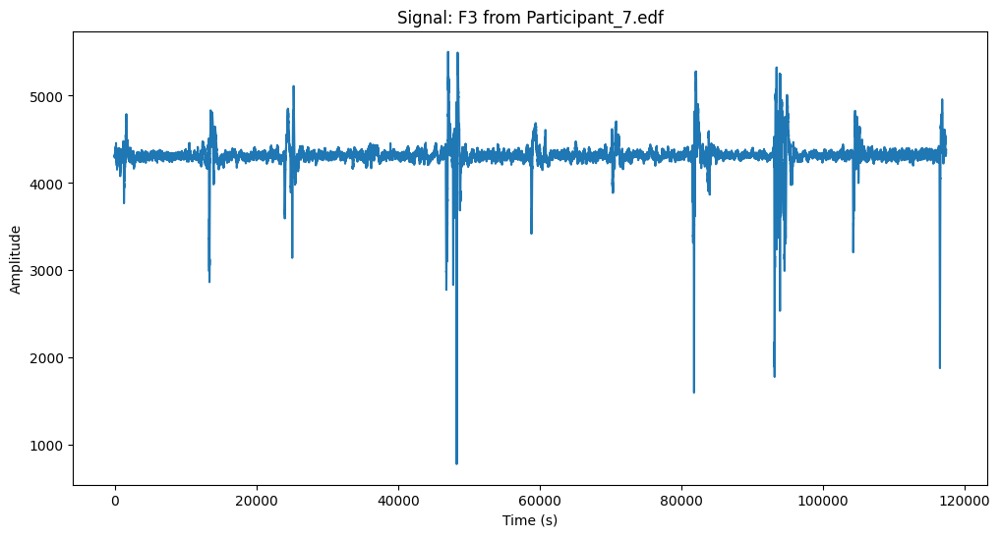

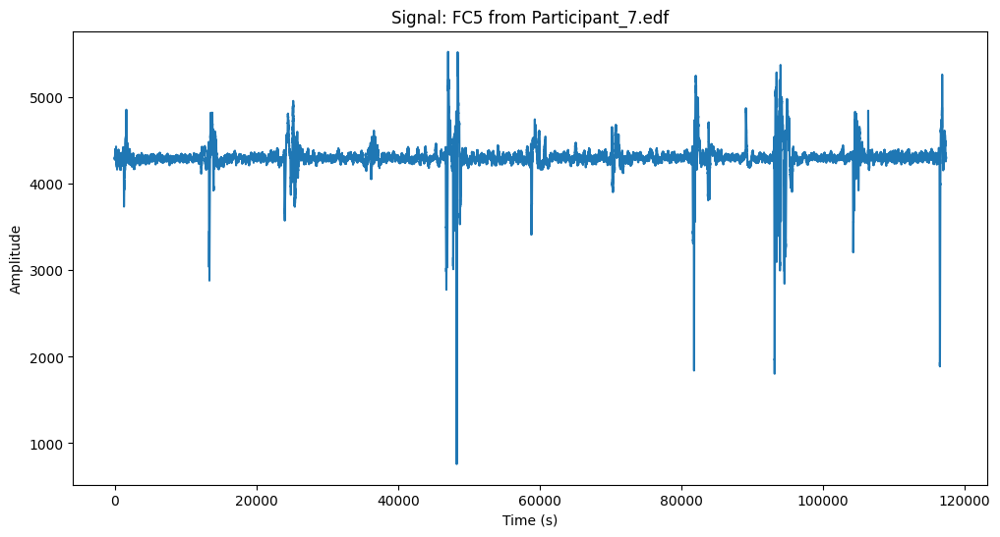

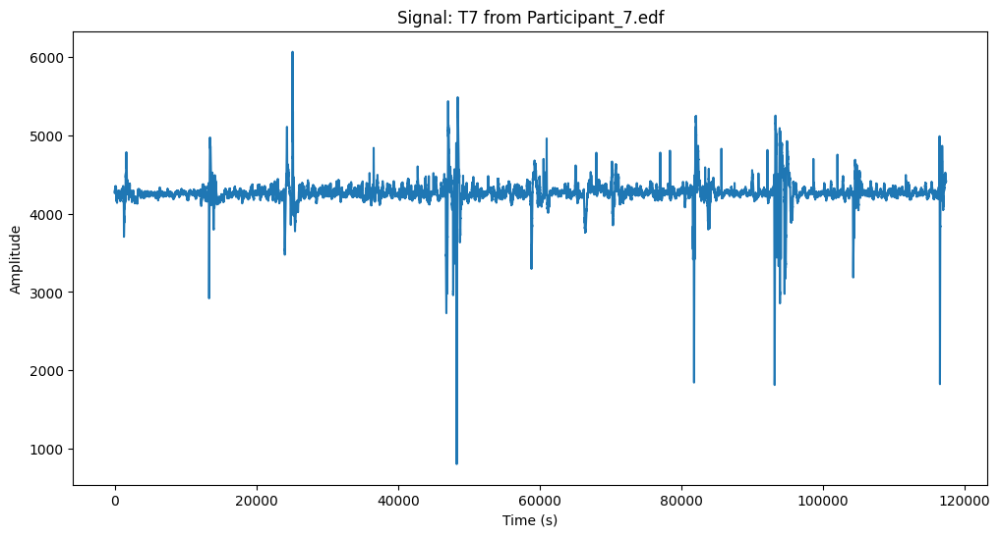

...

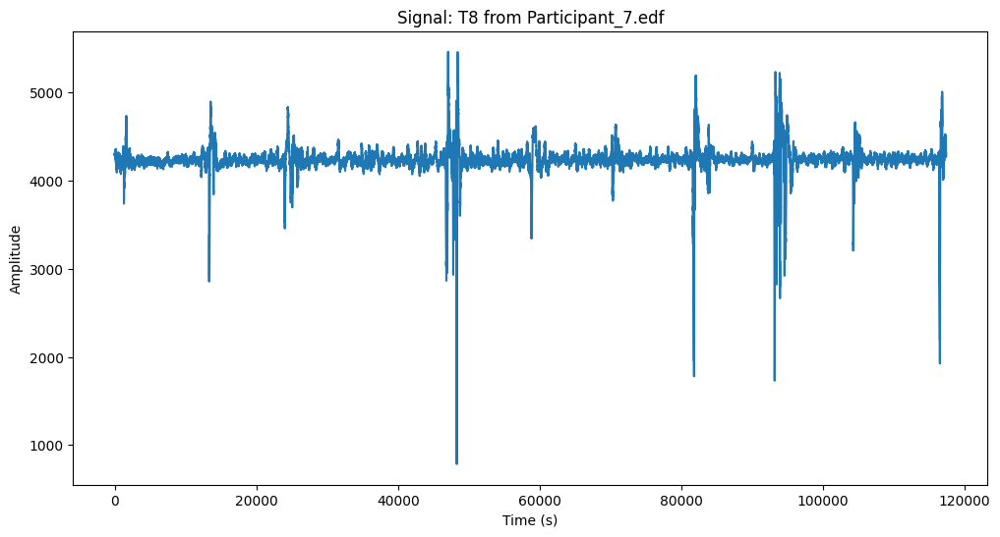

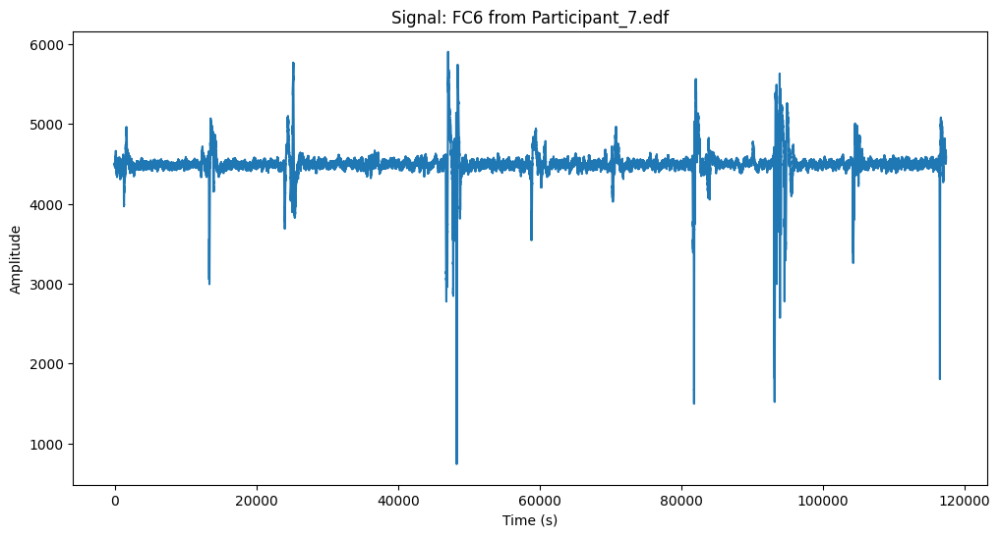

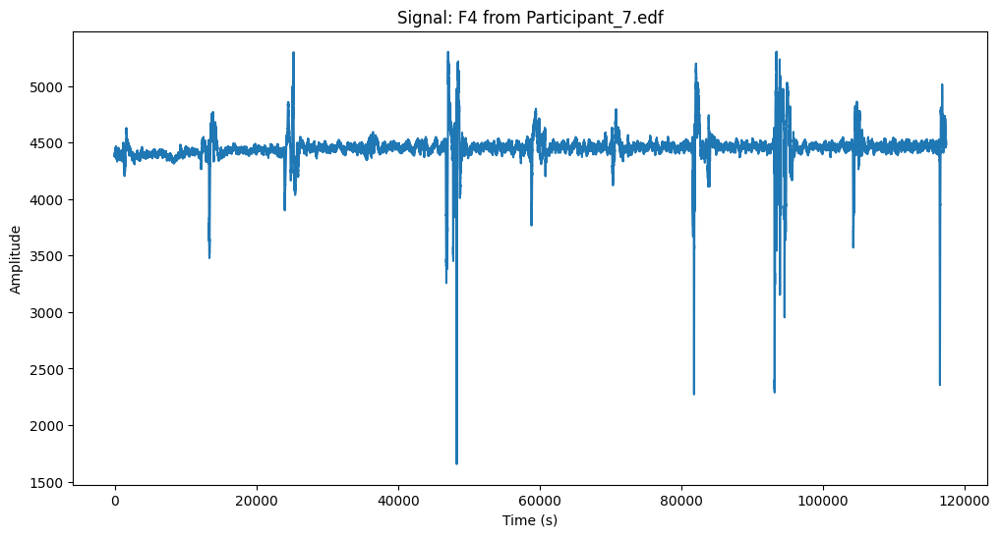

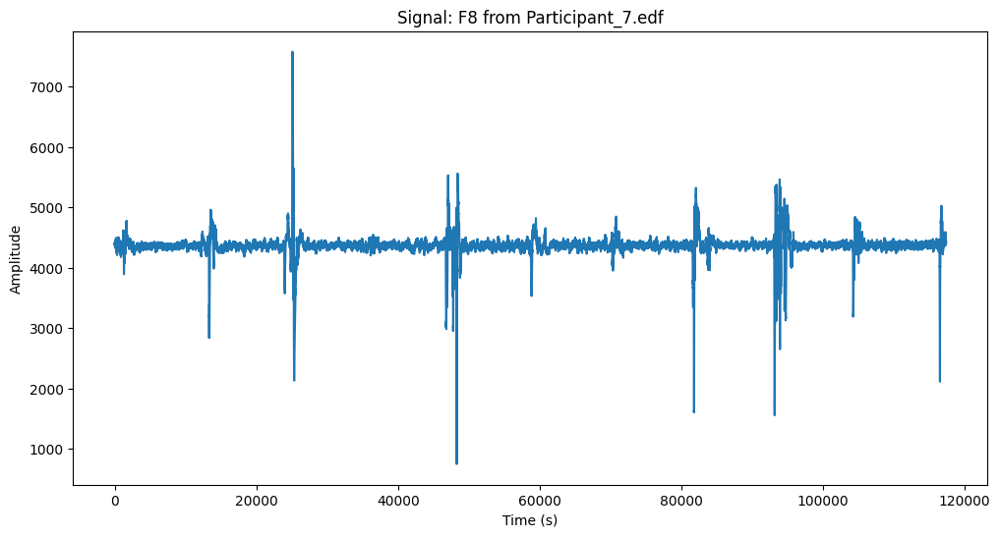

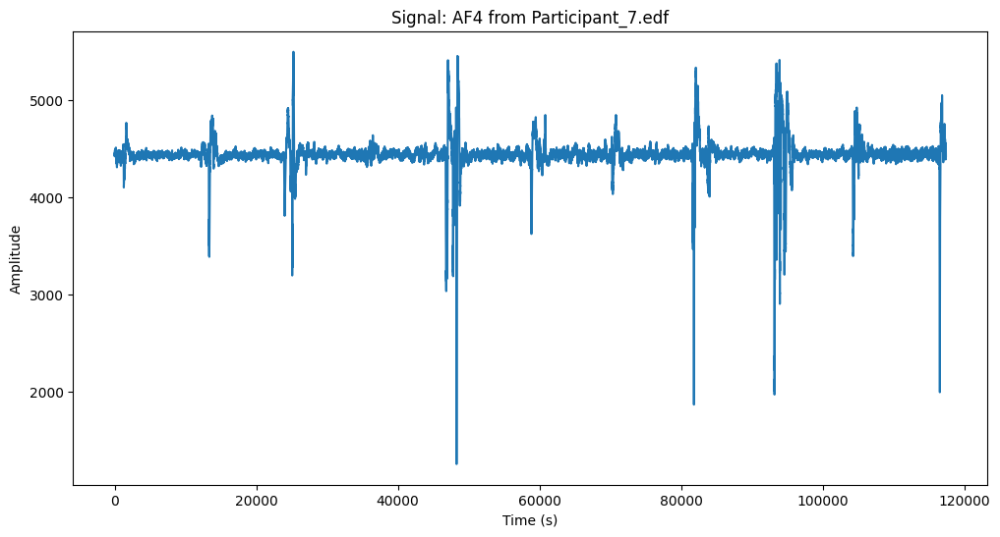

Statistics for Participant_7.edf:
Statistics for AF3:
  Mean: 4288.0195444663495
  Median: 4287.179487179489
  Variance: 28913.42969391594
  Standard Deviation: 170.03949451205722

Statistics for F7:
  Mean: 4274.079897519784
  Median: 4273.333333333335
  Variance: 31034.377083004525
  Standard Deviation: 176.16576592233955

Statistics for F3:
  Mean: 4320.004251076533
  Median: 4319.487179487181
  Variance: 28971.000429945452
  Standard Deviation: 170.20869669304636

Statistics for FC5:
  Mean: 4308.41316007466
  Median: 4306.666666666668
  Variance: 29426.49554142078
  Standard Deviation: 171.541527163019

Statistics for T7:
  Mean: 4267.196696830524
  Median: 4263.076923076925
  Variance: 30418.90702737961
  Standard Deviation: 174.4101689334071

Statistics for P7:
  Mean: 4261.834765504854
  Median: 4262.051282051283
  Variance: 26172.22875937022
  Standard Deviation: 161.77833216895957

Statistics for O1:
  Mean: 4261.786609939044
  Median: 4262.051282051283
  Variance: 20266.0156

In [19]:
analyse_edf(file_participant_7, channels_of_interest)

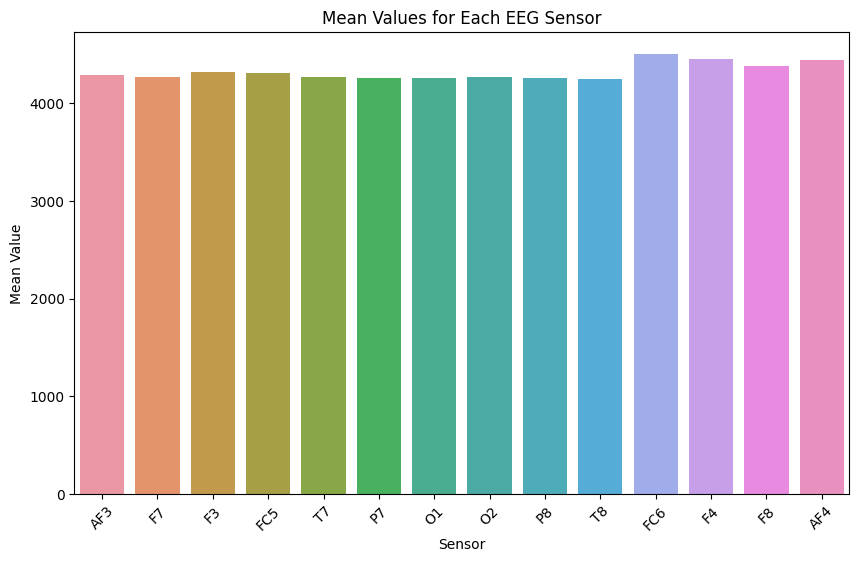

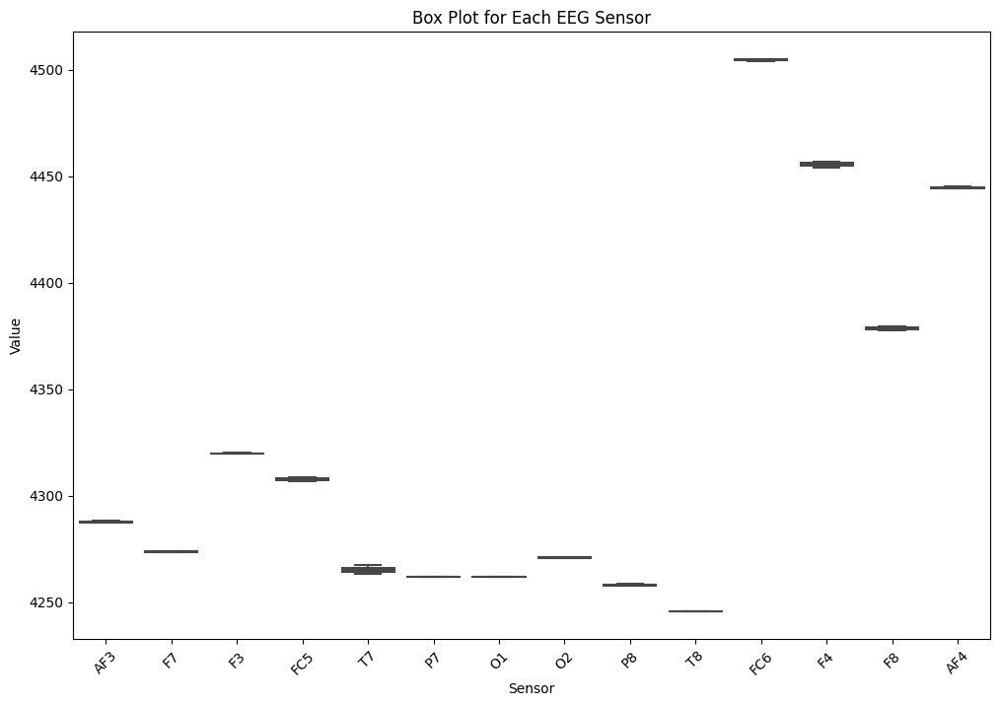

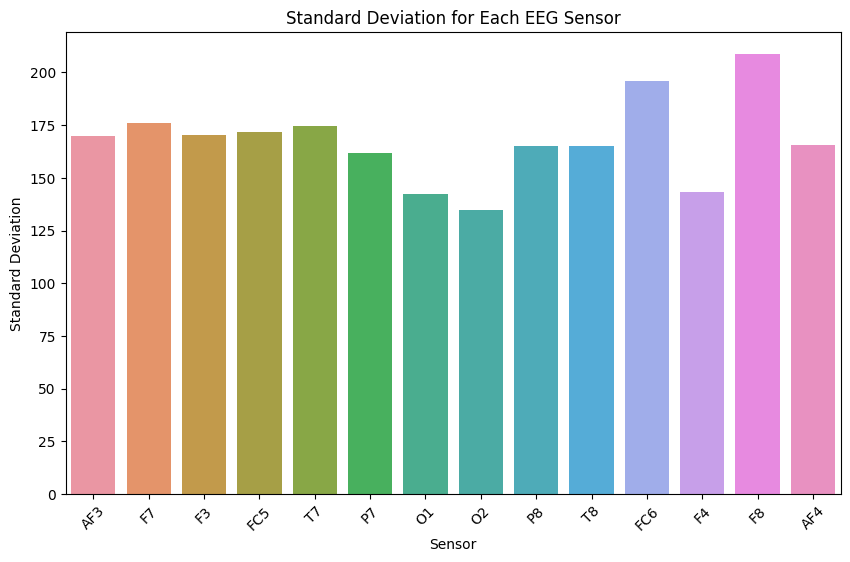

In [20]:
# Further Graphs for Participant 7:

data_participant_7 = {
    "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
    "Mean": [4288.02, 4274.08, 4320.00, 4308.41, 4267.20, 4261.83, 4261.79, 4271.10, 4257.52, 4245.75, 4504.89, 4454.08, 4377.61, 4445.09],
    "Median": [4287.18, 4273.33, 4319.49, 4306.67, 4263.08, 4262.05, 4262.05, 4270.77, 4258.46, 4245.64, 4504.10, 4456.92, 4379.49, 4444.10],
    "Variance": [28913.43, 31034.38, 28971.00, 29426.50, 30418.91, 26172.23, 20266.02, 18178.73, 27281.38, 27257.89, 38307.68, 20494.68, 43582.22, 27412.05],
    "Standard Deviation": [170.04, 176.17, 170.21, 171.54, 174.41, 161.78, 142.36, 134.83, 165.17, 165.10, 195.72, 143.16, 208.76, 165.57]
}

# Create DataFrame
df_participant_7 = pd.DataFrame(data_participant_7)

# Bar Chart of Mean Values:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Mean", data = df_participant_7)
plt.title('Mean Values for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.show()

# Box Plot for Each Sensor:
plt.figure(figsize = (12, 8))
sns.boxplot(data = df_participant_7.drop(columns = ['Variance', 'Standard Deviation']).set_index('Sensor').T)
plt.title('Box Plot for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Value')
plt.xticks(rotation = 45)
plt.show()

# Bar Chart of Standard Deviation:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Standard Deviation", data = df_participant_7)
plt.title('Standard Deviation for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Standard Deviation')
plt.xticks(rotation = 45)
plt.show()

##### Participant 8:

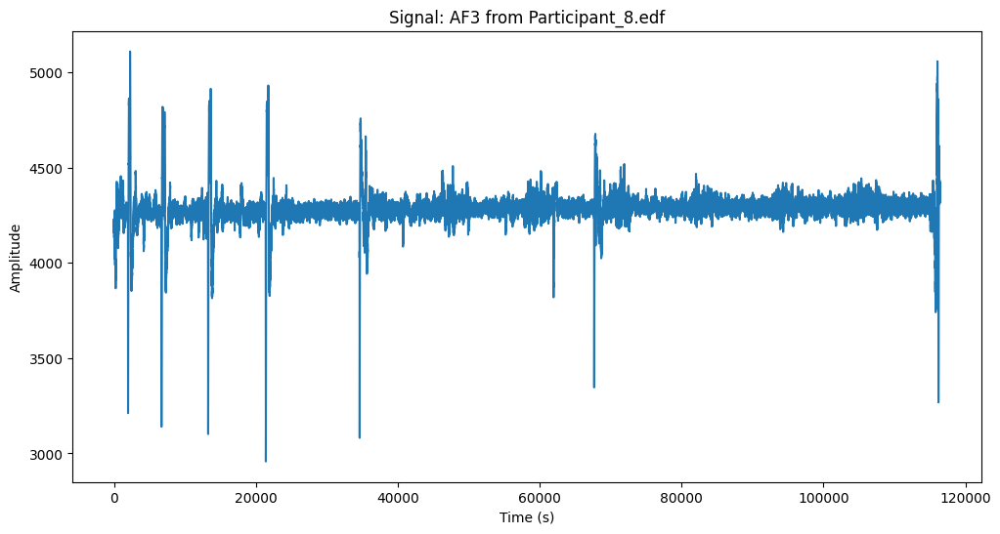

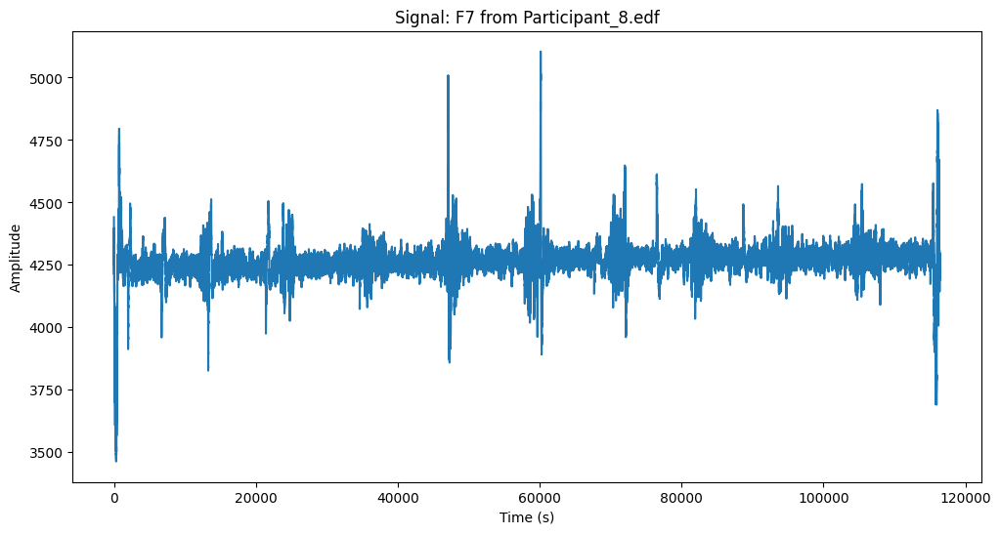

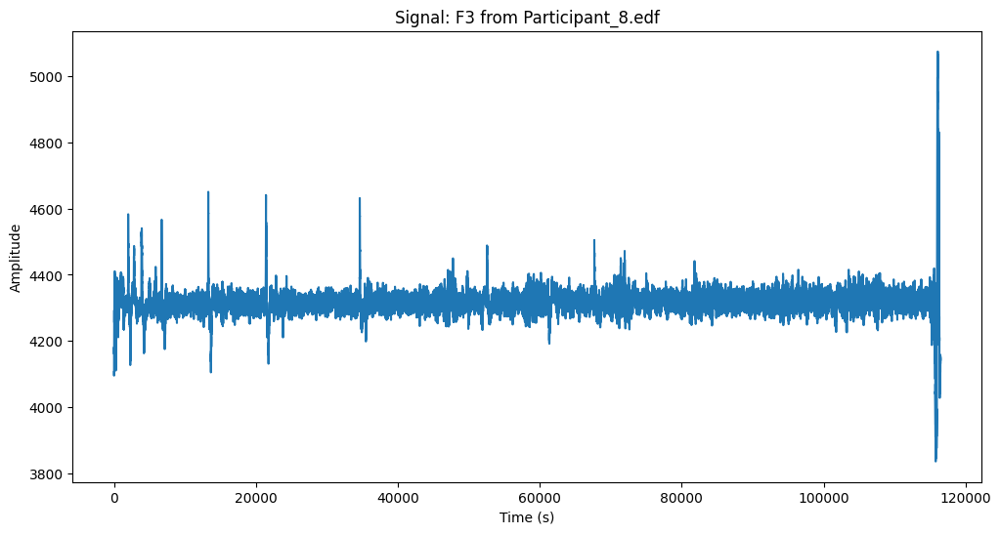

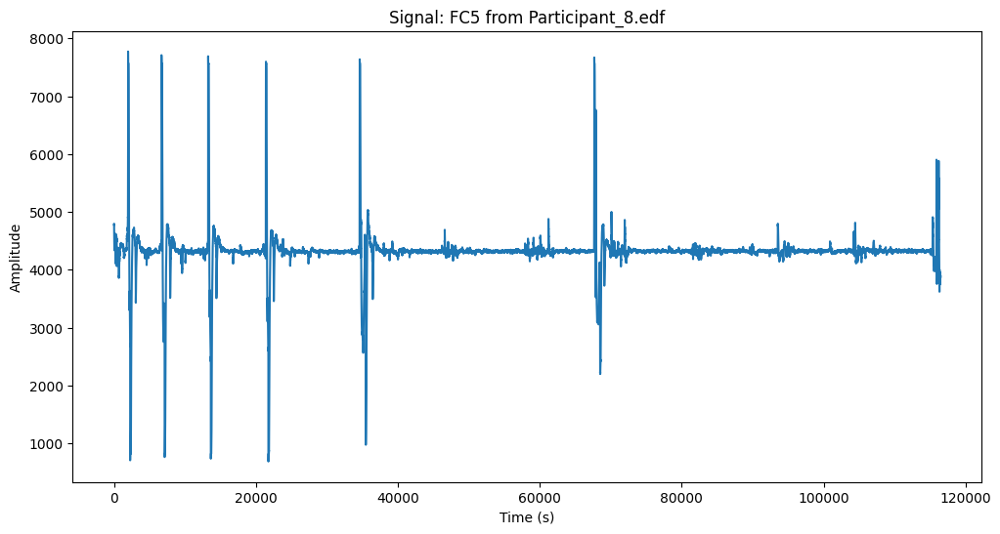

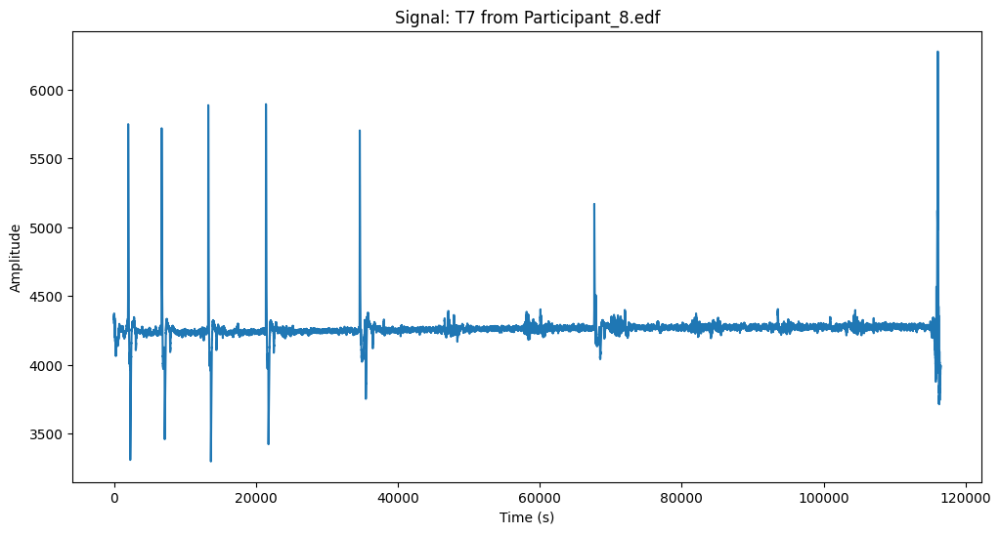

...

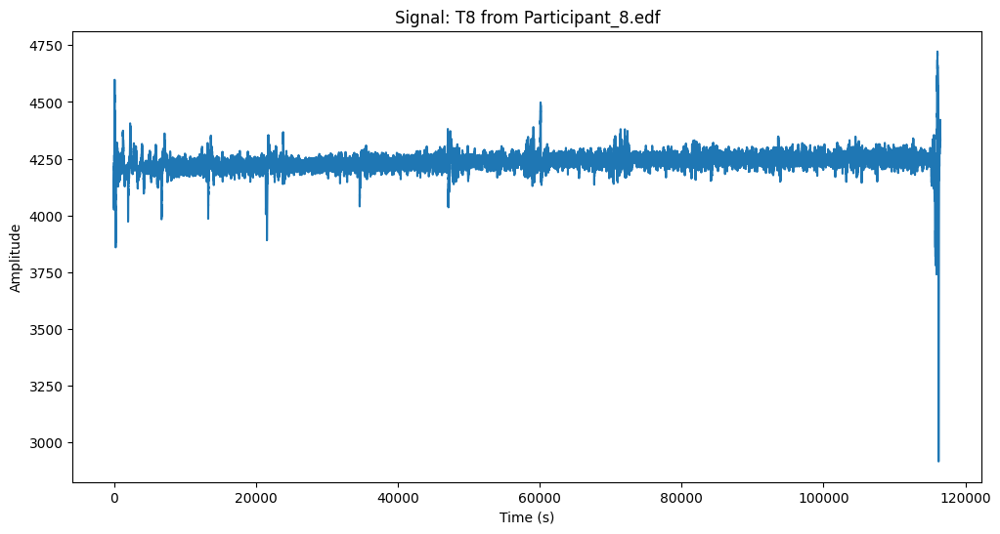

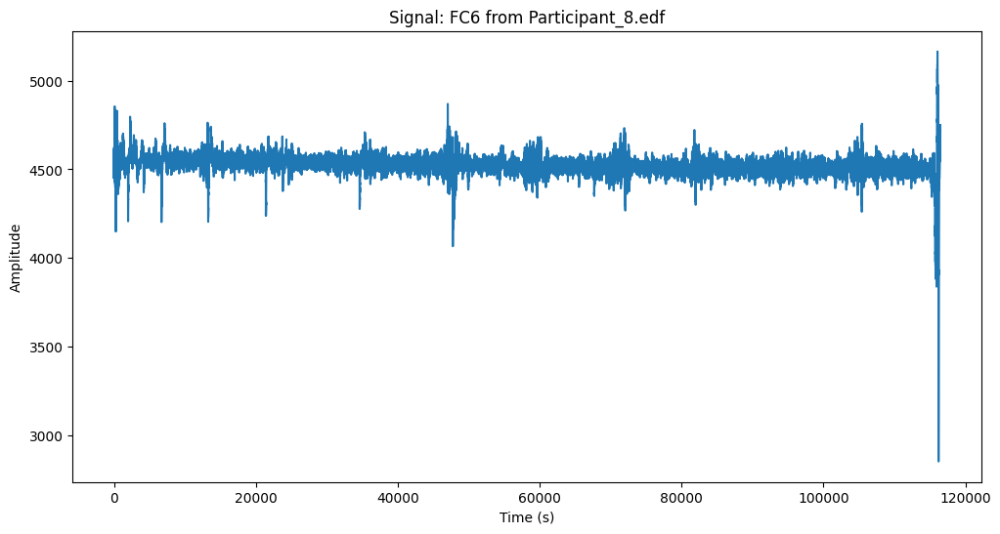

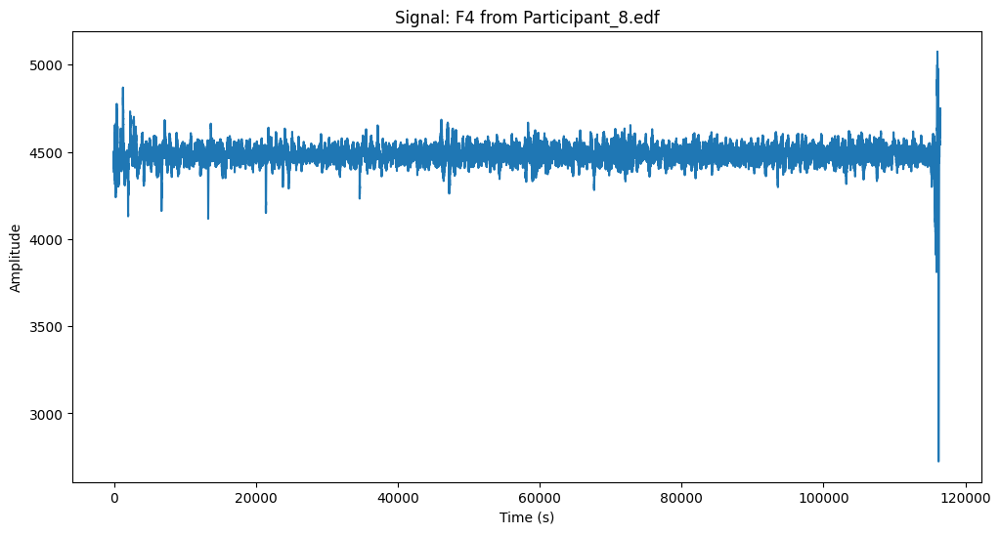

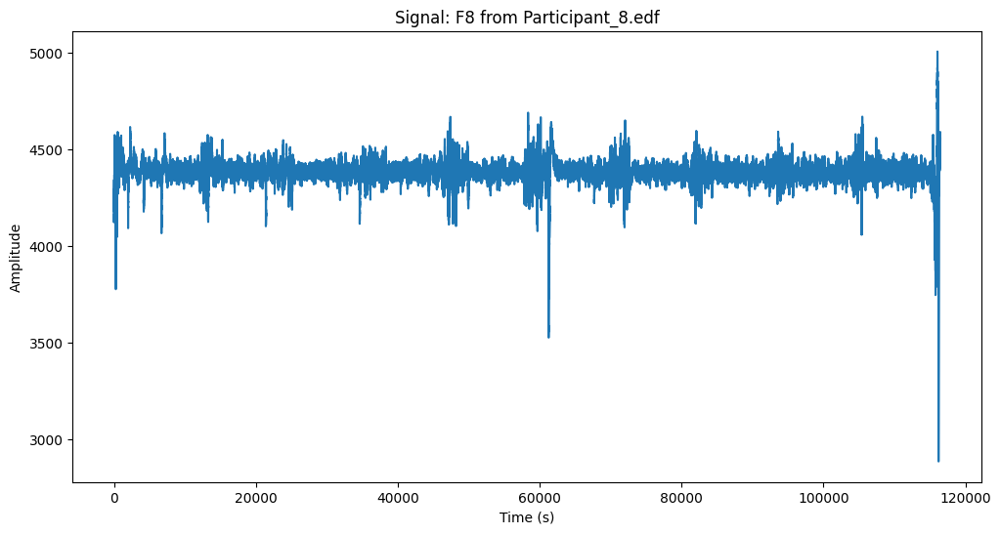

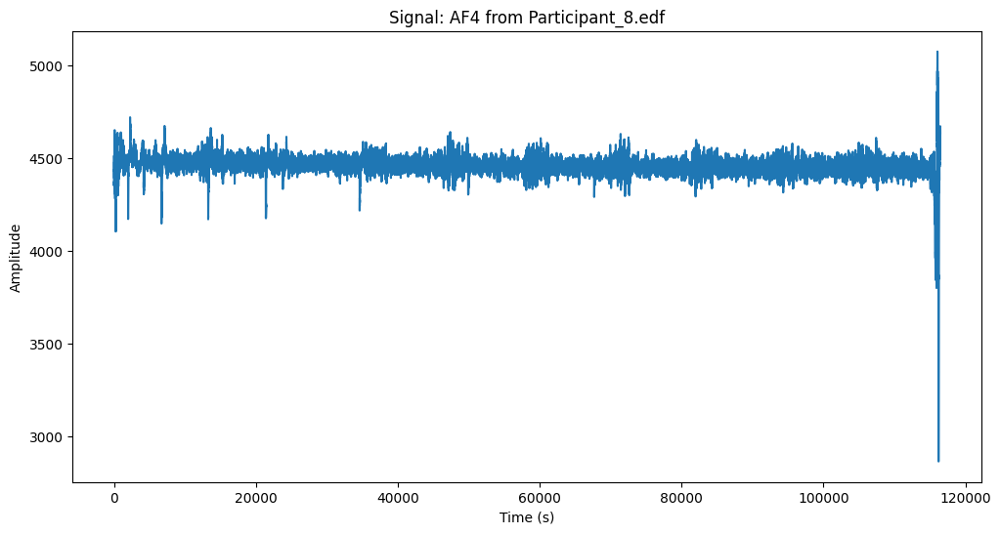

Statistics for Participant_8.edf:
Statistics for AF3:
  Mean: 4283.377399443506
  Median: 4284.102564102565
  Variance: 7615.095526045371
  Standard Deviation: 87.26451470125397

Statistics for F7:
  Mean: 4265.8025852352785
  Median: 4266.666666666668
  Variance: 5151.119232863992
  Standard Deviation: 71.77129811327082

Statistics for F3:
  Mean: 4318.165979853482
  Median: 4317.94871794872
  Variance: 1687.4679739847975
  Standard Deviation: 41.078802002794546

Statistics for FC5:
  Mean: 4311.552122957172
  Median: 4321.0256410256425
  Variance: 153721.33251542682
  Standard Deviation: 392.0731213886344

Statistics for T7:
  Mean: 4258.396370456468
  Median: 4262.051282051283
  Variance: 9082.658876907406
  Standard Deviation: 95.30298461699616

Statistics for P7:
  Mean: 4252.497354008172
  Median: 4256.923076923078
  Variance: 1947.401043470691
  Standard Deviation: 44.12936713199829

Statistics for O1:
  Mean: 4248.710649126516
  Median: 4250.769230769232
  Variance: 2671.106623

In [21]:
analyse_edf(file_participant_8, channels_of_interest)

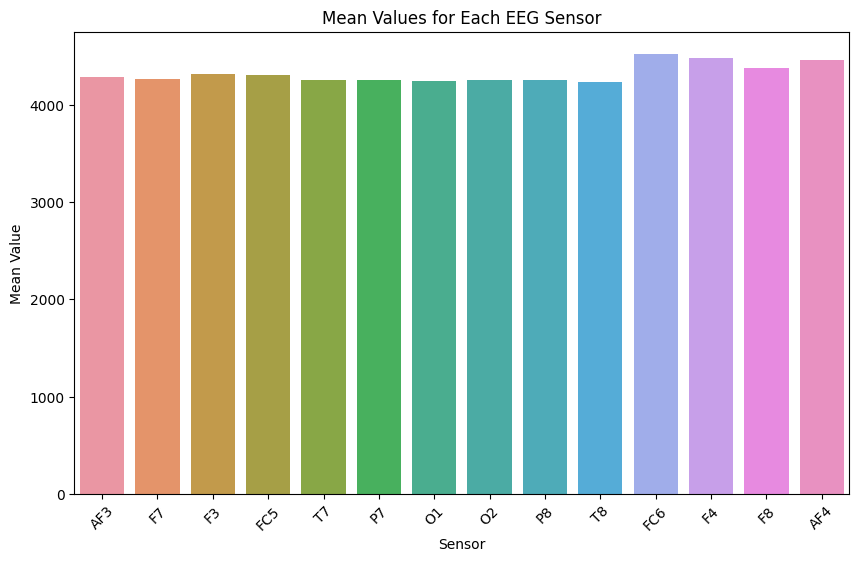

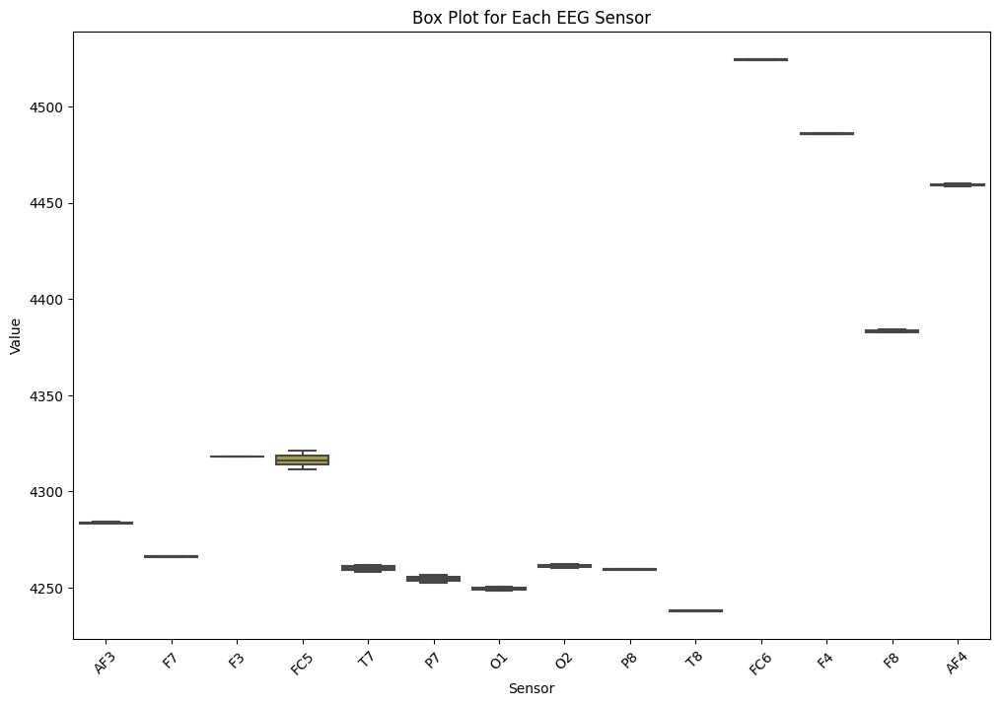

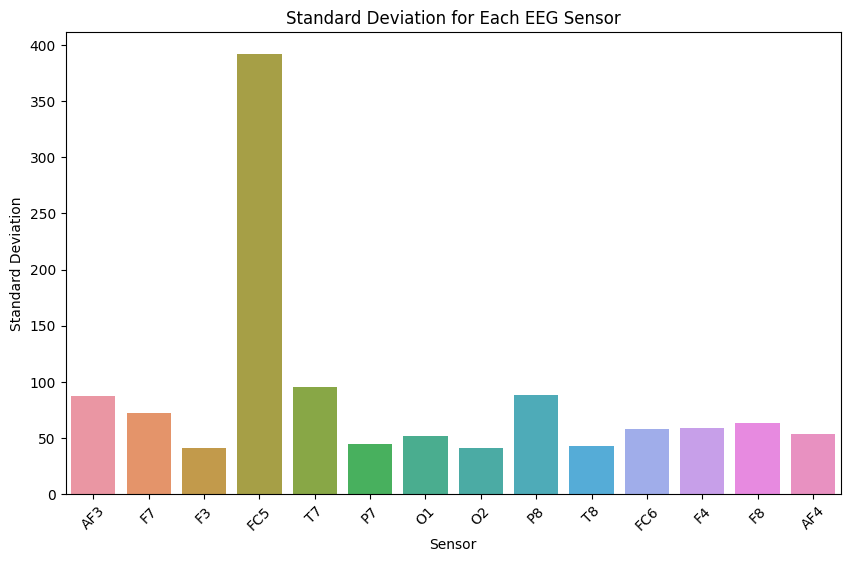

In [22]:
# Further Graphs for Participant 8:

data_participant_8 = {
    "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
    "Mean": [4283.38, 4265.80, 4318.17, 4311.55, 4258.40, 4252.50, 4248.71, 4260.48, 4259.07, 4237.73, 4523.85, 4485.72, 4382.58, 4458.75],
    "Median": [4284.10, 4266.67, 4317.95, 4321.03, 4262.05, 4256.92, 4250.77, 4262.56, 4260.00, 4238.46, 4524.62, 4486.15, 4384.10, 4460.00],
    "Variance": [7615.10, 5151.12, 1687.47, 153721.33, 9082.66, 1947.40, 2671.11, 1646.33, 7728.97, 1830.98, 3352.43, 3489.83, 4029.55, 2833.15],
    "Standard Deviation": [87.26, 71.77, 41.08, 392.07, 95.30, 44.13, 51.68, 40.58, 87.91, 42.79, 57.90, 59.07, 63.48, 53.23]
}

# Create DataFrame
df_participant_8 = pd.DataFrame(data_participant_8)

# Bar Chart of Mean Values:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Mean", data = df_participant_8)
plt.title('Mean Values for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.show()

# Box Plot for Each Sensor:
plt.figure(figsize = (12, 8))
sns.boxplot(data = df_participant_8.drop(columns = ['Variance', 'Standard Deviation']).set_index('Sensor').T)
plt.title('Box Plot for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Value')
plt.xticks(rotation = 45)
plt.show()

# Bar Chart of Standard Deviation:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Standard Deviation", data = df_participant_8)
plt.title('Standard Deviation for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Standard Deviation')
plt.xticks(rotation = 45)
plt.show()

##### Participant 9:

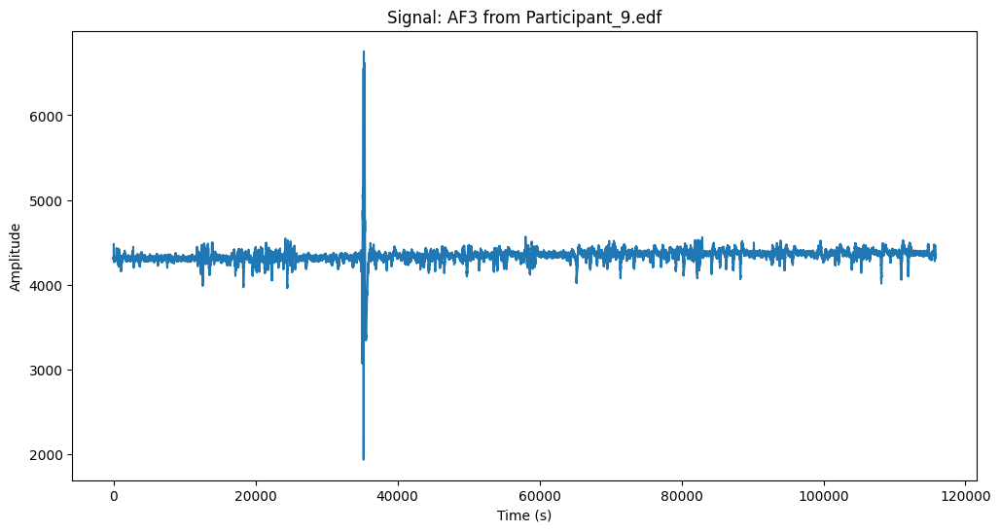

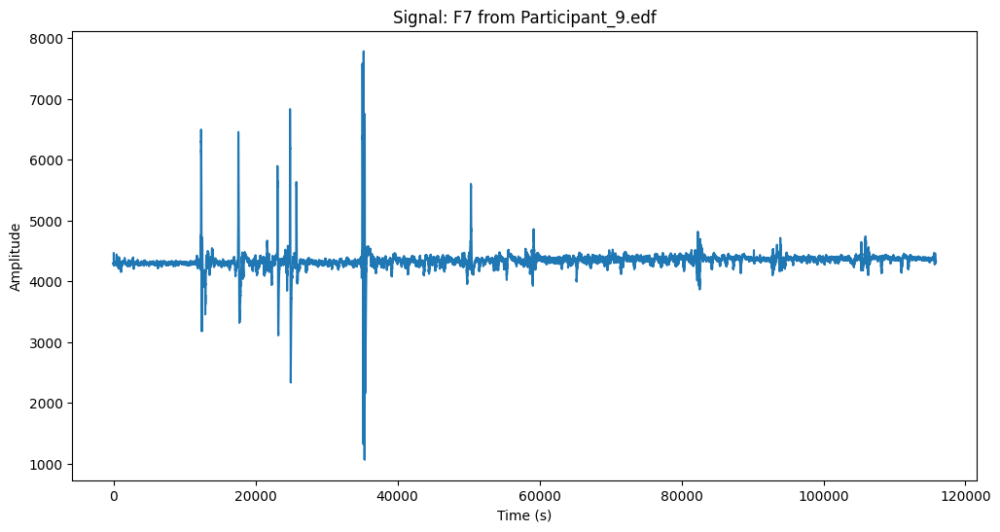

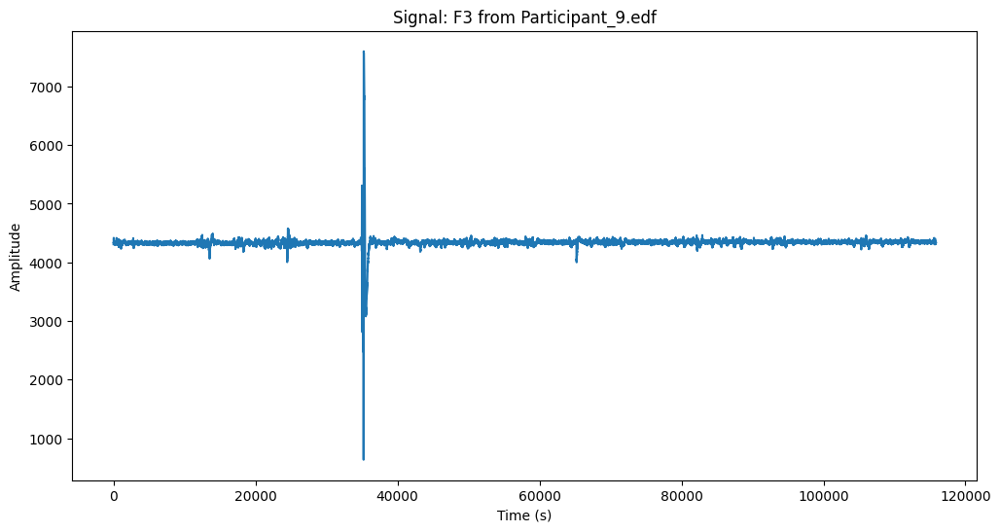

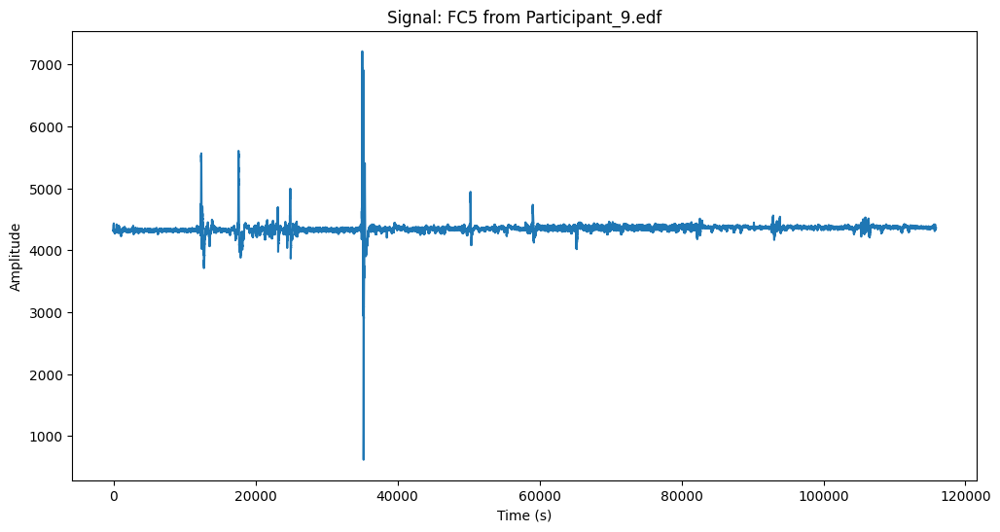

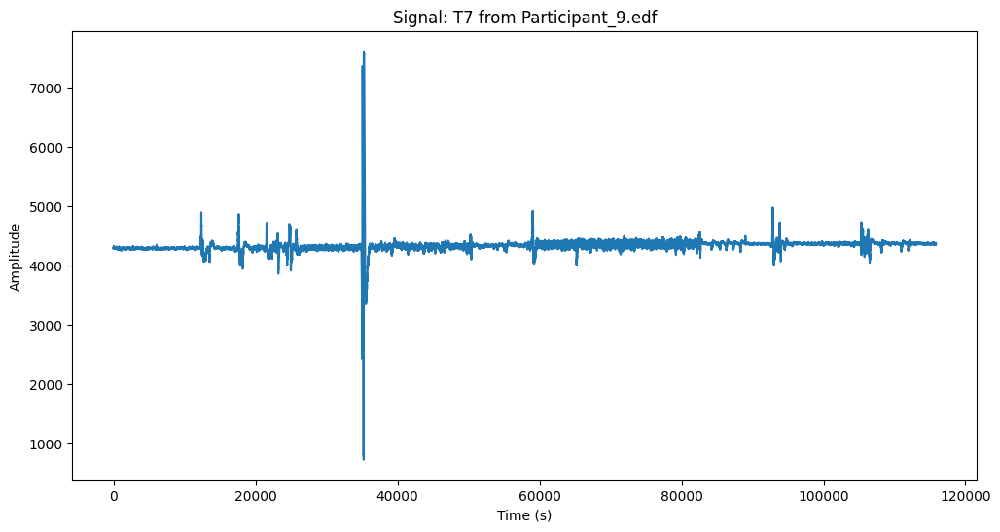

...

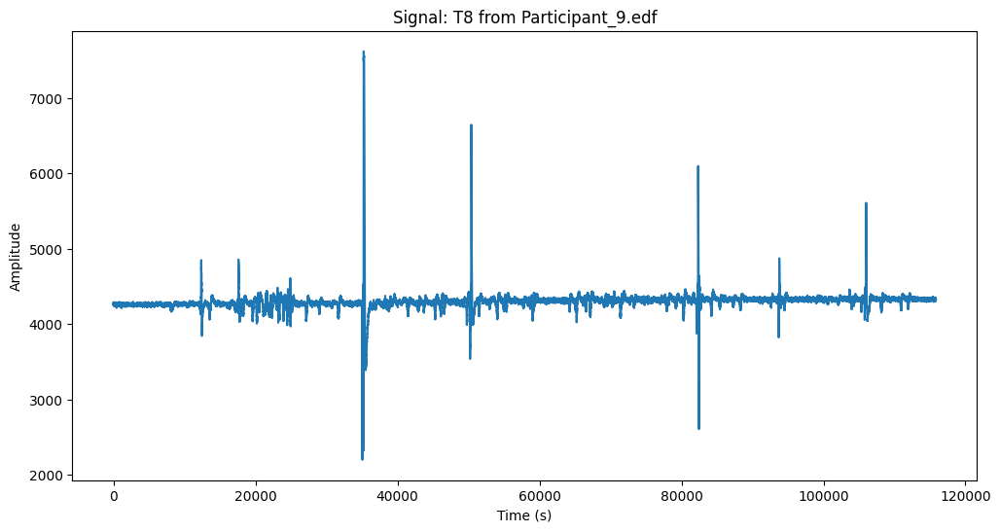

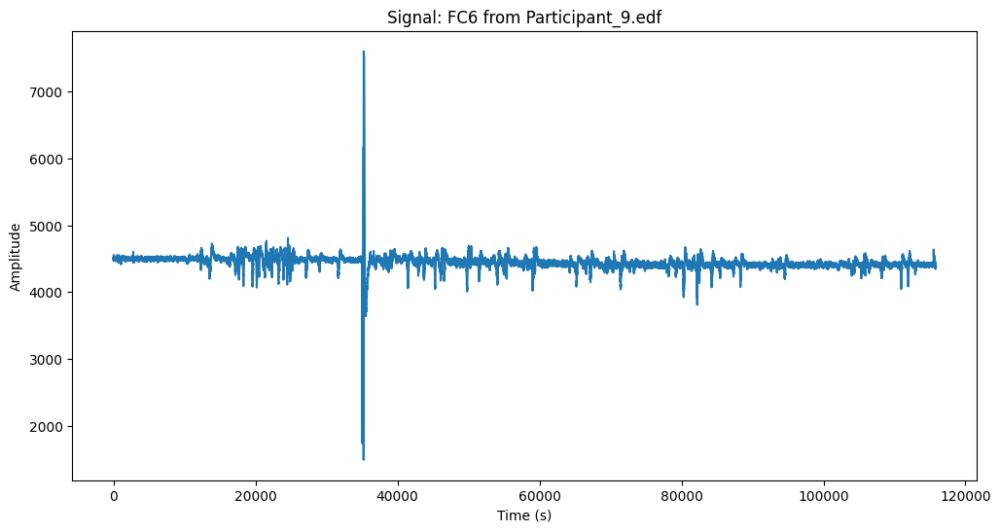

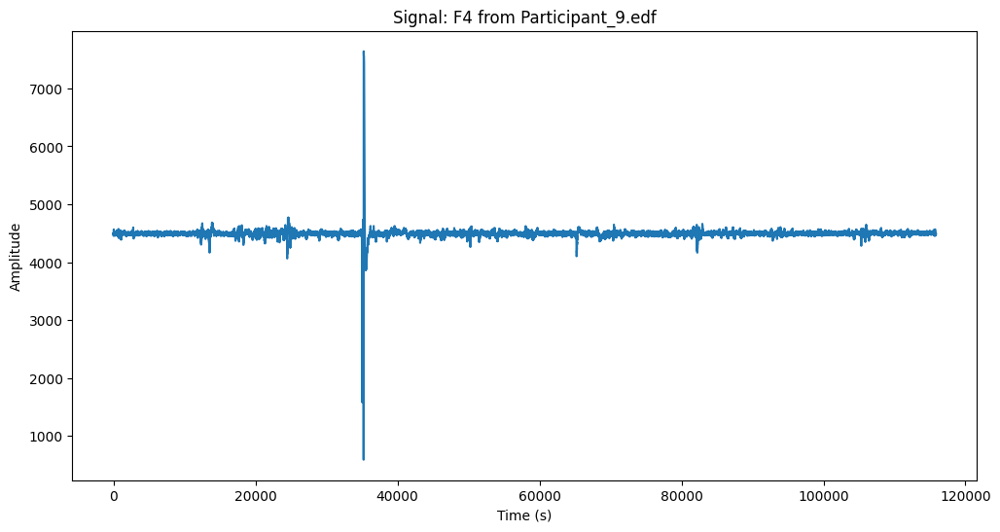

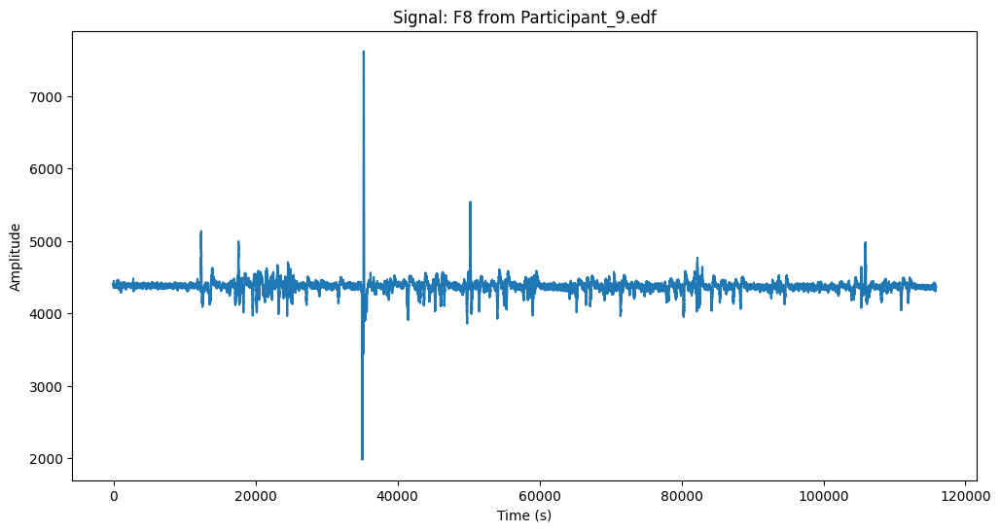

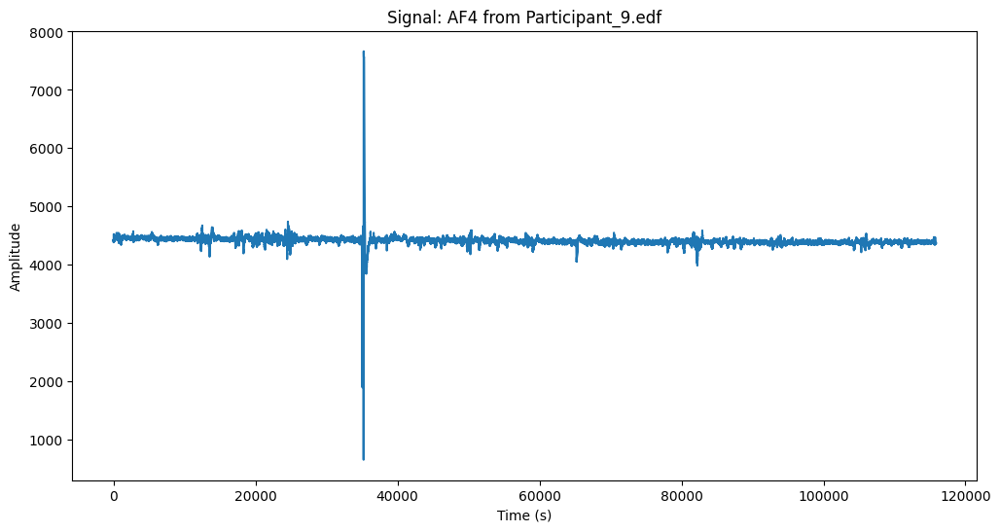

Statistics for Participant_9.edf:
Statistics for AF3:
  Mean: 4340.151322779431
  Median: 4345.641025641027
  Variance: 9704.951270598518
  Standard Deviation: 98.51371107921231

Statistics for F7:
  Mean: 4333.109040763567
  Median: 4341.538461538463
  Variance: 34540.67436102451
  Standard Deviation: 185.85121565656897

Statistics for F3:
  Mean: 4337.352263068426
  Median: 4340.000000000002
  Variance: 15561.40534124486
  Standard Deviation: 124.74536200294125

Statistics for FC5:
  Mean: 4346.739264591302
  Median: 4350.769230769232
  Variance: 11570.498239790119
  Standard Deviation: 107.566250468212

Statistics for T7:
  Mean: 4329.773281449215
  Median: 4335.384615384617
  Variance: 24849.940262368673
  Standard Deviation: 157.63863822796958

Statistics for P7:
  Mean: 4328.932656891913
  Median: 4338.46153846154
  Variance: 12889.139369214168
  Standard Deviation: 113.53034558748674

Statistics for O1:
  Mean: 4327.023091089391
  Median: 4333.846153846155
  Variance: 9697.99947

In [23]:
analyse_edf(file_participant_9, channels_of_interest)

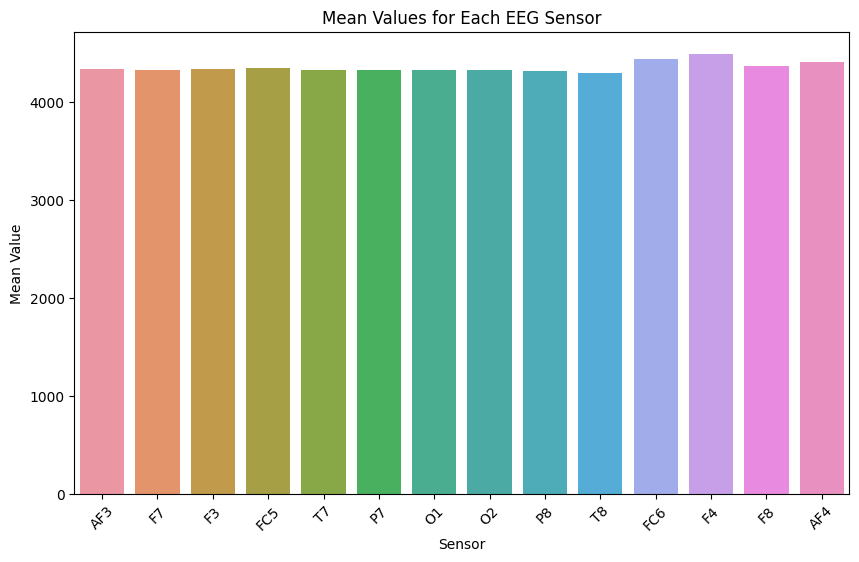

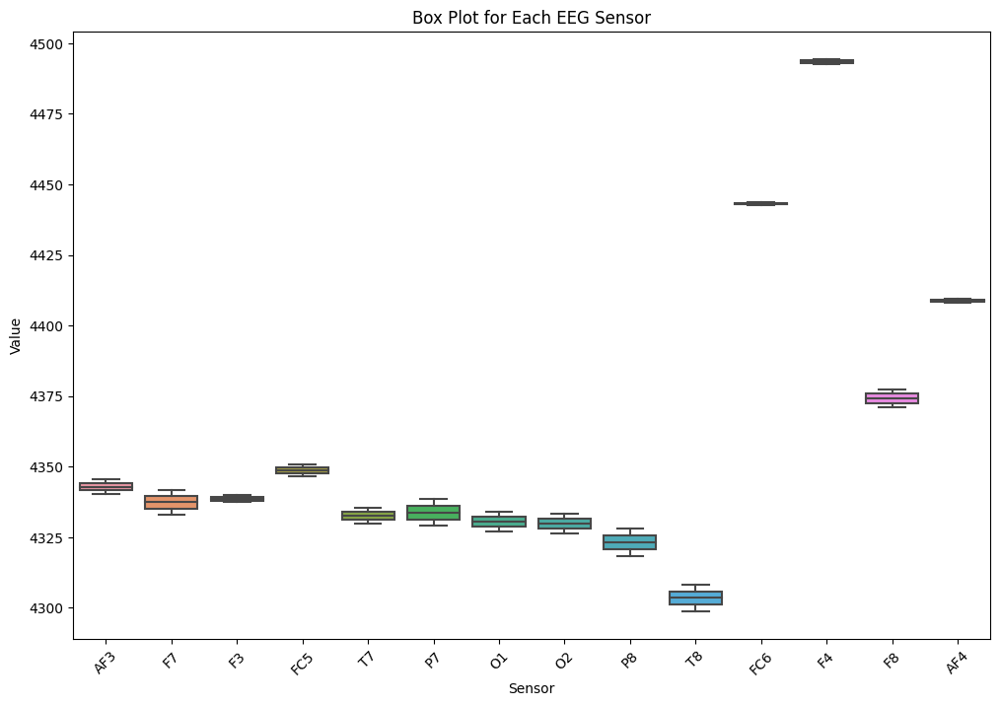

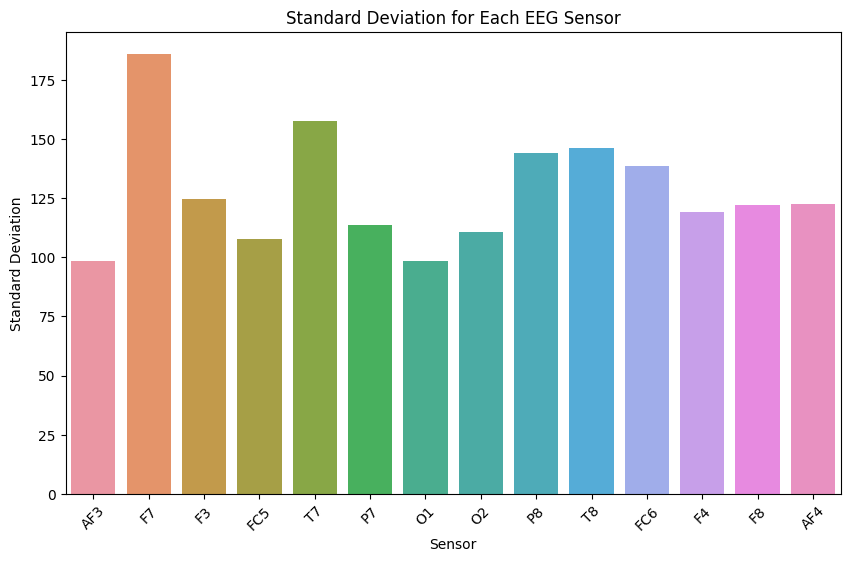

In [24]:
# Further Graphs for Participant 9:

data_participant_9 = {
    "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
    "Mean": [4340.15, 4333.11, 4337.35, 4346.74, 4329.77, 4328.93, 4327.02, 4326.20, 4318.13, 4298.71, 4443.72, 4492.68, 4370.91, 4409.36],
    "Median": [4345.64, 4341.54, 4340.00, 4350.77, 4335.38, 4338.46, 4333.85, 4333.33, 4328.21, 4308.21, 4442.56, 4494.36, 4377.44, 4408.21],
    "Variance": [9704.95, 34540.67, 15561.41, 11570.50, 24849.94, 12889.14, 9698.00, 12243.38, 20741.24, 21352.55, 19231.01, 14174.29, 14903.50, 15045.00],
    "Standard Deviation": [98.51, 185.85, 124.75, 107.57, 157.64, 113.53, 98.48, 110.65, 144.02, 146.13, 138.68, 119.06, 122.08, 122.66]
}

# Create DataFrame
df_participant_9 = pd.DataFrame(data_participant_9)

# Bar Chart of Mean Values:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Mean", data = df_participant_9)
plt.title('Mean Values for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.show()

# Box Plot for Each Sensor:
plt.figure(figsize = (12, 8))
sns.boxplot(data = df_participant_9.drop(columns = ['Variance', 'Standard Deviation']).set_index('Sensor').T)
plt.title('Box Plot for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Value')
plt.xticks(rotation = 45)
plt.show()

# Bar Chart of Standard Deviation:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Standard Deviation", data = df_participant_9)
plt.title('Standard Deviation for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Standard Deviation')
plt.xticks(rotation = 45)
plt.show()

##### Participant 10:

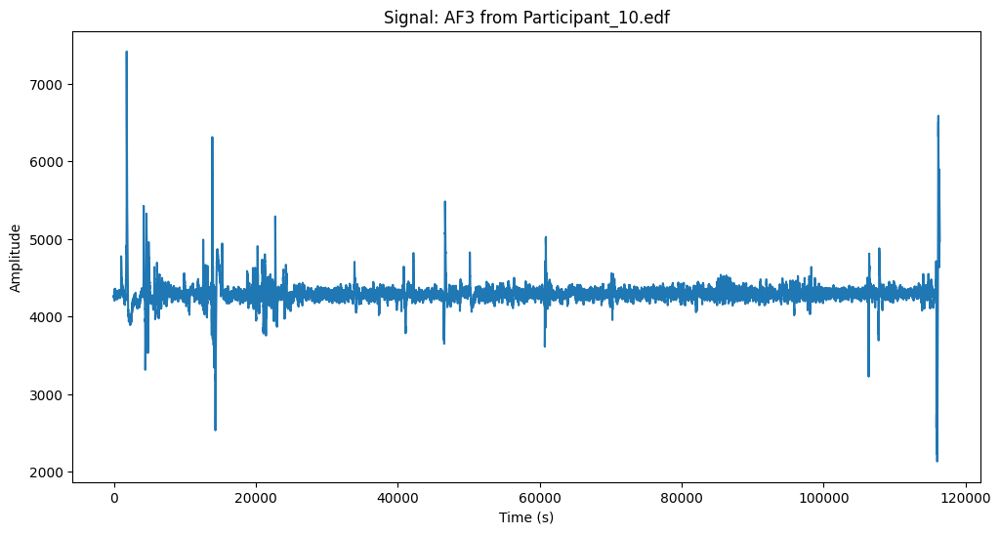

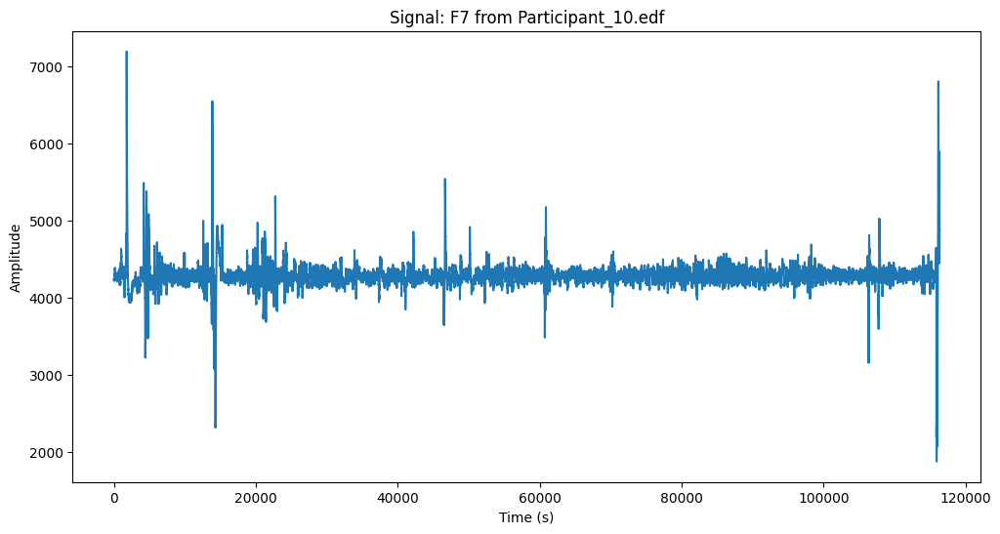

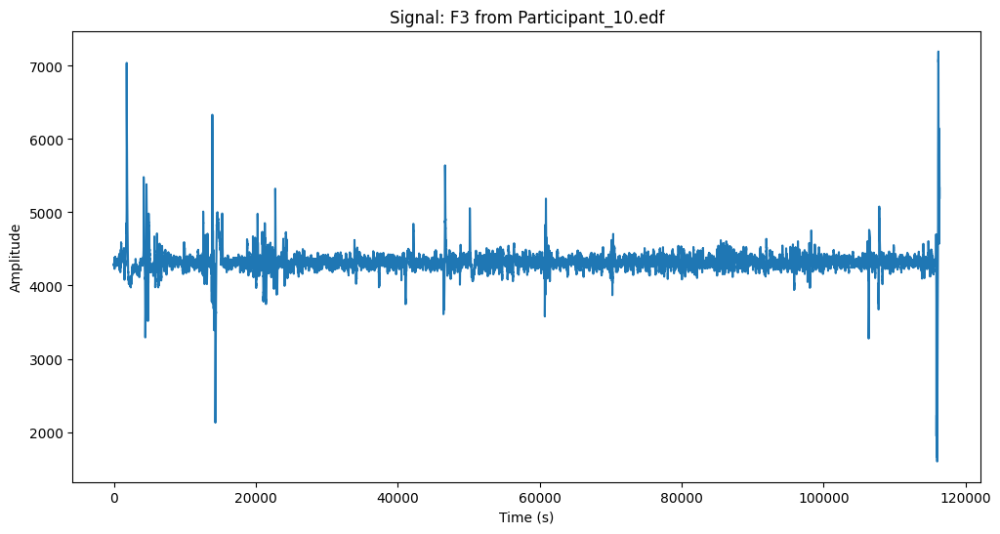

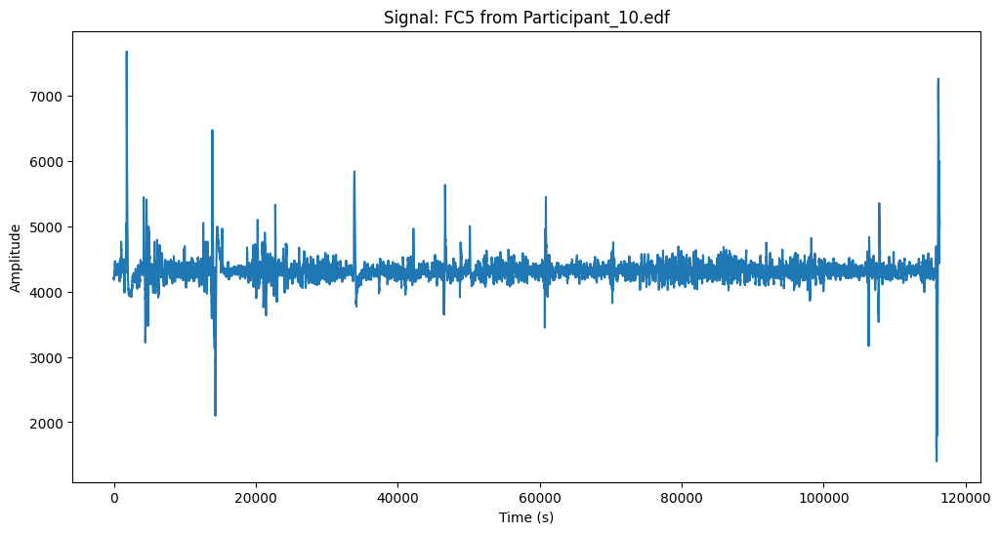

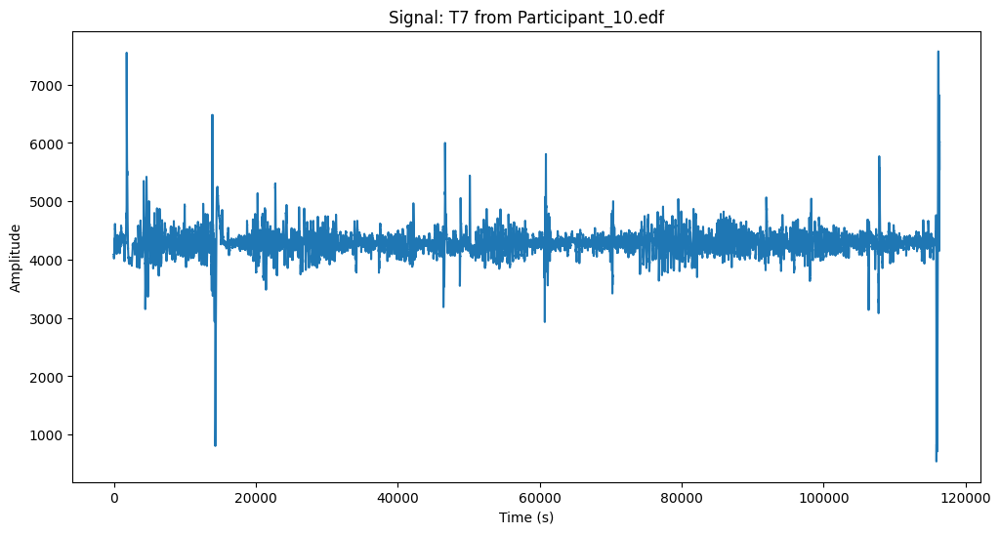

...

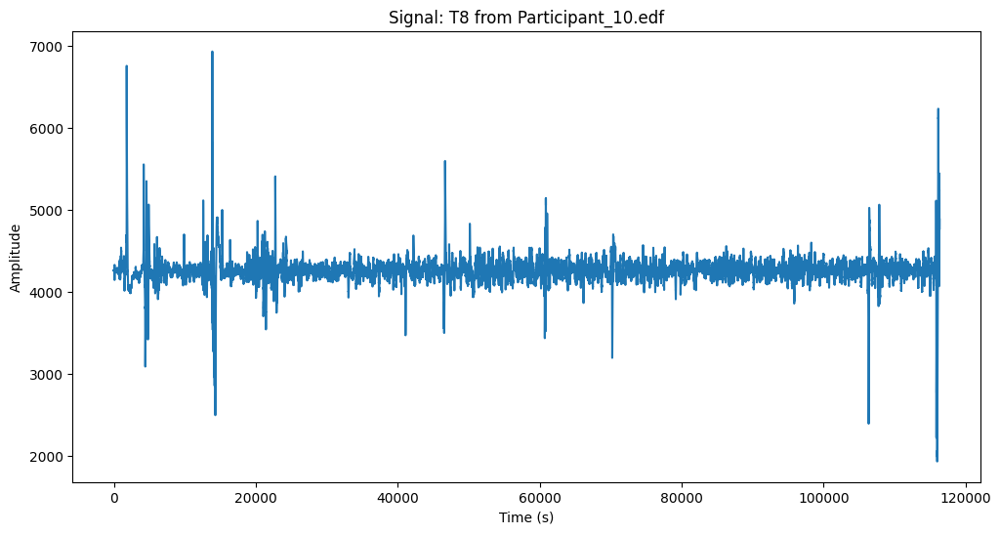

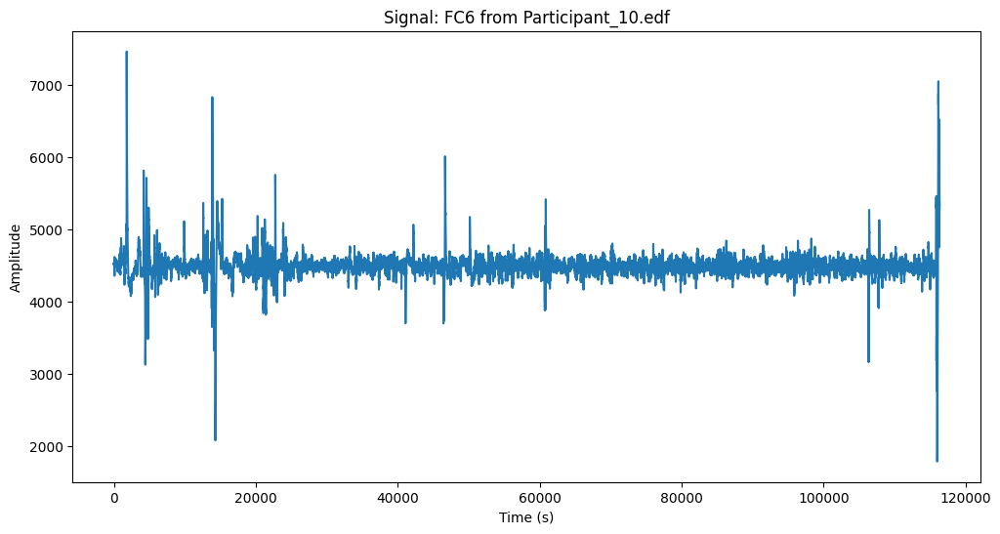

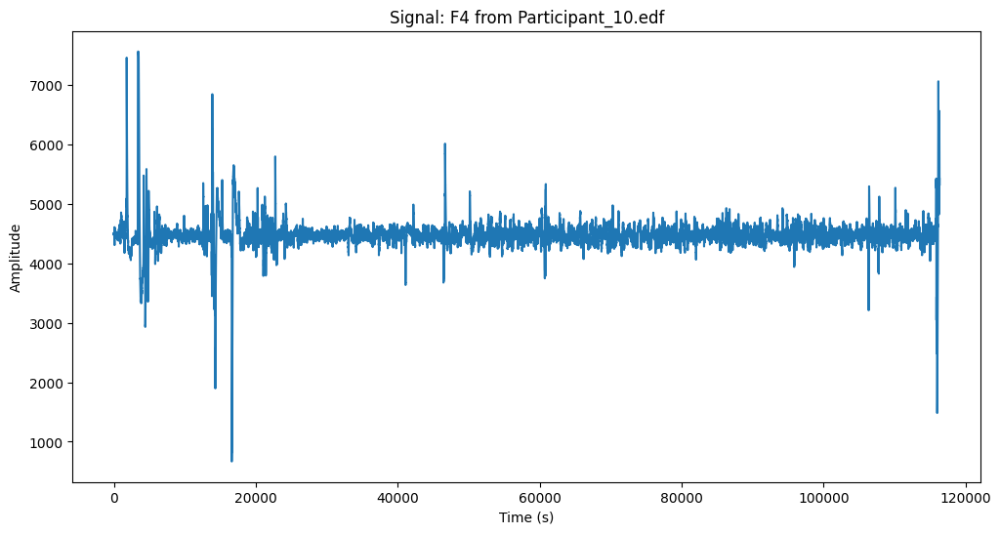

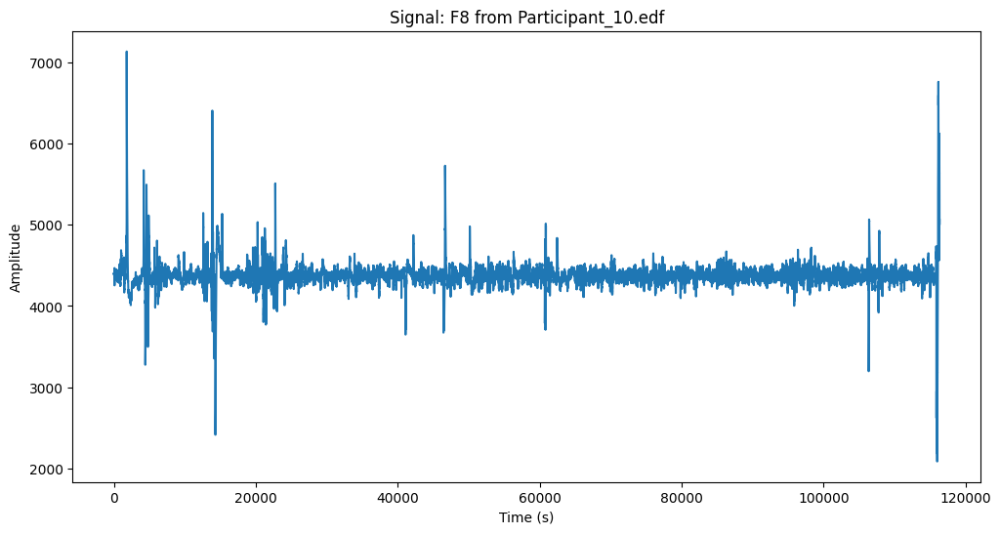

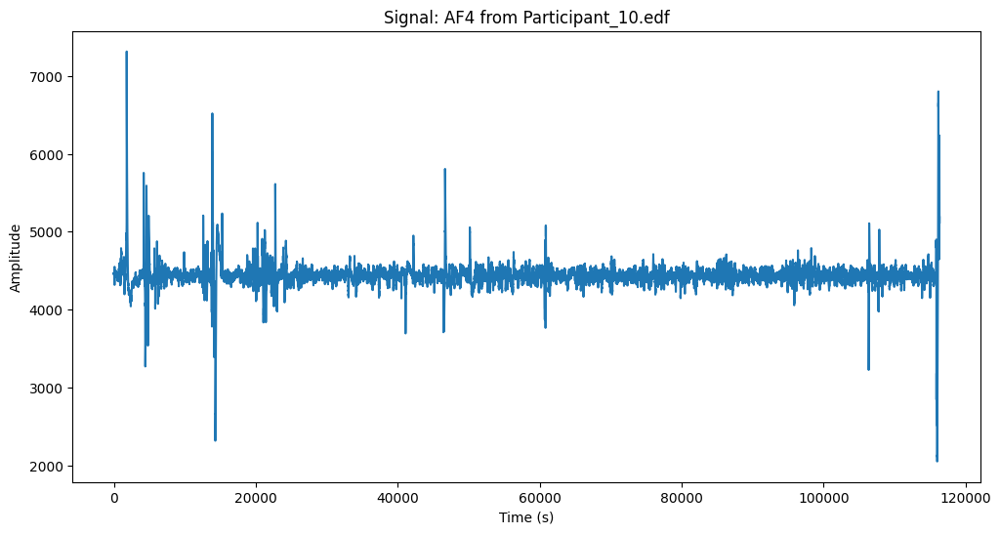

Statistics for Participant_10.edf:
Statistics for AF3:
  Mean: 4303.738853452654
  Median: 4304.615384615386
  Variance: 22910.284369928544
  Standard Deviation: 151.36143620463088

Statistics for F7:
  Mean: 4292.847623303998
  Median: 4292.307692307694
  Variance: 27290.841470749485
  Standard Deviation: 165.19939912345168

Statistics for F3:
  Mean: 4325.157334243041
  Median: 4325.641025641027
  Variance: 29578.053455322482
  Standard Deviation: 171.98271266415844

Statistics for FC5:
  Mean: 4320.287597670025
  Median: 4316.410256410258
  Variance: 38717.23405706121
  Standard Deviation: 196.7669536712433

Statistics for T7:
  Mean: 4286.3658421130585
  Median: 4288.71794871795
  Variance: 67515.67710842752
  Standard Deviation: 259.83778999296374

Statistics for P7:
  Mean: 4284.419982863673
  Median: 4285.641025641027
  Variance: 12272.637659457501
  Standard Deviation: 110.7819374241916

Statistics for O1:
  Mean: 4280.456893846438
  Median: 4284.102564102565
  Variance: 19526.

In [25]:
analyse_edf(file_participant_10, channels_of_interest)

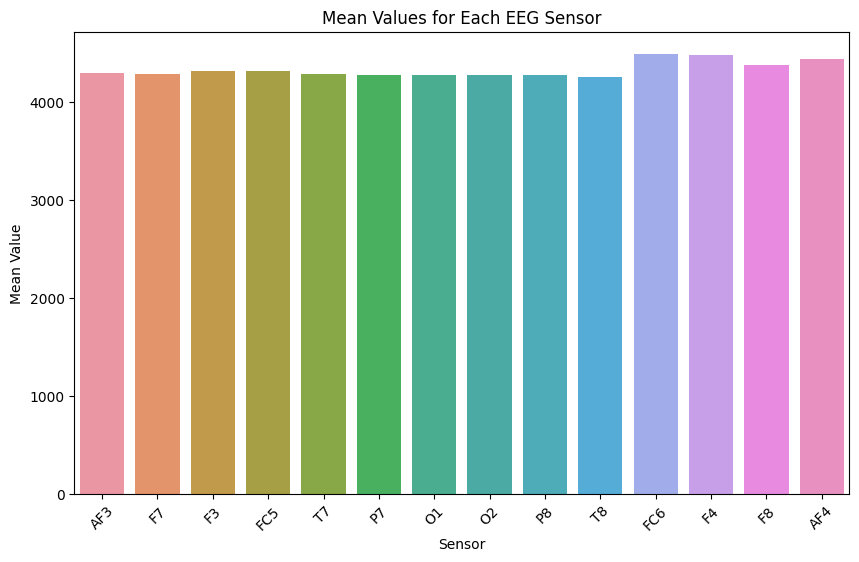

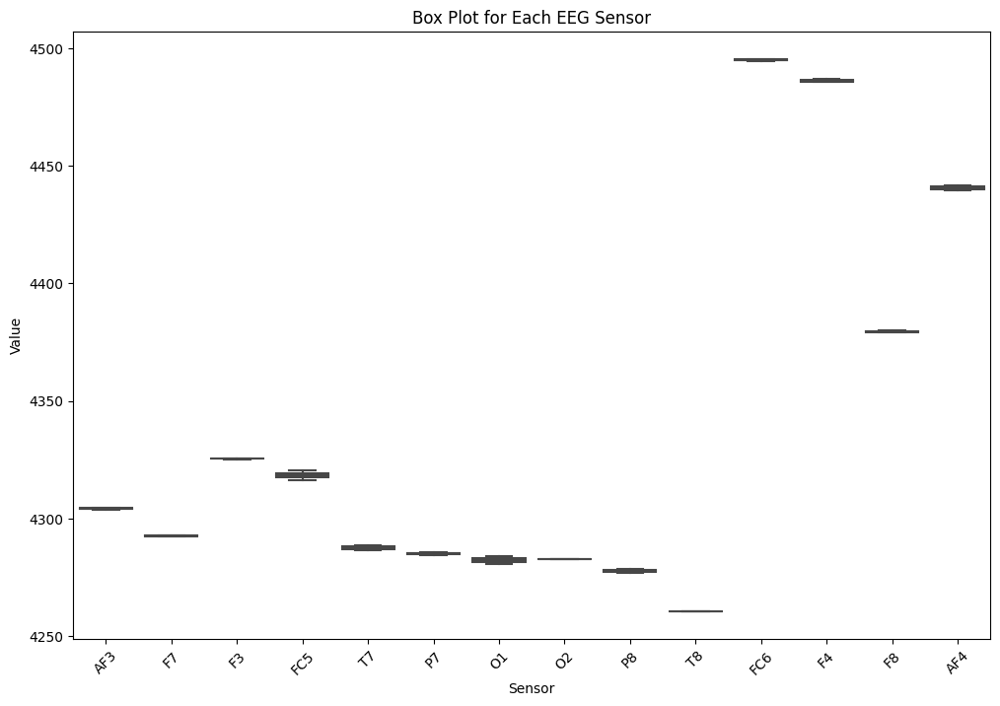

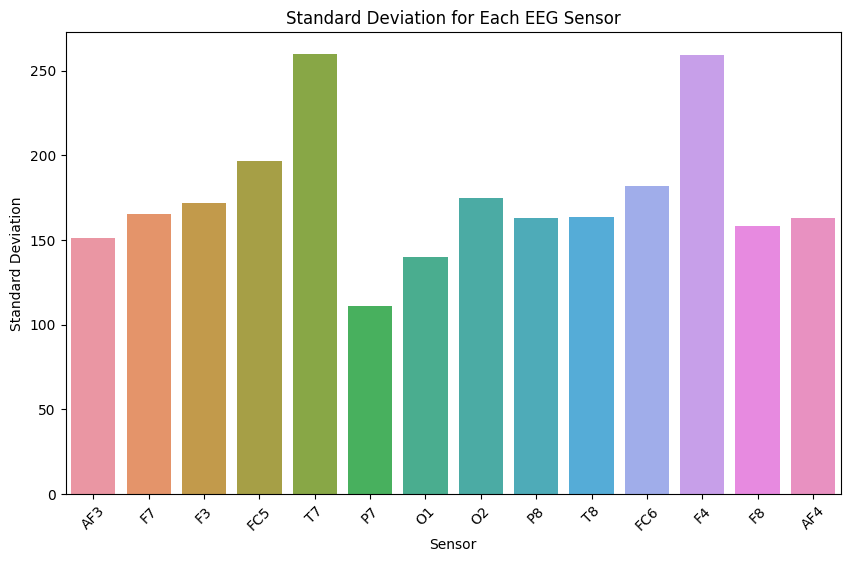

In [26]:
# Further Graphs for Participant 10:

data_participant_10 = {
    "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
    "Mean": [4303.74, 4292.85, 4325.16, 4320.29, 4286.37, 4284.42, 4280.46, 4282.86, 4276.78, 4260.43, 4494.59, 4486.81, 4379.04, 4439.64],
    "Median": [4304.62, 4292.31, 4325.64, 4316.41, 4288.72, 4285.64, 4284.10, 4282.56, 4278.46, 4260.51, 4495.38, 4485.64, 4380.00, 4441.54],
    "Variance": [22910.28, 27290.84, 29578.05, 38717.23, 67515.68, 12272.64, 19526.45, 30466.03, 26635.16, 26765.87, 33179.41, 67212.00, 25139.09, 26522.14],
    "Standard Deviation": [151.36, 165.20, 171.98, 196.77, 259.84, 110.78, 139.74, 174.55, 163.20, 163.60, 182.15, 259.25, 158.55, 162.86]
}

# Create DataFrame
data_participant_10 = pd.DataFrame(data_participant_10)

# Bar Chart of Mean Values:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Mean", data = data_participant_10)
plt.title('Mean Values for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.show()

# Box Plot for Each Sensor:
plt.figure(figsize = (12, 8))
sns.boxplot(data = data_participant_10.drop(columns = ['Variance', 'Standard Deviation']).set_index('Sensor').T)
plt.title('Box Plot for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Value')
plt.xticks(rotation = 45)
plt.show()

# Bar Chart of Standard Deviation:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Standard Deviation", data = data_participant_10)
plt.title('Standard Deviation for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Standard Deviation')
plt.xticks(rotation = 45)
plt.show()

##### Participant 11:

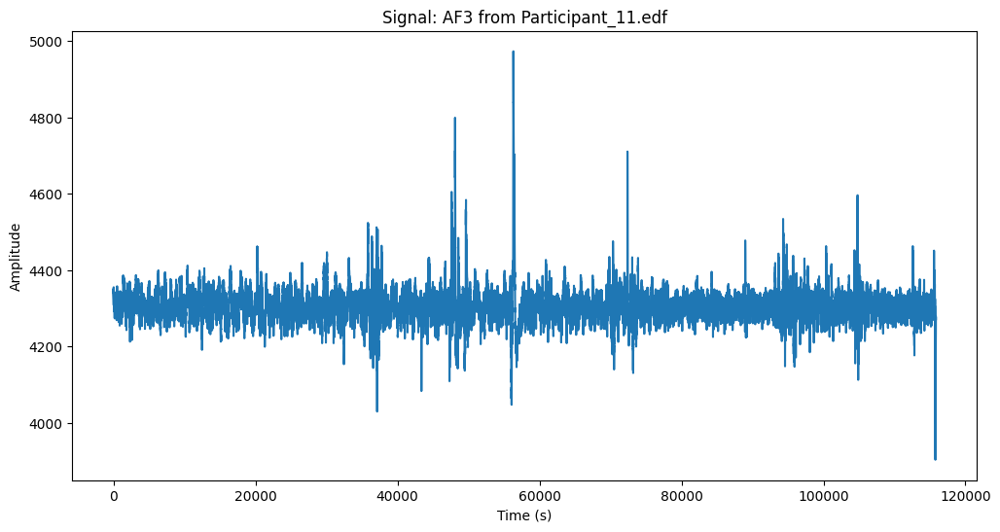

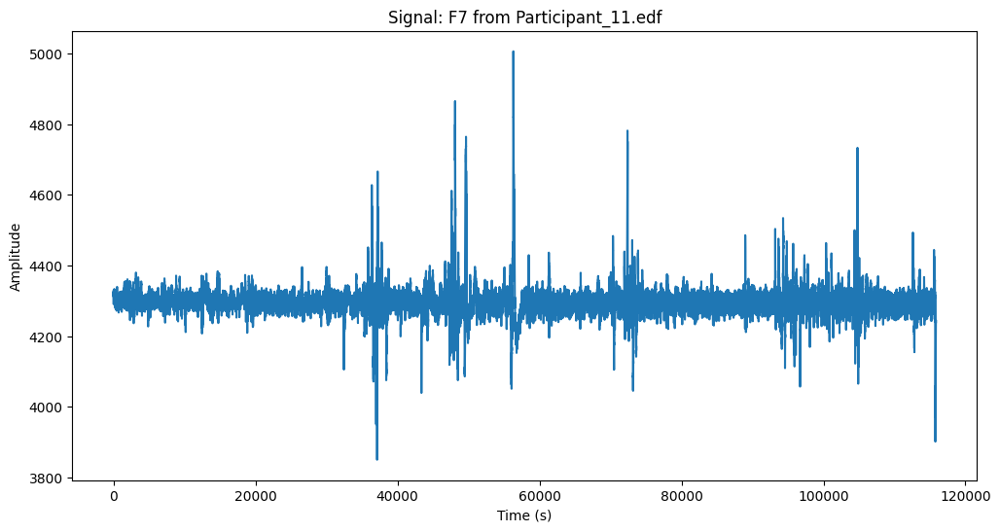

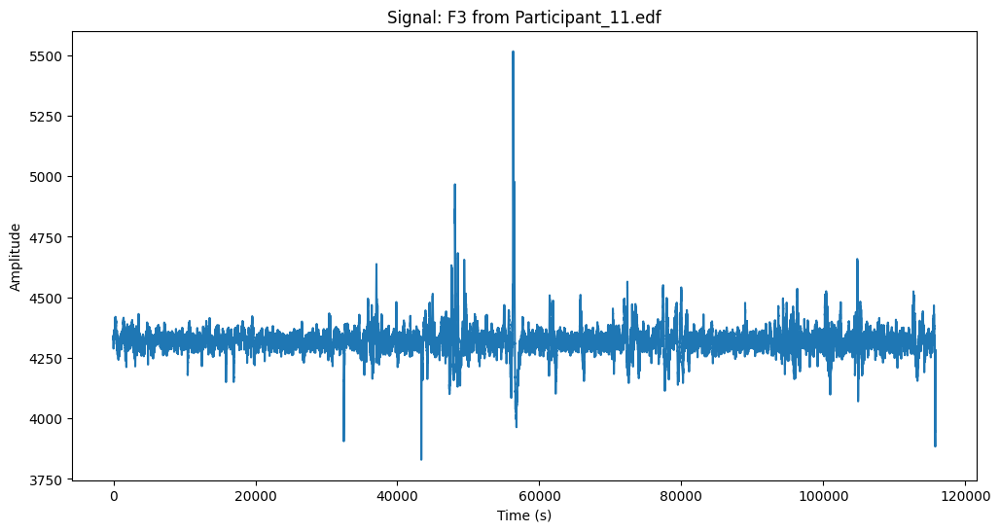

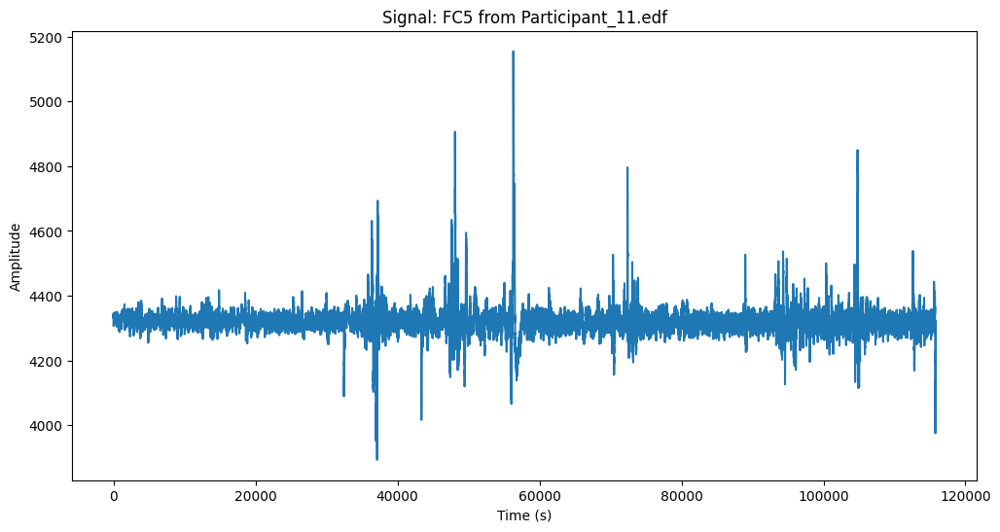

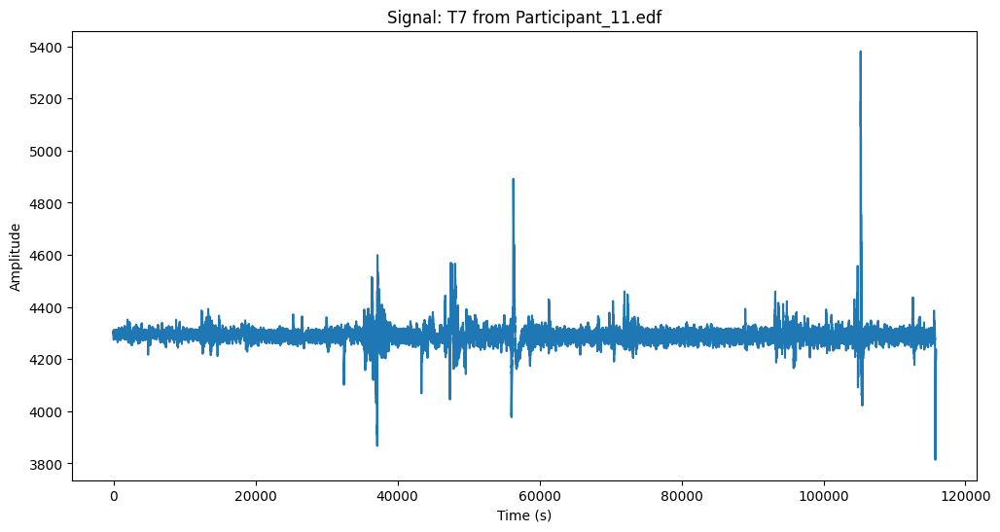

...

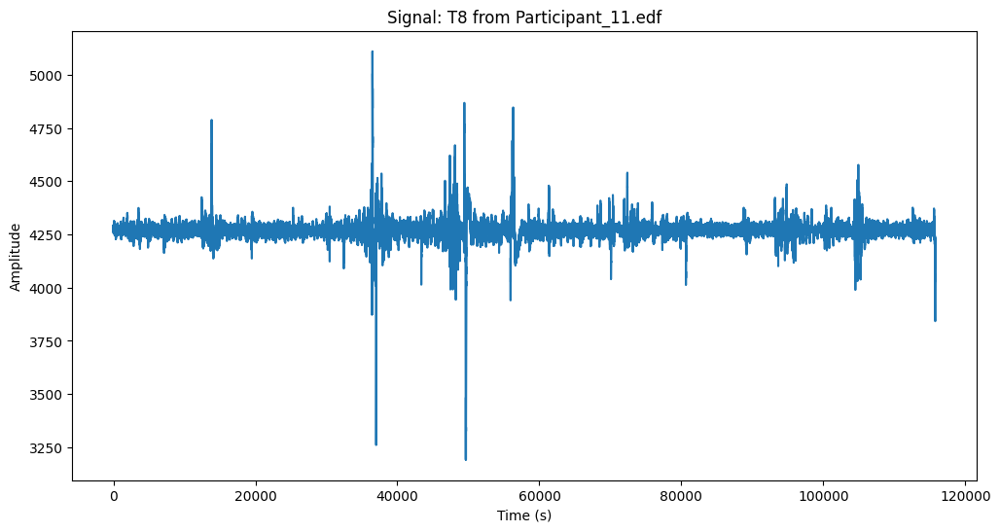

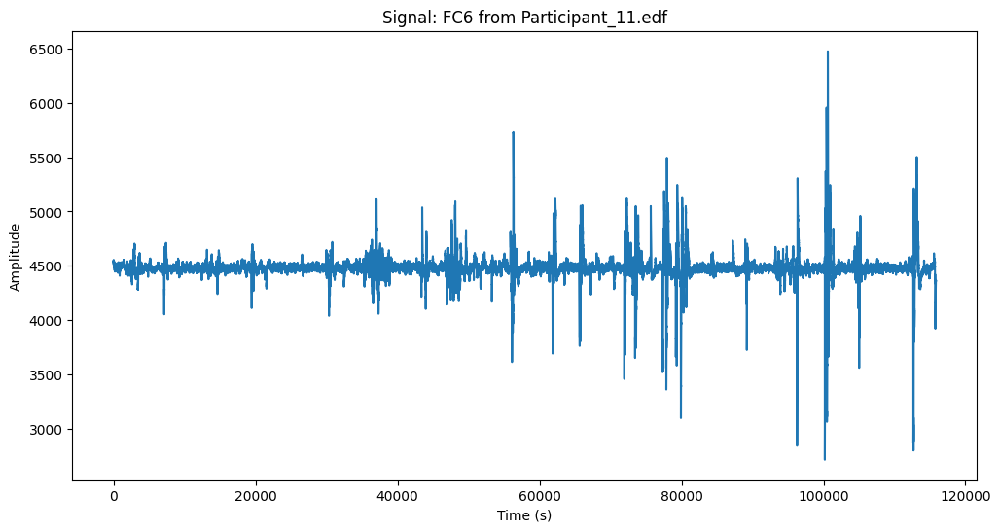

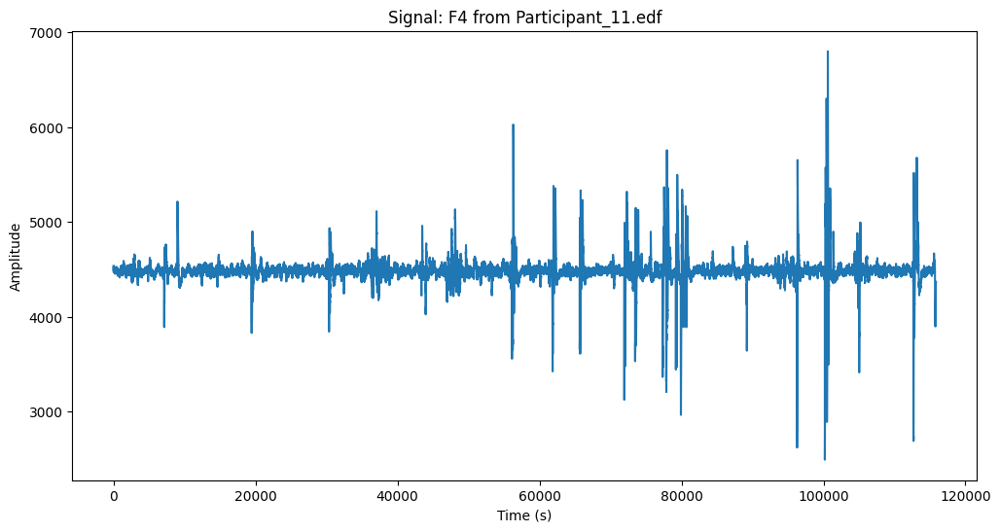

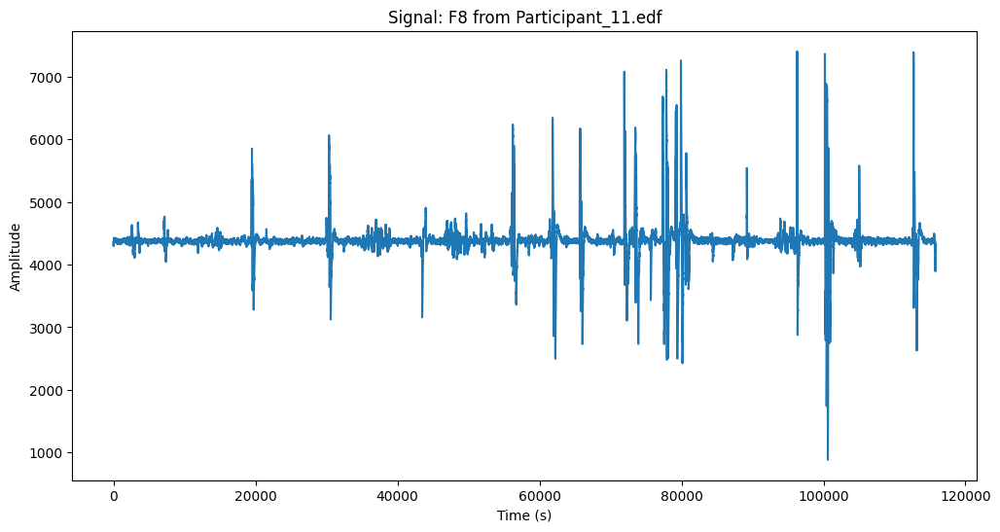

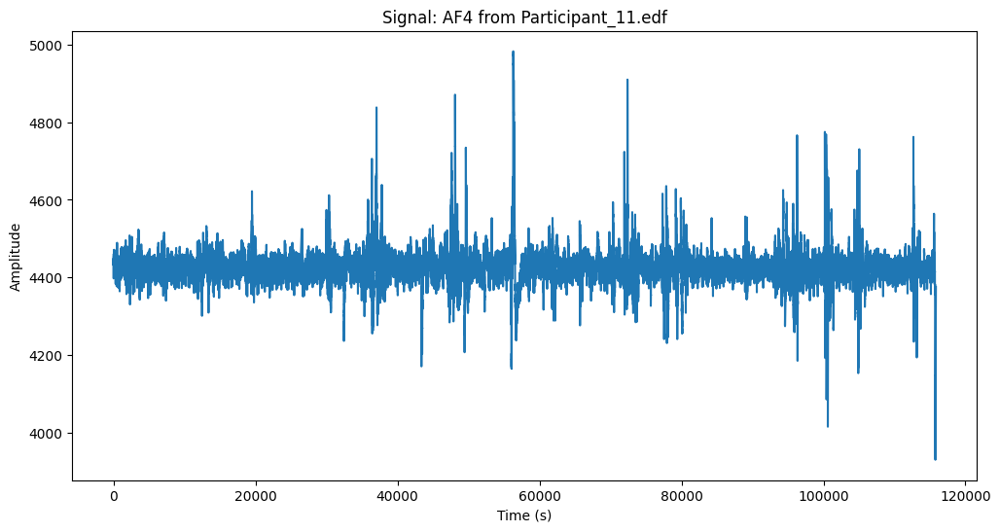

Statistics for Participant_11.edf:
Statistics for AF3:
  Mean: 4312.30220728857
  Median: 4311.794871794873
  Variance: 1812.3011715992664
  Standard Deviation: 42.57113072963022

Statistics for F7:
  Mean: 4302.229941386884
  Median: 4302.564102564104
  Variance: 1811.400320009114
  Standard Deviation: 42.56054886874832

Statistics for F3:
  Mean: 4328.719980698401
  Median: 4328.20512820513
  Variance: 3408.349677219832
  Standard Deviation: 58.38107293652483

Statistics for FC5:
  Mean: 4327.144691174389
  Median: 4326.666666666668
  Variance: 1837.6612069190392
  Standard Deviation: 42.867950813154565

Statistics for T7:
  Mean: 4296.645886457007
  Median: 4296.410256410258
  Variance: 1391.800061097914
  Standard Deviation: 37.306836653593585

Statistics for P7:
  Mean: 4293.533742385608
  Median: 4293.846153846155
  Variance: 799.2643383748537
  Standard Deviation: 28.27126347326652

Statistics for O1:
  Mean: 4291.447845835106
  Median: 4291.794871794873
  Variance: 3607.8630823

In [27]:
analyse_edf(file_participant_11, channels_of_interest)

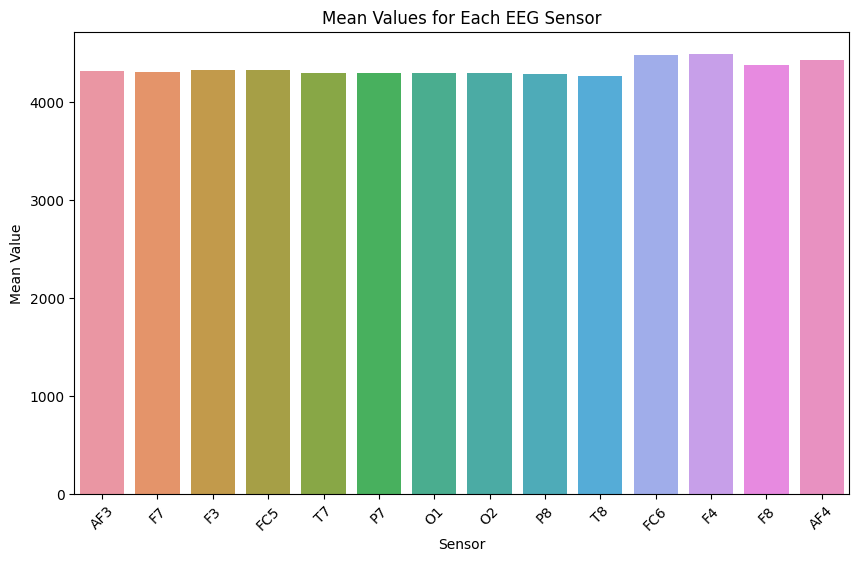

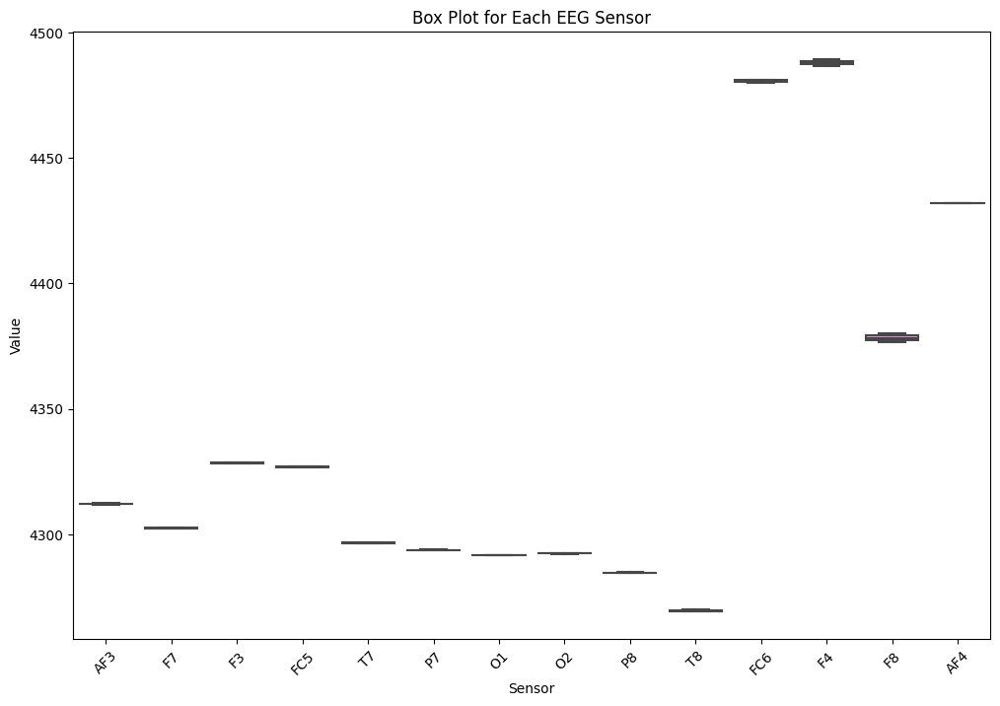

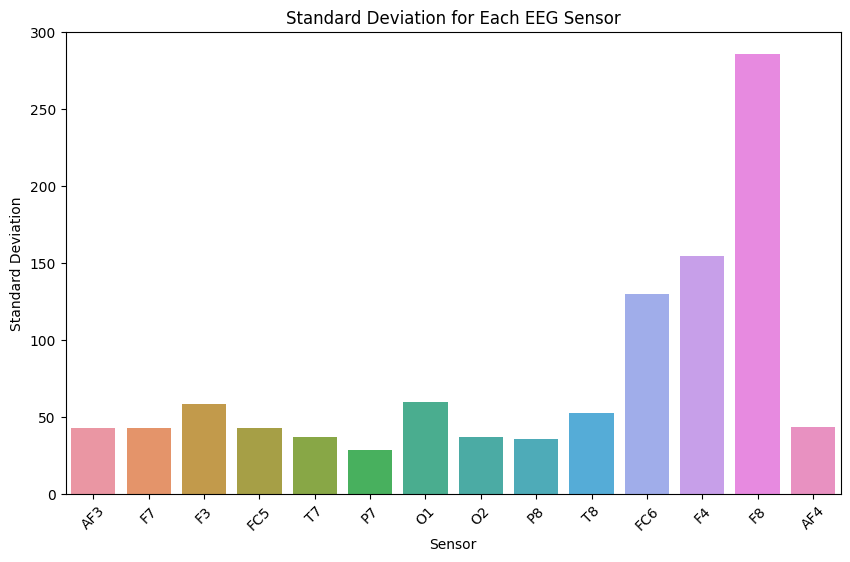

In [28]:
# Further Graphs for Participant 11:

data_participant_11 = {
    "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
    "Mean": [4312.30, 4302.23, 4328.72, 4327.14, 4296.65, 4293.53, 4291.45, 4292.22, 4284.76, 4269.87, 4481.23, 4489.34, 4376.50, 4431.77],
    "Median": [4311.79, 4302.56, 4328.21, 4326.67, 4296.41, 4293.85, 4291.79, 4292.31, 4284.62, 4269.23, 4480.00, 4486.67, 4380.00, 4431.79],
    "Variance": [1812.30, 1811.40, 3408.35, 1837.66, 1391.80, 799.26, 3607.86, 1350.19, 1267.00, 2743.50, 16915.44, 23843.50, 81694.65, 1911.61],
    "Standard Deviation": [42.57, 42.56, 58.38, 42.87, 37.31, 28.27, 60.07, 36.74, 35.59, 52.38, 130.06, 154.41, 285.82, 43.72]
}

# Create DataFrame
data_participant_11 = pd.DataFrame(data_participant_11)

# Bar Chart of Mean Values:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Mean", data = data_participant_11)
plt.title('Mean Values for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.show()

# Box Plot for Each Sensor:
plt.figure(figsize = (12, 8))
sns.boxplot(data = data_participant_11.drop(columns = ['Variance', 'Standard Deviation']).set_index('Sensor').T)
plt.title('Box Plot for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Value')
plt.xticks(rotation = 45)
plt.show()

# Bar Chart of Standard Deviation:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Standard Deviation", data = data_participant_11)
plt.title('Standard Deviation for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Standard Deviation')
plt.xticks(rotation = 45)
plt.show()

##### Participant 12:

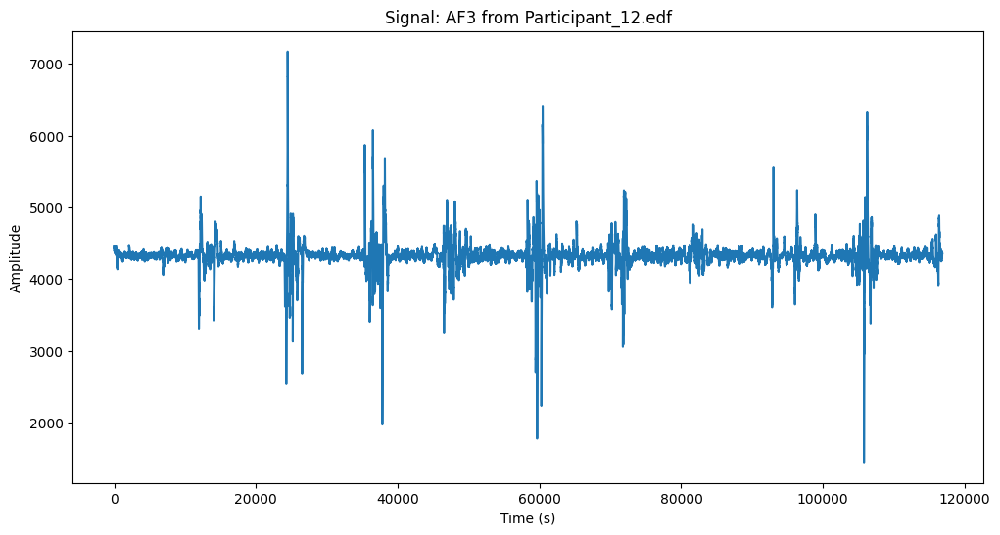

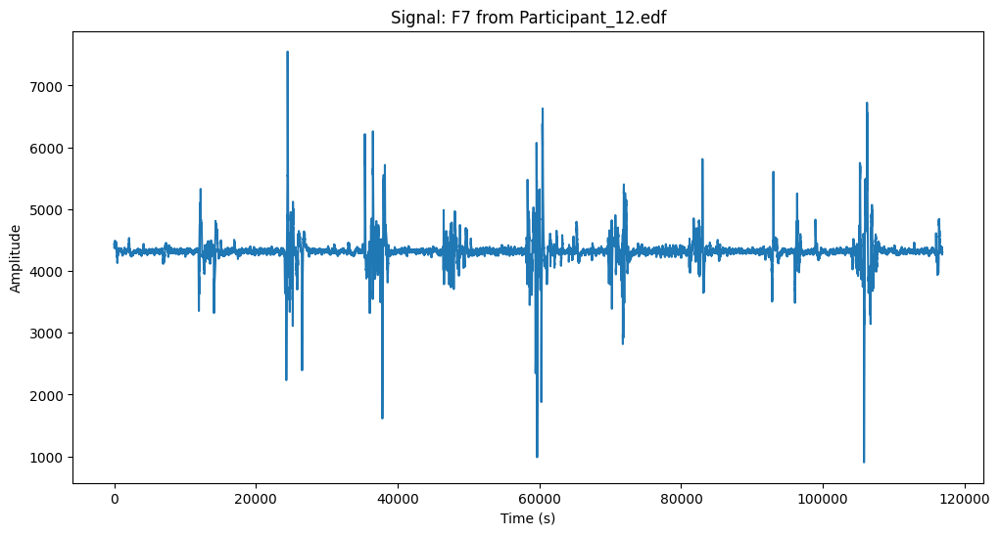

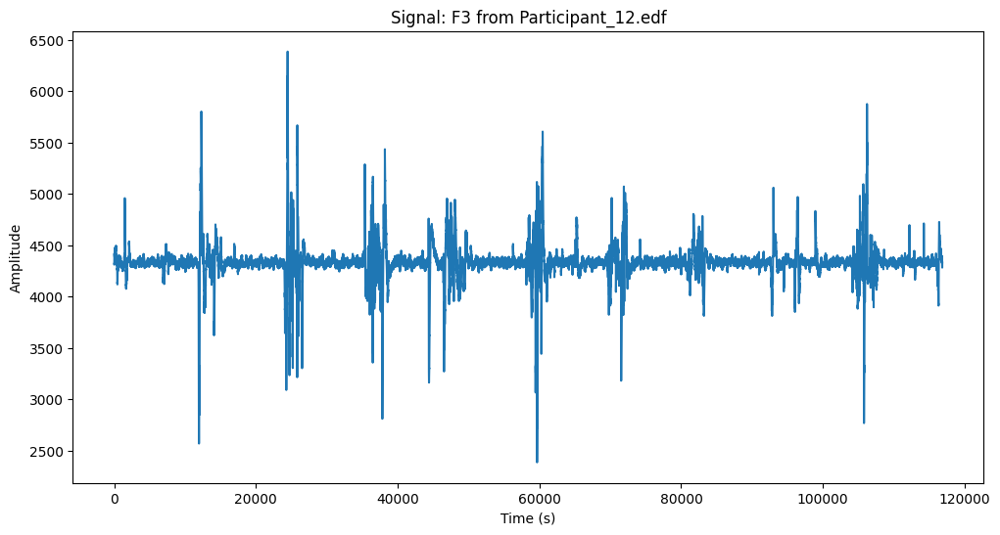

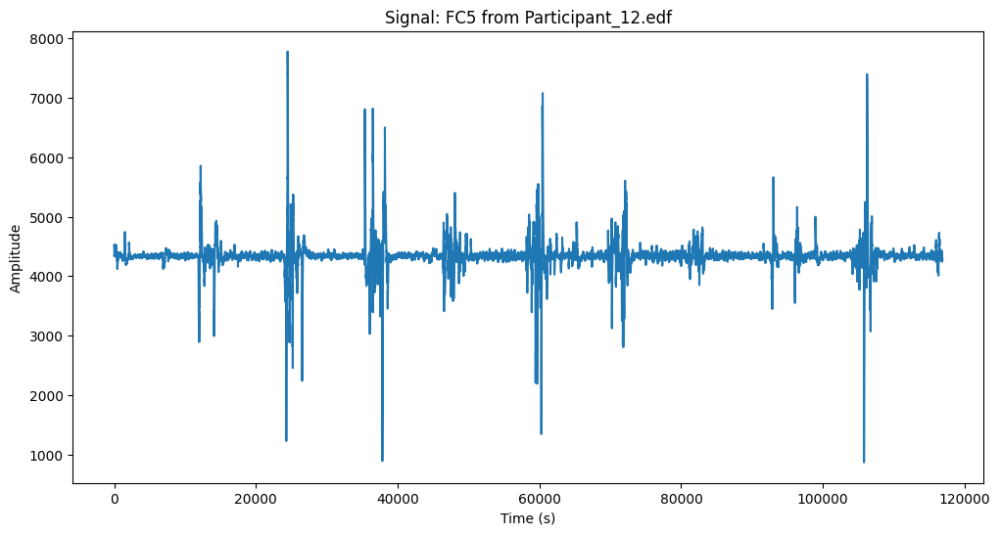

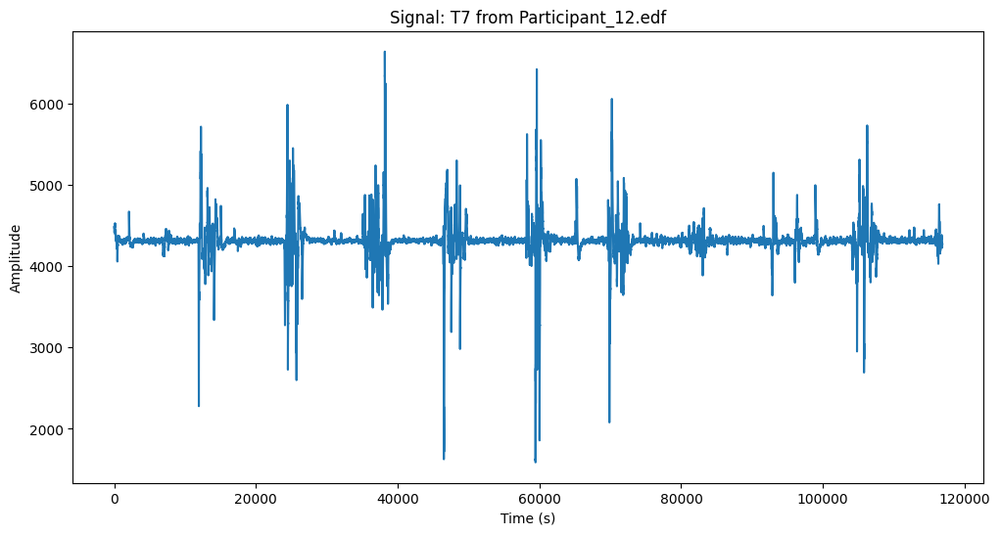

...

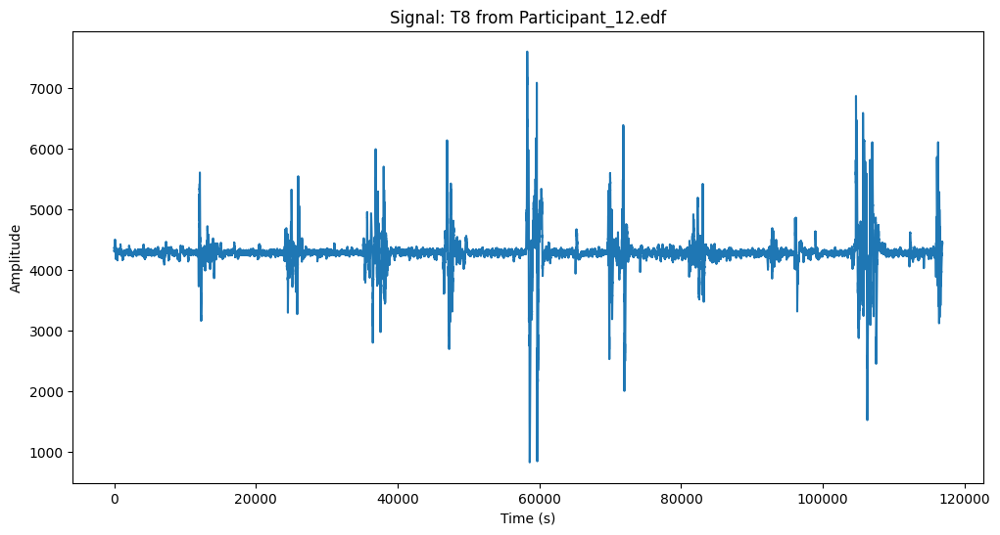

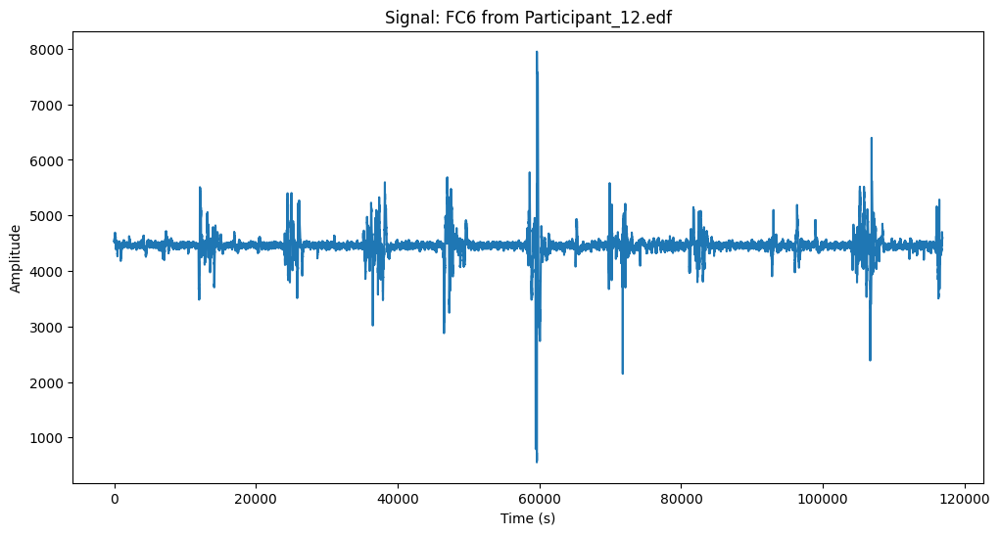

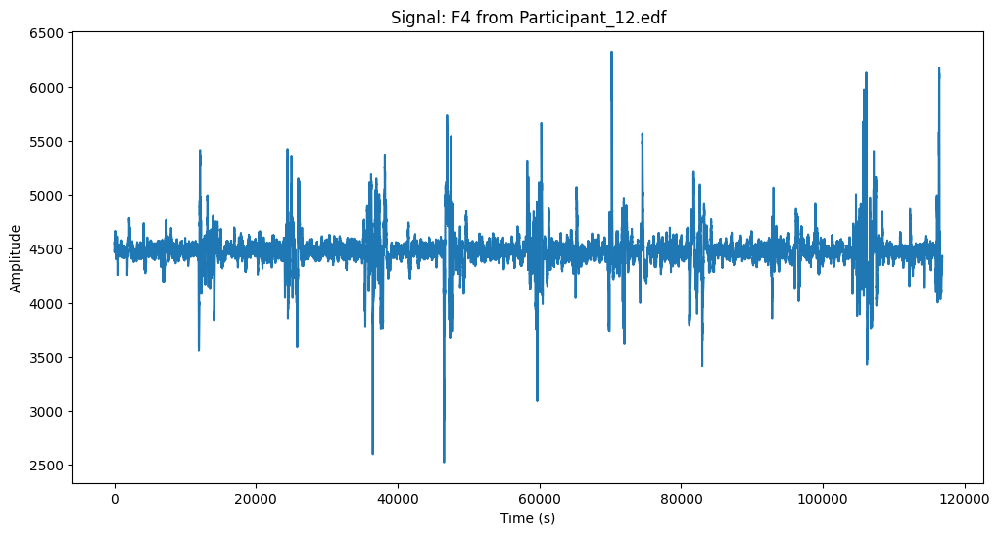

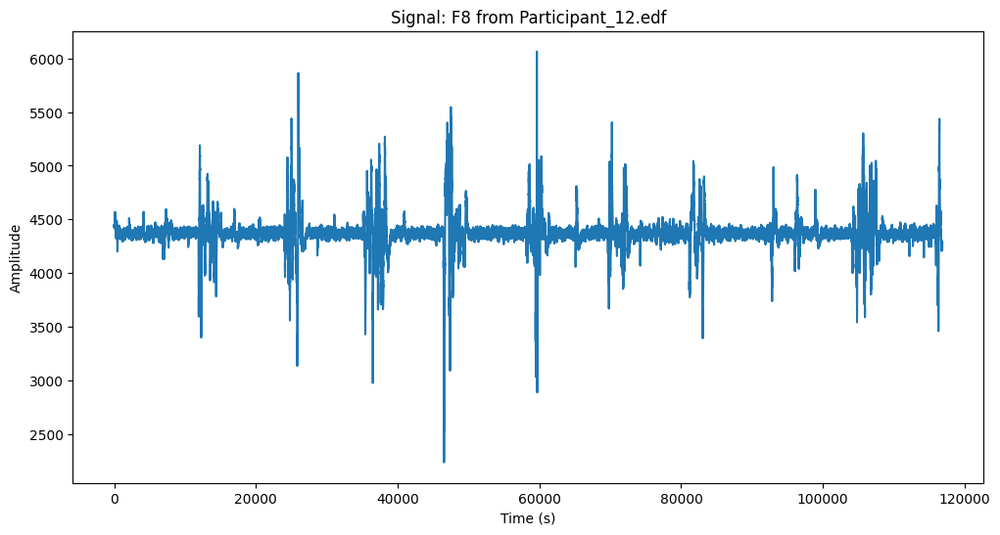

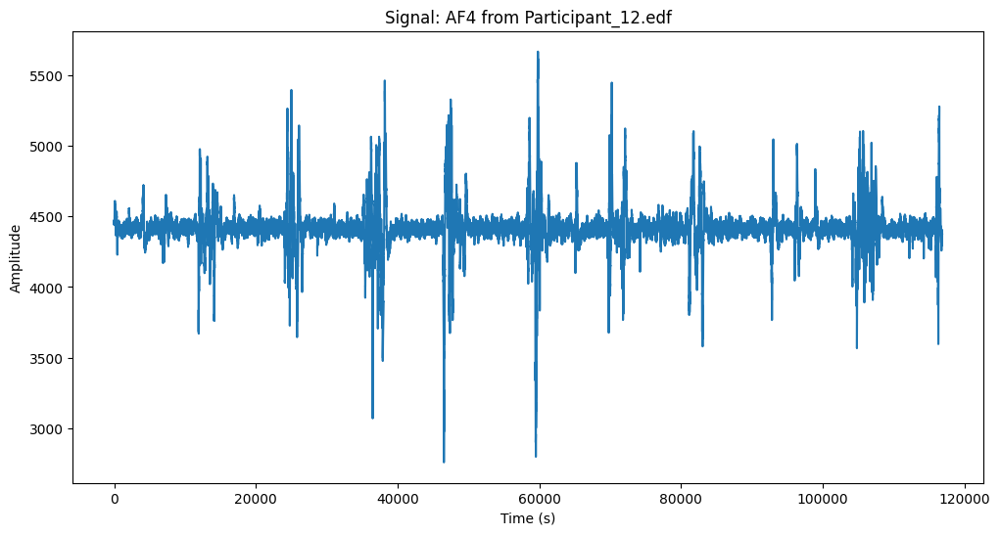

Statistics for Participant_12.edf:
Statistics for AF3:
  Mean: 4326.052514252817
  Median: 4324.615384615386
  Variance: 35919.18663781289
  Standard Deviation: 189.5235780524758

Statistics for F7:
  Mean: 4318.629522460473
  Median: 4316.410256410258
  Variance: 48144.33258256904
  Standard Deviation: 219.41816830556454

Statistics for F3:
  Mean: 4332.8995439801165
  Median: 4331.794871794873
  Variance: 28270.910012799068
  Standard Deviation: 168.1395551700999

Statistics for FC5:
  Mean: 4336.770570042409
  Median: 4333.333333333335
  Variance: 56937.35145567687
  Standard Deviation: 238.61548871705054

Statistics for T7:
  Mean: 4313.384161646588
  Median: 4311.282051282053
  Variance: 38146.291560694335
  Standard Deviation: 195.31075638759464

Statistics for P7:
  Mean: 4313.139292309098
  Median: 4311.282051282053
  Variance: 61743.04303329261
  Standard Deviation: 248.48147422552975

Statistics for O1:
  Mean: 4308.591766541692
  Median: 4307.179487179489
  Variance: 19641.0

In [29]:
analyse_edf(file_participant_12, channels_of_interest)

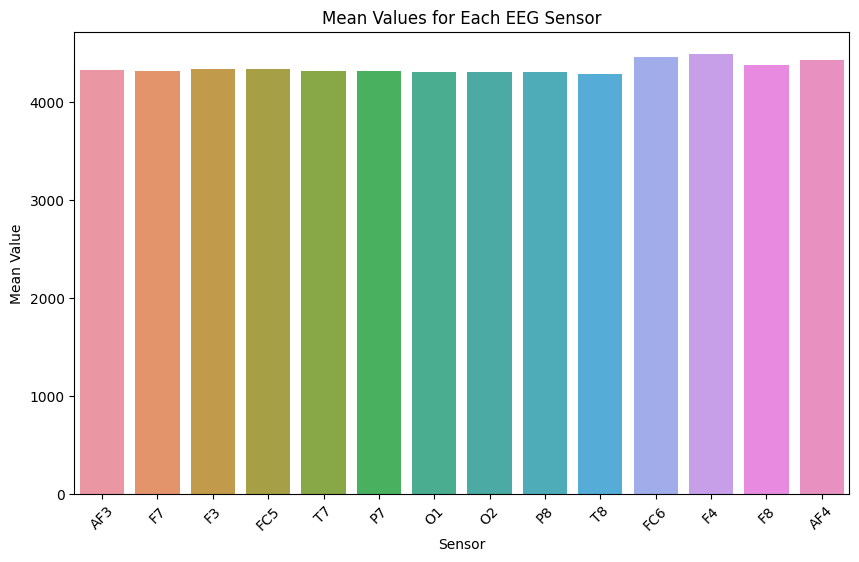

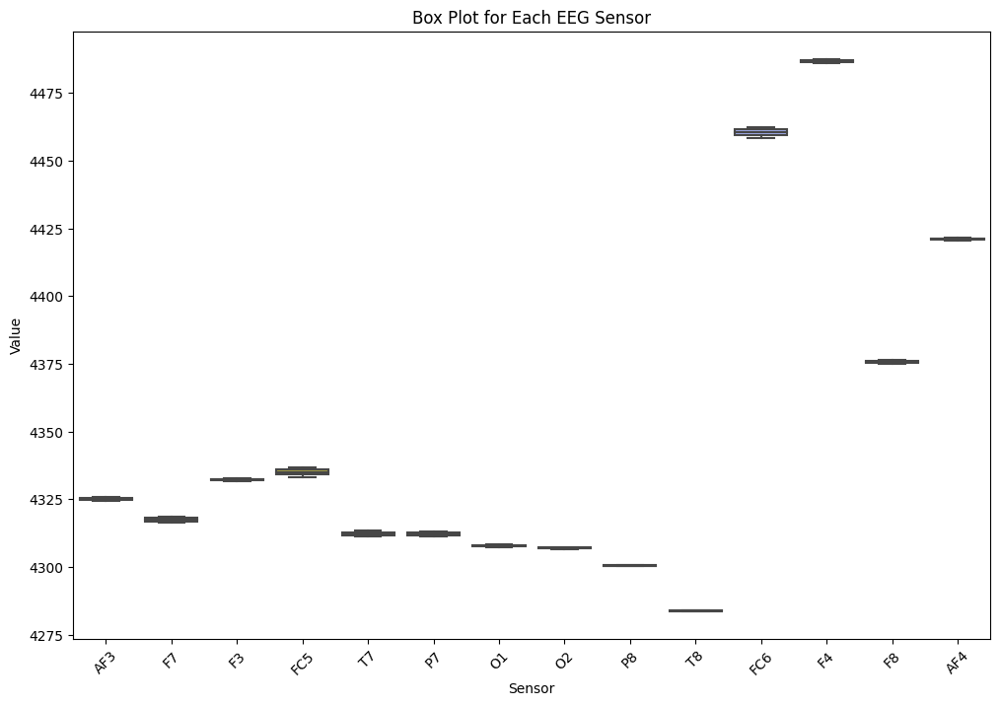

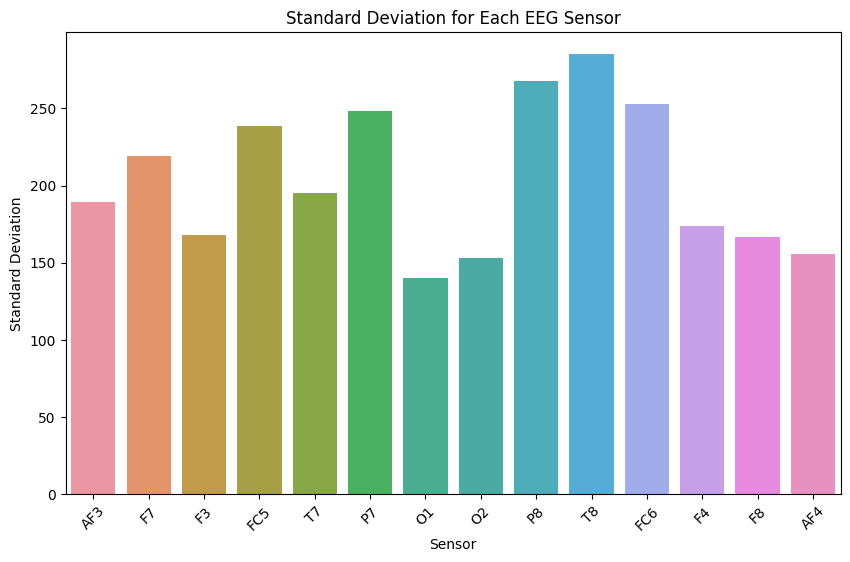

In [30]:
# Further Graphs for Participant 12:

data_participant_12 = {
    "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
    "Mean": [4326.05, 4318.63, 4332.90, 4336.77, 4313.38, 4313.14, 4308.59, 4307.33, 4300.67, 4283.68, 4458.46, 4487.50, 4376.38, 4421.72],
    "Median": [4324.62, 4316.41, 4331.79, 4333.33, 4311.28, 4311.28, 4307.18, 4306.67, 4300.51, 4284.10, 4462.56, 4486.15, 4374.87, 4420.51],
    "Variance": [35919.19, 48144.33, 28270.91, 56937.35, 38146.29, 61743.04, 19641.08, 23435.11, 71845.21, 81380.46, 63925.49, 30089.23, 27780.86, 24144.16],
    "Standard Deviation": [189.52, 219.42, 168.14, 238.62, 195.31, 248.48, 140.15, 153.09, 268.04, 285.27, 252.83, 173.46, 166.68, 155.38]
}

# Create DataFrame
data_participant_12 = pd.DataFrame(data_participant_12)

# Bar Chart of Mean Values:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Mean", data = data_participant_12)
plt.title('Mean Values for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.show()

# Box Plot for Each Sensor:
plt.figure(figsize = (12, 8))
sns.boxplot(data = data_participant_12.drop(columns = ['Variance', 'Standard Deviation']).set_index('Sensor').T)
plt.title('Box Plot for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Value')
plt.xticks(rotation = 45)
plt.show()

# Bar Chart of Standard Deviation:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Standard Deviation", data = data_participant_12)
plt.title('Standard Deviation for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Standard Deviation')
plt.xticks(rotation = 45)
plt.show()

##### Participant 13:

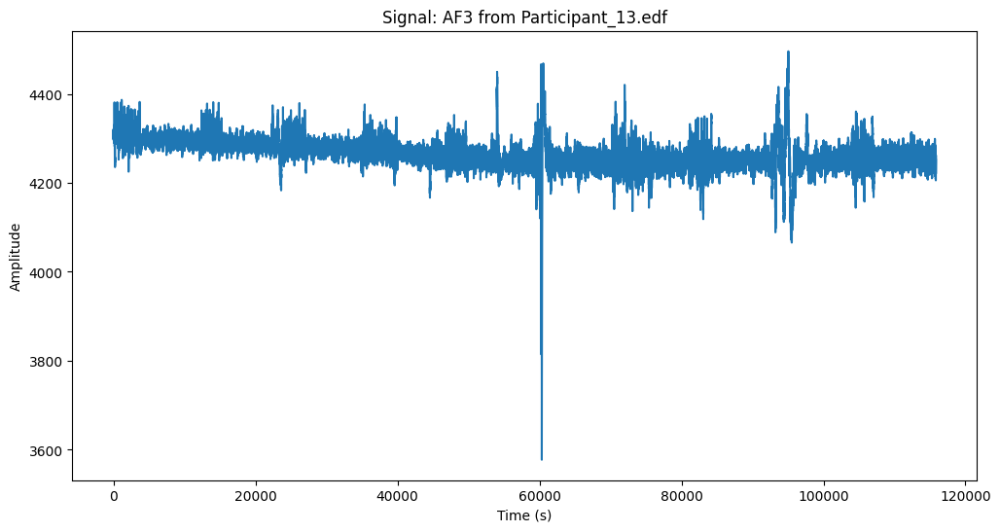

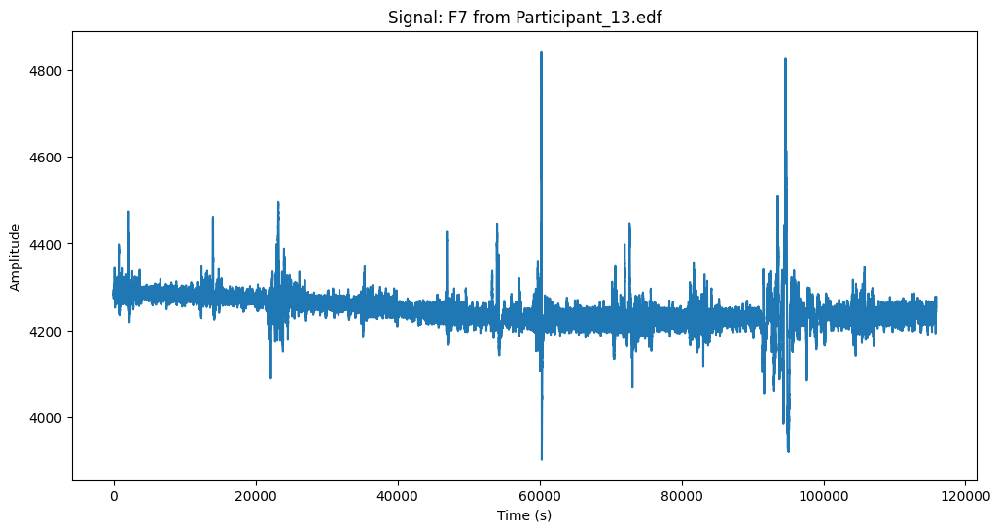

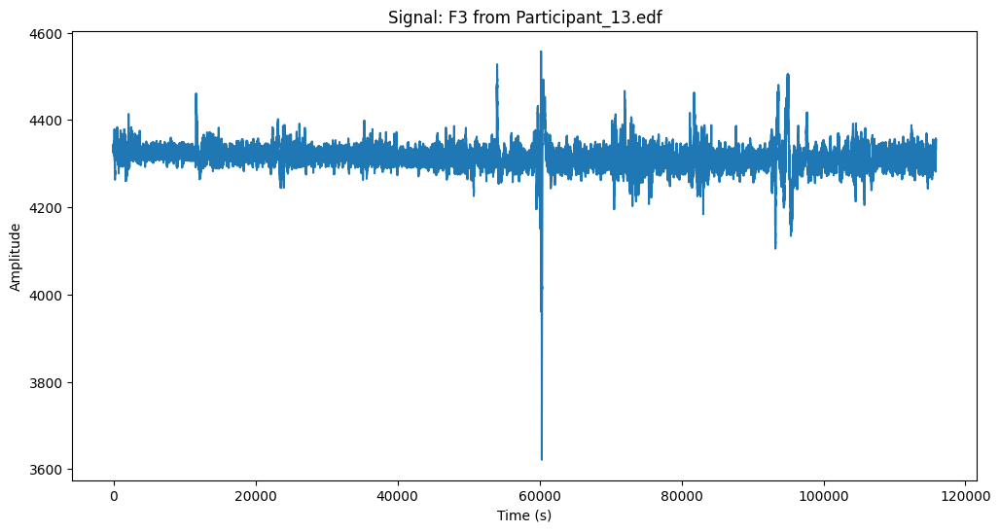

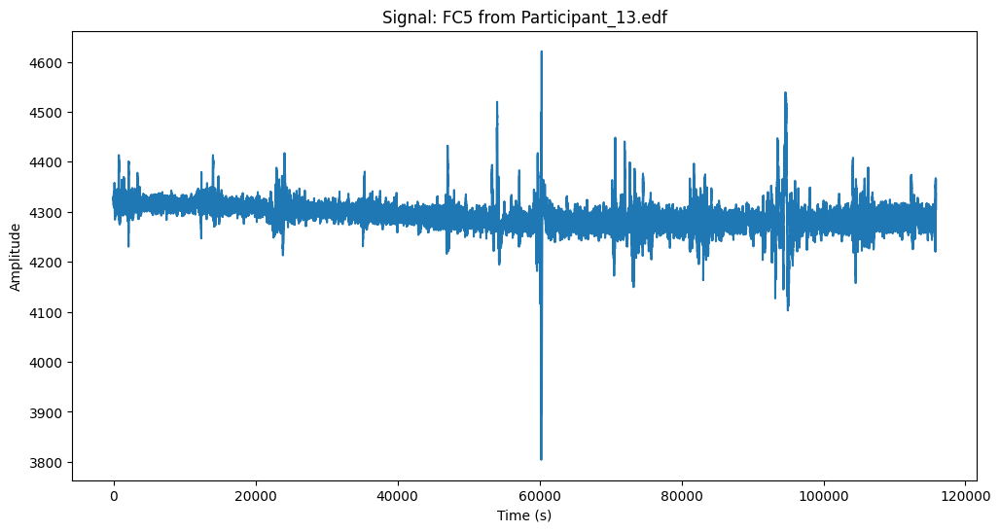

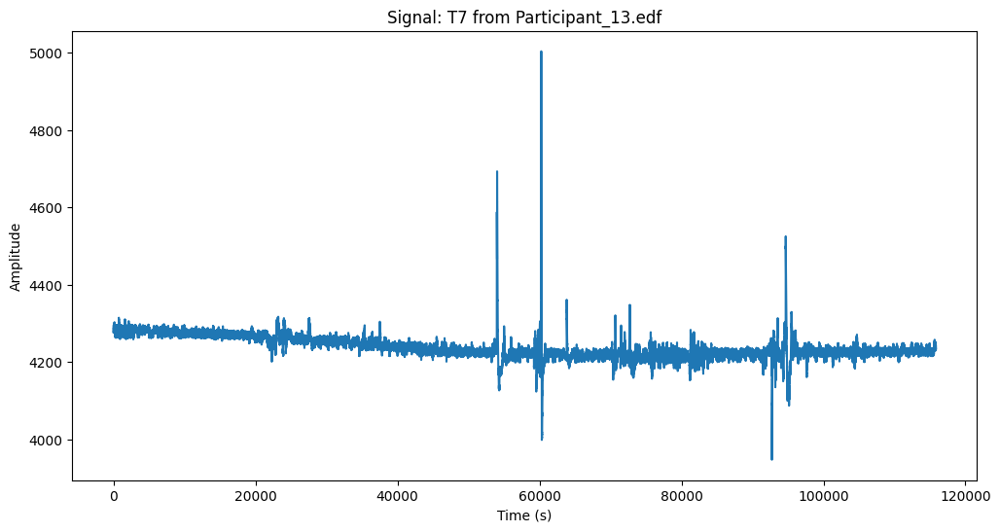

...

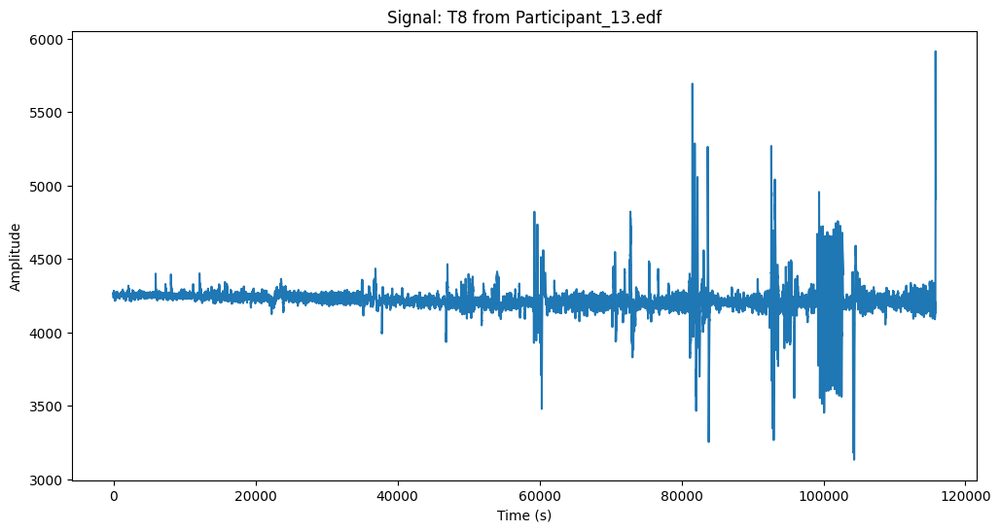

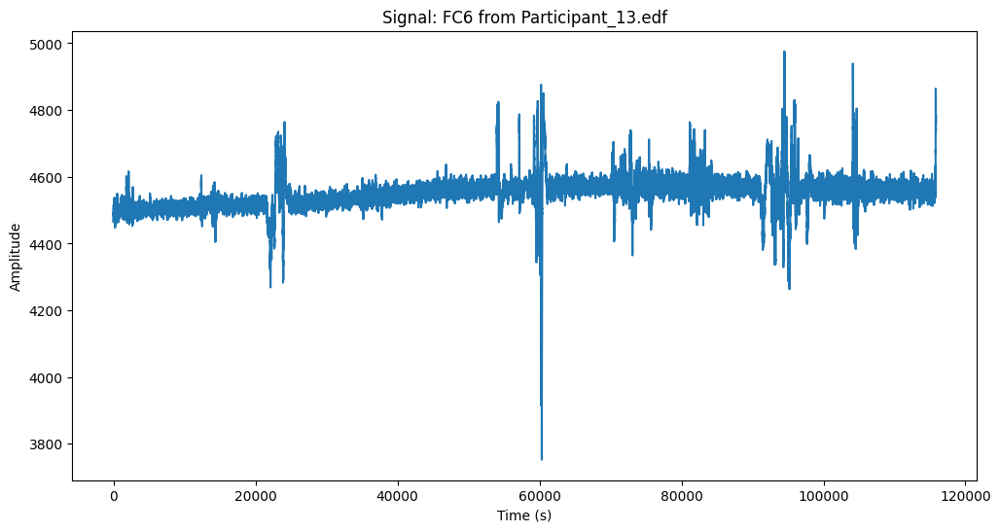

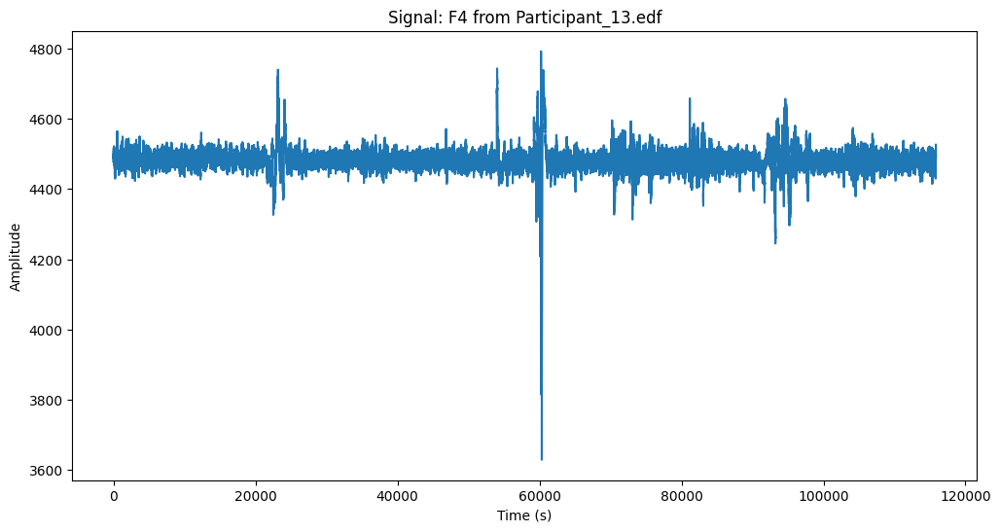

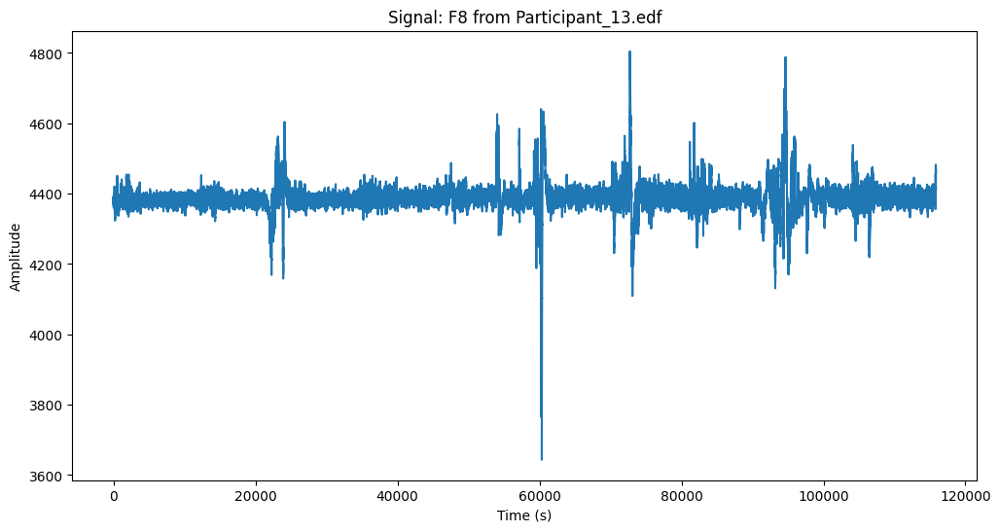

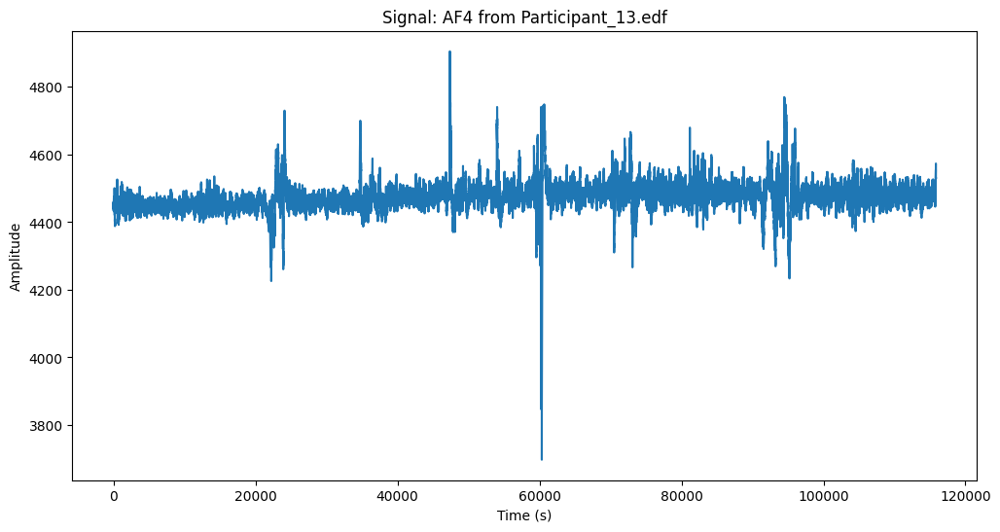

Statistics for Participant_13.edf:
Statistics for AF3:
  Mean: 4263.788784707467
  Median: 4262.564102564104
  Variance: 1098.4715826472589
  Standard Deviation: 33.143198135473575

Statistics for F7:
  Mean: 4246.067967311235
  Median: 4244.615384615386
  Variance: 1620.328518537091
  Standard Deviation: 40.25330444245653

Statistics for F3:
  Mean: 4314.522387200738
  Median: 4313.846153846155
  Variance: 804.1045766416926
  Standard Deviation: 28.356737764448376

Statistics for FC5:
  Mean: 4291.751221844454
  Median: 4292.307692307694
  Variance: 780.9521322625129
  Standard Deviation: 27.945520790683307

Statistics for T7:
  Mean: 4237.720817396232
  Median: 4231.794871794873
  Variance: 970.8379373284562
  Standard Deviation: 31.15827237393717

Statistics for P7:
  Mean: 4228.392654766965
  Median: 4218.97435897436
  Variance: 688.8063472593165
  Standard Deviation: 26.24512044665287

Statistics for O1:
  Mean: 4225.119886846581
  Median: 4220.512820512822
  Variance: 16609.78201

In [31]:
analyse_edf(file_participant_13, channels_of_interest)

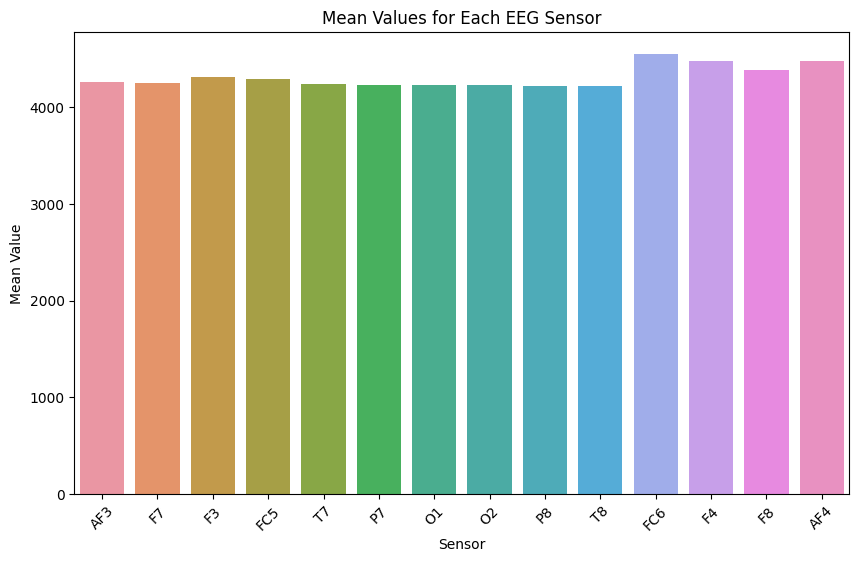

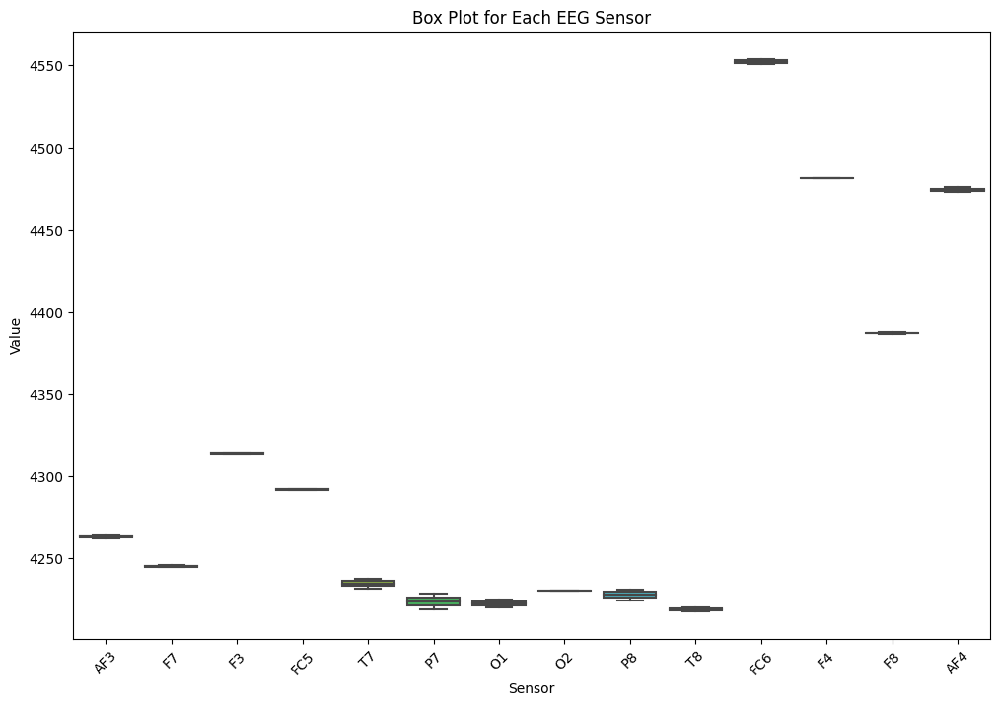

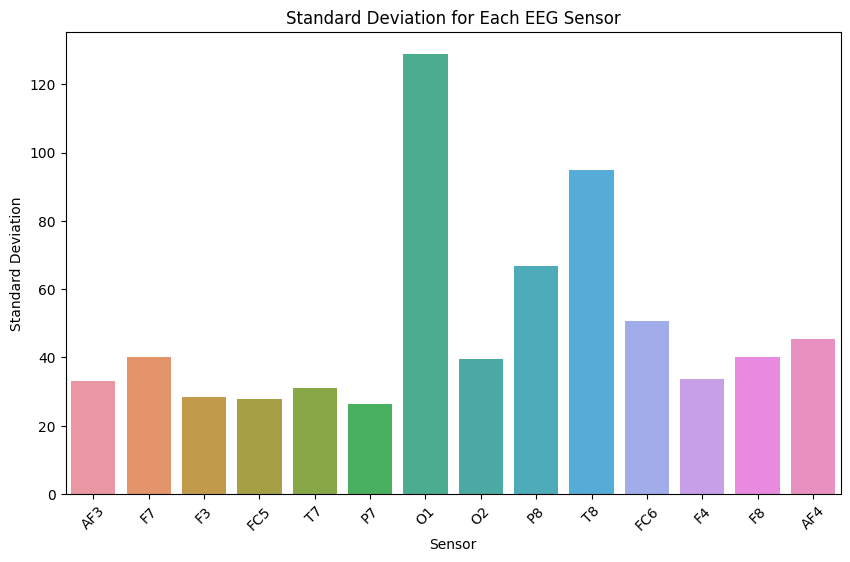

In [32]:
# Further Graphs for Participant 13:

data_participant_13 = {
    "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
    "Mean": [4263.79, 4246.07, 4314.52, 4291.75, 4237.72, 4228.39, 4225.12, 4230.47, 4224.48, 4217.88, 4550.56, 4481.54, 4387.48, 4475.64],
    "Median": [4262.56, 4244.62, 4313.85, 4292.31, 4231.79, 4218.97, 4220.51, 4230.26, 4231.28, 4220.00, 4553.85, 4481.03, 4386.67, 4472.82],
    "Variance": [1098.47, 1620.33, 804.10, 780.95, 970.84, 688.81, 16609.78, 1570.10, 4464.38, 8995.99, 2566.73, 1137.99, 1617.07, 2054.30],
    "Standard Deviation": [33.14, 40.25, 28.36, 27.95, 31.16, 26.25, 128.88, 39.62, 66.82, 94.85, 50.66, 33.73, 40.21, 45.32]
}

# Create DataFrame
data_participant_13 = pd.DataFrame(data_participant_13)

# Bar Chart of Mean Values:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Mean", data = data_participant_13)
plt.title('Mean Values for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.show()

# Box Plot for Each Sensor:
plt.figure(figsize = (12, 8))
sns.boxplot(data = data_participant_13.drop(columns = ['Variance', 'Standard Deviation']).set_index('Sensor').T)
plt.title('Box Plot for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Value')
plt.xticks(rotation = 45)
plt.show()

# Bar Chart of Standard Deviation:
plt.figure(figsize = (10, 6))
sns.barplot(x = "Sensor", y = "Standard Deviation", data = data_participant_13)
plt.title('Standard Deviation for Each EEG Sensor')
plt.xlabel('Sensor')
plt.ylabel('Standard Deviation')
plt.xticks(rotation = 45)
plt.show()

##### Combined Analysis:

In [33]:
# Data from All of the Participants:

data_participants = [
    {
        "Participant": 1,
        "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
        "Mean": [4296.20, 4282.89, 4324.27, 4315.10, 4276.58, 4270.71, 4271.07, 4271.92, 4262.79, 4251.99, 4505.53, 4488.15, 4380.36, 4446.99],
        "Median": [4296.92, 4283.08, 4325.13, 4314.36, 4277.95, 4272.31, 4273.33, 4272.31, 4263.59, 4251.79, 4505.64, 4487.69, 4380.51, 4446.67],
        "Variance": [2994.53, 31633.92, 975.80, 1218.28, 937.64, 1402.77, 3853.16, 737.29, 737.39, 690.21, 3558.36, 7841.24, 1680.50, 1470.76],
        "Standard Deviation": [54.72, 177.86, 31.24, 34.90, 30.62, 37.45, 62.07, 27.15, 27.15, 26.27, 59.65, 88.55, 40.99, 38.35]
    },
    {
        "Participant": 2,
        "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
        "Mean": [4296.20, 4282.89, 4324.27, 4315.10, 4276.58, 4270.71, 4271.07, 4271.92, 4262.79, 4251.99, 4505.53, 4488.15, 4380.36, 4446.99],
        "Median": [4296.92, 4283.08, 4325.13, 4314.36, 4277.95, 4272.31, 4273.33, 4272.31, 4263.59, 4251.79, 4505.64, 4487.69, 4380.51, 4446.67],
        "Variance": [2994.53, 31633.92, 975.80, 1218.28, 937.64, 1402.77, 3853.16, 737.29, 737.39, 690.21, 3558.36, 7841.24, 1680.50, 1470.76],
        "Standard Deviation": [54.72, 177.86, 31.24, 34.90, 30.62, 37.45, 62.07, 27.15, 27.15, 26.27, 59.65, 88.55, 40.99, 38.35]
    },
    {
        "Participant": 3,
        "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
        "Mean": [4323.10, 4314.09, 4330.49, 4334.01, 4310.41, 4308.40, 4306.27, 4305.29, 4297.00, 4281.28, 4465.36, 4488.97, 4373.42, 4421.28],
        "Median": [4324.62, 4314.36, 4330.77, 4335.38, 4310.77, 4308.21, 4307.18, 4306.15, 4297.95, 4280.51, 4464.62, 4489.23, 4374.36, 4421.54],
        "Variance": [839.65, 2835.28, 931.57, 1116.30, 833.08, 709.91, 1072.04, 1440.50, 1660.47, 1200.47, 1562.35, 1625.27, 1331.46, 1229.16],
        "Standard Deviation": [28.98, 53.25, 30.52, 33.41, 28.86, 26.64, 32.74, 37.95, 40.75, 34.65, 39.53, 40.31, 36.49, 35.06]
    },
    {
        "Participant": 4,
        "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
        "Mean": [4298.94, 4288.15, 4322.78, 4316.38, 4280.74, 4278.62, 4274.67, 4278.52, 4271.10, 4256.92, 4494.13, 4485.97, 4382.36, 4440.75],
        "Median": [4299.49, 4288.21, 4322.56, 4315.90, 4280.51, 4279.49, 4276.41, 4278.97, 4272.31, 4257.95, 4495.38, 4486.15, 4382.05, 4441.54],
        "Variance": [997.65, 1018.89, 1037.43, 979.29, 611.52, 799.57, 944.83, 605.17, 765.46, 800.01, 20104.29, 1229.00, 7660.60, 2278.38],
        "Standard Deviation": [31.59, 31.92, 32.21, 31.29, 24.73, 28.28, 30.74, 24.60, 27.67, 28.28, 141.79, 35.06, 87.52, 47.73]
    },
    {
        "Participant": 5,
        "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
        "Mean": [4288.56, 4274.78, 4321.54, 4309.69, 4267.45, 4264.30, 4263.85, 4263.93, 4256.46, 4245.55, 4515.54, 4485.83, 4381.29, 4452.25],
        "Median": [4288.21, 4273.85, 4320.51, 4309.23, 4265.64, 4264.10, 4264.10, 4264.10, 4256.41, 4246.67, 4515.38, 4485.64, 4381.54, 4452.31],
        "Variance": [1498.82, 20170.42, 2878.32, 4738.43, 18378.40, 4879.21, 1000.72, 1238.80, 4507.84, 1334.65, 8835.89, 2018.86, 18411.62, 2222.44],
        "Standard Deviation": [38.71, 142.02, 53.65, 68.84, 135.57, 69.85, 31.63, 35.20, 67.14, 36.53, 94.00, 44.93, 135.69, 47.14]
    },
    {
        "Participant": 6,
        "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
        "Mean": [4311.37, 4298.33, 4333.16, 4326.74, 4293.05, 4285.68, 4282.15, 4280.76, 4273.76, 4261.99, 4489.15, 4486.96, 4379.88, 4437.57],
        "Median": [4311.79, 4300.00, 4333.85, 4327.18, 4293.85, 4285.64, 4281.54, 4281.54, 4276.41, 4264.10, 4490.26, 4487.69, 4381.03, 4440.00],
        "Variance": [3316.93, 98660.22, 2931.08, 1769.01, 3814.19, 4257.37, 2605.18, 11380.88, 20647.23, 44086.34, 28212.29, 6105.64, 19397.67, 25567.70],
        "Standard Deviation": [57.59, 314.10, 54.14, 42.06, 61.76, 65.25, 51.04, 106.68, 143.69, 209.97, 167.97, 78.14, 139.28, 159.90]
    },
    {
        "Participant": 7,
        "Mean": [4288.02, 4274.08, 4320.00, 4308.41, 4267.20, 4261.83, 4261.79, 4271.10, 4257.52, 4245.75, 4504.89, 4454.08, 4377.61, 4445.09],
        "Median": [4287.18, 4273.33, 4319.49, 4306.67, 4263.08, 4262.05, 4262.05, 4270.77, 4258.46, 4245.64, 4504.10, 4456.92, 4379.49, 4444.10],
        "Variance": [28913.43, 31034.38, 28971.00, 29426.50, 30418.91, 26172.23, 20266.02, 18178.73, 27281.38, 27257.89, 38307.68, 20494.68, 43582.22, 27412.05],
        "Standard Deviation": [170.04, 176.17, 170.21, 171.54, 174.41, 161.78, 142.36, 134.83, 165.17, 165.10, 195.72, 143.16, 208.76, 165.57]
    },
    {
        "Participant": 8,
        "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
        "Mean": [4283.38, 4265.80, 4318.17, 4311.55, 4258.40, 4252.50, 4248.71, 4260.48, 4259.07, 4237.73, 4523.85, 4485.72, 4382.58, 4458.75],
        "Median": [4284.10, 4266.67, 4317.95, 4321.03, 4262.05, 4256.92, 4250.77, 4262.56, 4260.00, 4238.46, 4524.62, 4486.15, 4384.10, 4460.00],
        "Variance": [7615.10, 5151.12, 1687.47, 153721.33, 9082.66, 1947.40, 2671.11, 1646.33, 7728.97, 1830.98, 3352.43, 3489.83, 4029.55, 2833.15],
        "Standard Deviation": [87.26, 71.77, 41.08, 392.07, 95.30, 44.13, 51.68, 40.58, 87.91, 42.79, 57.90, 59.07, 63.48, 53.23]
    },
    {
        "Participant": 9,
        "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
        "Mean": [4340.15, 4333.11, 4337.35, 4346.74, 4329.77, 4328.93, 4327.02, 4326.20, 4318.13, 4298.71, 4443.72, 4492.68, 4370.91, 4409.36],
        "Median": [4345.64, 4341.54, 4340.00, 4350.77, 4335.38, 4338.46, 4333.85, 4333.33, 4328.21, 4308.21, 4442.56, 4494.36, 4377.44, 4408.21],
        "Variance": [9704.95, 34540.67, 15561.41, 11570.50, 24849.94, 12889.14, 9698.00, 12243.38, 20741.24, 21352.55, 19231.01, 14174.29, 14903.50, 15045.00],
        "Standard Deviation": [98.51, 185.85, 124.75, 107.57, 157.64, 113.53, 98.48, 110.65, 144.02, 146.13, 138.68, 119.06, 122.08, 122.66]
    },
    {
        "Participant": 10,
        "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
        "Mean": [4303.74, 4292.85, 4325.16, 4320.29, 4286.37, 4284.42, 4280.46, 4282.86, 4276.78, 4260.43, 4494.59, 4486.81, 4379.04, 4439.64],
        "Median": [4304.62, 4292.31, 4325.64, 4316.41, 4288.72, 4285.64, 4284.10, 4282.56, 4278.46, 4260.51, 4495.38, 4485.64, 4380.00, 4441.54],
        "Variance": [22910.28, 27290.84, 29578.05, 38717.23, 67515.68, 12272.64, 19526.45, 30466.03, 26635.16, 26765.87, 33179.41, 67212.00, 25139.09, 26522.14],
        "Standard Deviation": [151.36, 165.20, 171.98, 196.77, 259.84, 110.78, 139.74, 174.55, 163.20, 163.60, 182.15, 259.25, 158.55, 162.86]
    },
    {
        "Participant": 11,
        "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
        "Mean": [4312.30, 4302.23, 4328.72, 4327.14, 4296.65, 4293.53, 4291.45, 4292.22, 4284.76, 4269.87, 4481.23, 4489.34, 4376.50, 4431.77],
        "Median": [4311.79, 4302.56, 4328.21, 4326.67, 4296.41, 4293.85, 4291.79, 4292.31, 4284.62, 4269.23, 4480.00, 4486.67, 4380.00, 4431.79],
        "Variance": [1812.30, 1811.40, 3408.35, 1837.66, 1391.80, 799.26, 3607.86, 1350.19, 1267.00, 2743.50, 16915.44, 23843.50, 81694.65, 1911.61],
        "Standard Deviation": [42.57, 42.56, 58.38, 42.87, 37.31, 28.27, 60.07, 36.74, 35.59, 52.38, 130.06, 154.41, 285.82, 43.72]
    },
    {
        "Participant": 12,
        "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
        "Mean": [4326.05, 4318.63, 4332.90, 4336.77, 4313.38, 4313.14, 4308.59, 4307.33, 4300.67, 4283.68, 4458.46, 4487.50, 4376.38, 4421.72],
        "Median": [4324.62, 4316.41, 4331.79, 4333.33, 4311.28, 4311.28, 4307.18, 4306.67, 4300.51, 4284.10, 4462.56, 4486.15, 4374.87, 4420.51],
        "Variance": [35919.19, 48144.33, 28270.91, 56937.35, 38146.29, 61743.04, 19641.08, 23435.11, 71845.21, 81380.46, 63925.49, 30089.23, 27780.86, 24144.16],
        "Standard Deviation": [189.52, 219.42, 168.14, 238.62, 195.31, 248.48, 140.15, 153.09, 268.04, 285.27, 252.83, 173.46, 166.68, 155.38]
    },
    {
        "Participant": 13,
        "Sensor": ["AF3", "F7", "F3", "FC5", "T7", "P7", "O1", "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"],
        "Mean": [4263.79, 4246.07, 4314.52, 4291.75, 4237.72, 4228.39, 4225.12, 4230.47, 4224.48, 4217.88, 4550.56, 4481.54, 4387.48, 4475.64],
        "Median": [4262.56, 4244.62, 4313.85, 4292.31, 4231.79, 4218.97, 4220.51, 4230.26, 4231.28, 4220.00, 4553.85, 4481.03, 4386.67, 4472.82],
        "Variance": [1098.47, 1620.33, 804.10, 780.95, 970.84, 688.81, 16609.78, 1570.10, 4464.38, 8995.99, 2566.73, 1137.99, 1617.07, 2054.30],
        "Standard Deviation": [33.14, 40.25, 28.36, 27.95, 31.16, 26.25, 128.88, 39.62, 66.82, 94.85, 50.66, 33.73, 40.21, 45.32]
    }
]


In [34]:
# Convert to DataFrame & Display the combined DataFrame:

df_list = []

for participant_data in data_participants:
    df = pd.DataFrame(participant_data)
    df_list.append(df)

# Concatenate all DataFrames
combined_df = pd.concat(df_list, ignore_index = True)

combined_df.head()

,Participant,Sensor,Mean,Median,Variance,Standard Deviation
0,1,AF3,4296.20,4296.92,2994.53,54.72
1,1,F7,4282.89,4283.08,31633.92,177.86
2,1,F3,4324.27,4325.13,975.80,31.24
3,1,FC5,4315.10,4314.36,1218.28,34.90
4,1,T7,4276.58,4277.95,937.64,30.62


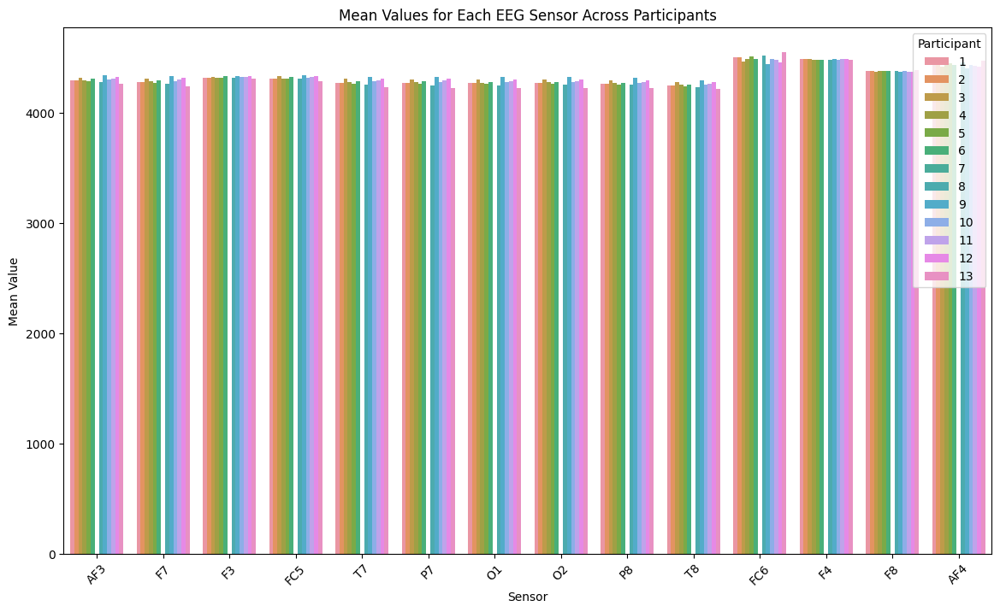

In [35]:
# Grouped Bar Chart for Mean Values:

plt.figure(figsize = (14, 8))
sns.barplot(x = "Sensor", y = "Mean", hue = "Participant", data = combined_df)
plt.title('Mean Values for Each EEG Sensor Across Participants')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.legend(title = 'Participant')
plt.show()

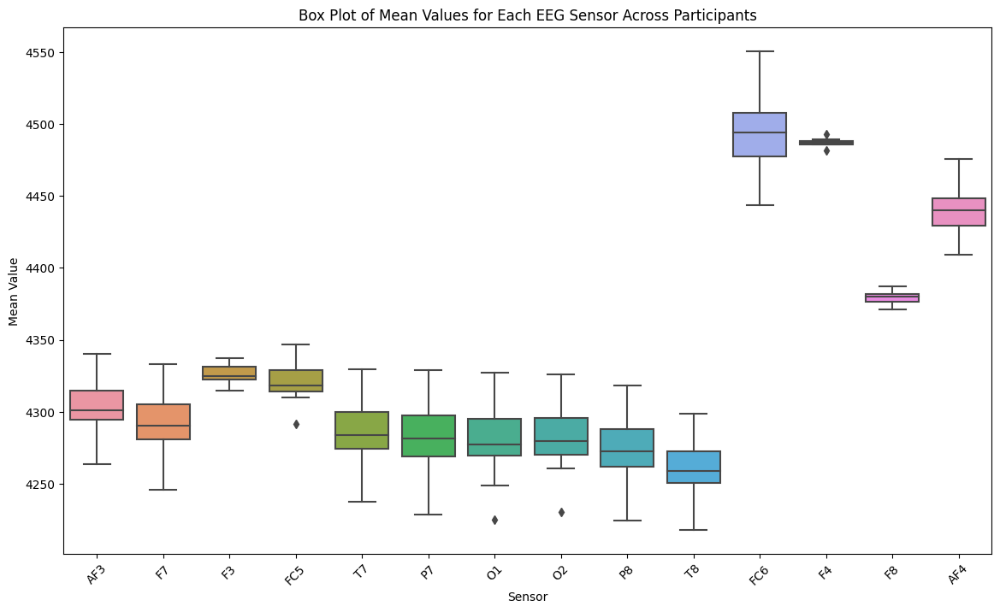

In [36]:
# Box Plot for Mean values across participants:

plt.figure(figsize=(14, 8))
sns.boxplot(x = "Sensor", y = "Mean", data = combined_df)
plt.title('Box Plot of Mean Values for Each EEG Sensor Across Participants')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.show()

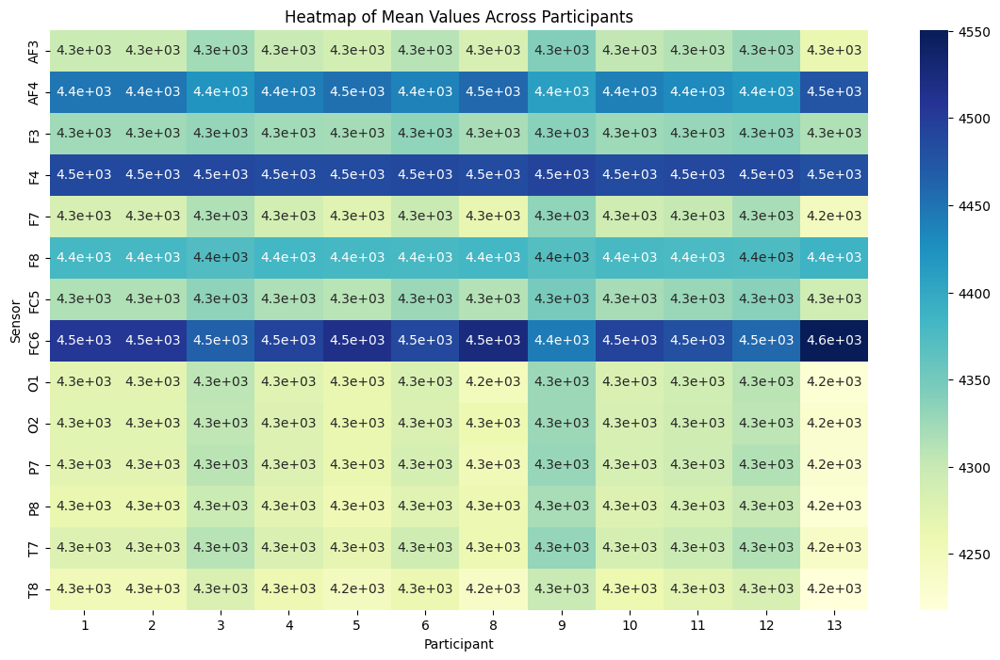

In [37]:
# Pivot the DataFrame for heatmap:
heatmap_data = combined_df.pivot_table(index = 'Sensor', columns = 'Participant', values = 'Mean')

# Heatmap of Mean Values:
plt.figure(figsize = (14, 8))
sns.heatmap(heatmap_data, annot = True, cmap = "YlGnBu")
plt.title('Heatmap of Mean Values Across Participants')
plt.xlabel('Participant')
plt.ylabel('Sensor')
plt.show()


In [38]:
# Calculate the overall average mean, median, variance, and standard deviation for each sensor:

average_stats = combined_df.groupby('Sensor').agg({
    'Mean': 'mean',
    'Median': 'mean',
    'Variance': 'mean',
    'Standard Deviation': 'mean'
}).reset_index()

average_stats.columns = ['Sensor', 'Average Mean', 'Average Median', 'Average Variance', 'Average Std Dev']
print(average_stats)

   Sensor  Average Mean  Average Median  Average Variance  Average Std Dev
0     AF3   4303.648333     4304.273333       7641.866667        72.389167
1     AF4   4440.225833     4440.300000       8895.796667        79.141667
2      F3   4326.110833     4326.282500       7420.024167        68.807500
3      F4   4487.301667     4487.007500      13884.007500        97.876667
4      F7   4291.651667     4292.224167      25375.945000       135.171667
5      F8   4379.213333     4380.256667      17110.589167       109.815000
6     FC5   4320.938333     4321.410833      22883.717500       104.270833
7     FC6   4493.970833     4494.657500      17083.504167       114.572500
8      O1   4279.202500     4280.340833       7090.280833        74.107500
9      O2   4280.991667     4281.922500       7237.589167        67.830000
10     P7   4281.610833     4282.265000       8649.324167        69.696667
11     P8   4273.982500     4276.111667      13478.145000        91.594167
12     T7   4285.591667  

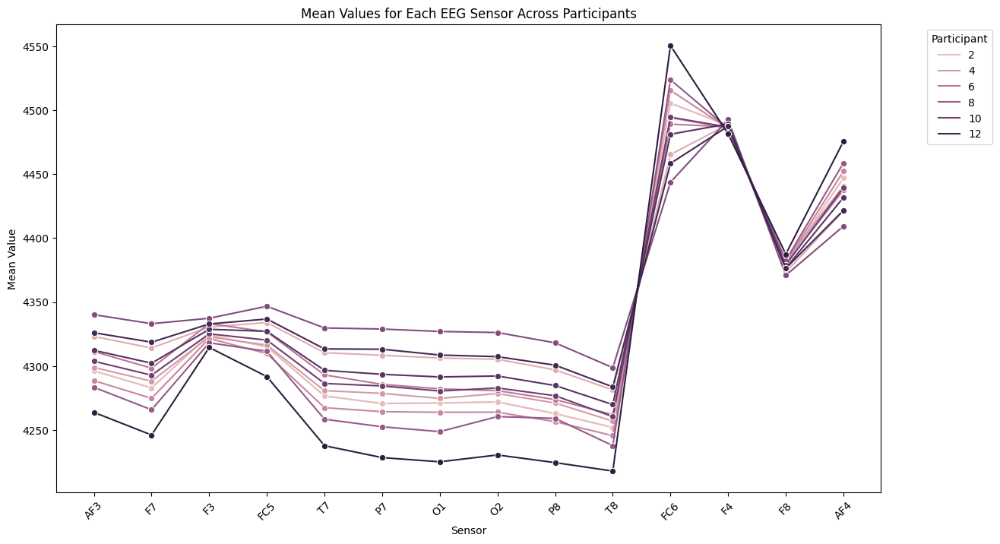

In [39]:
# Line plot for Mean Values:

plt.figure(figsize = (14, 8))
sns.lineplot(x = 'Sensor', y = 'Mean', hue = 'Participant', data = combined_df, marker = 'o')
plt.title('Mean Values for Each EEG Sensor Across Participants')
plt.xlabel('Sensor')
plt.ylabel('Mean Value')
plt.xticks(rotation = 45)
plt.legend(title = 'Participant', bbox_to_anchor = (1.05, 1), loc = 'upper left')
plt.show()

    Participant         Mean       Median      Variance  Standard Deviation
0             1  4331.753571  4332.234286   4266.560714           52.640714
1             2  4331.753571  4332.234286   4266.560714           52.640714
2             3  4347.097857  4347.546429   1313.393571           35.652857
3             4  4333.573571  4334.065714   2845.149286           43.100714
4             5  4327.930000  4327.692143   6579.601429           71.492857
5             6  4338.610714  4339.634286  19482.266429          117.969286
6             7  4324.097857  4323.809286  28408.364286          167.487143
7             8  4324.763571  4326.812857  14770.530714           84.875000
8             9  4357.341429  4362.711429  16893.255714          127.829286
9            10  4336.674286  4337.252143  32409.347857          175.702143
10           11  4341.265000  4341.135714  10313.894286           75.053571
11           12  4348.942857  4347.947143  43671.622143          203.885000
12          

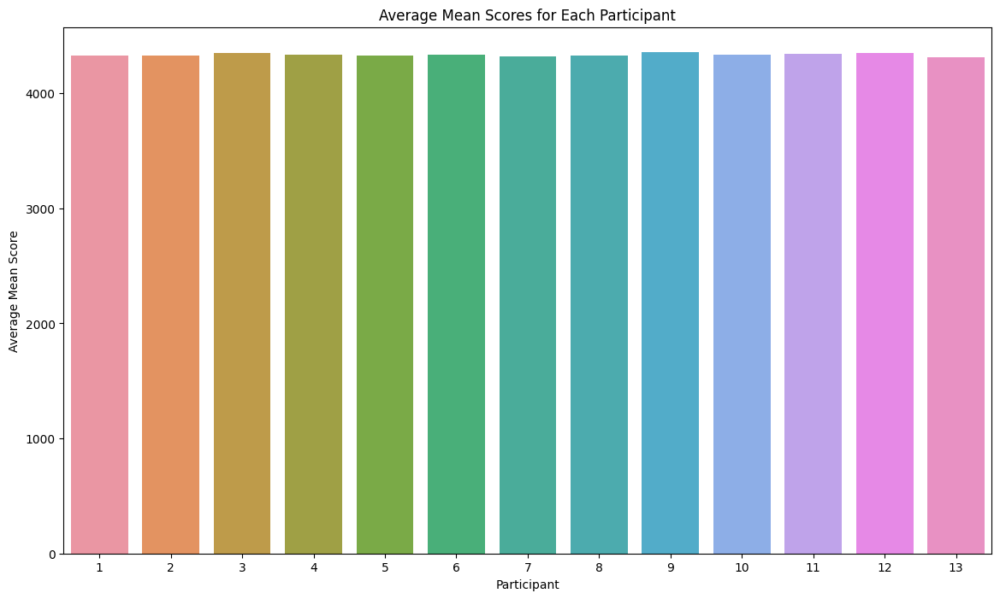

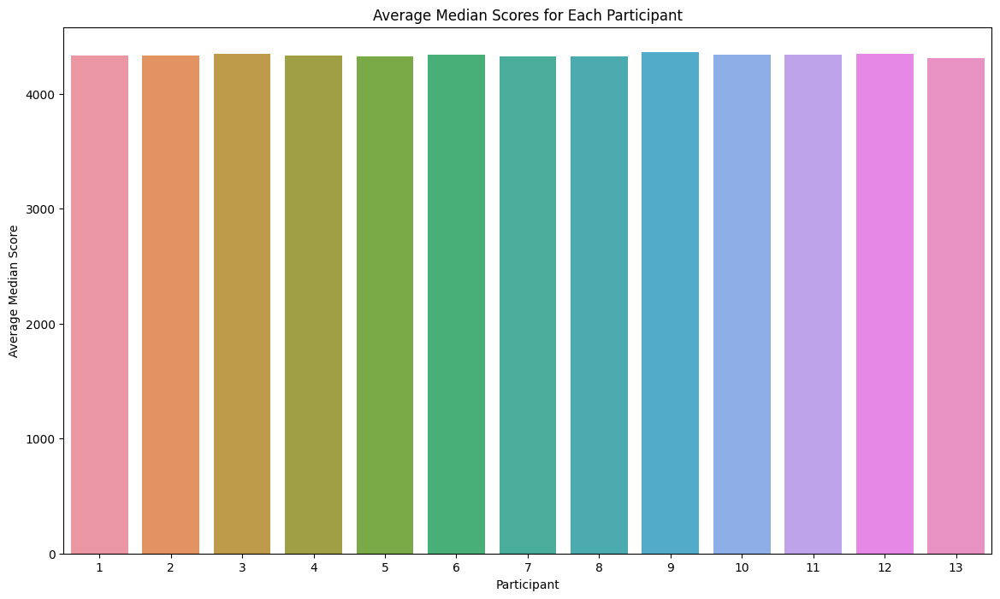

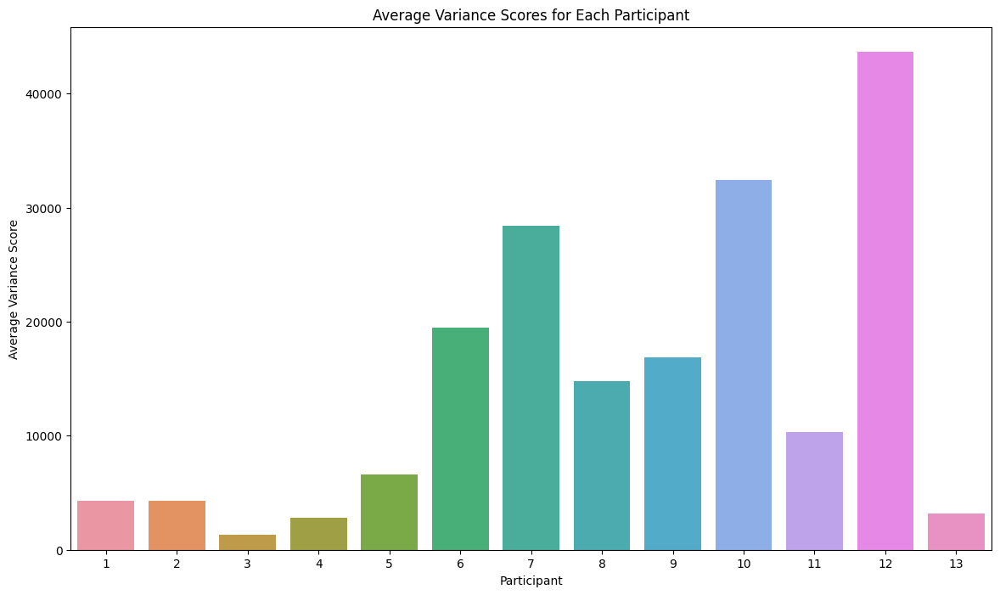

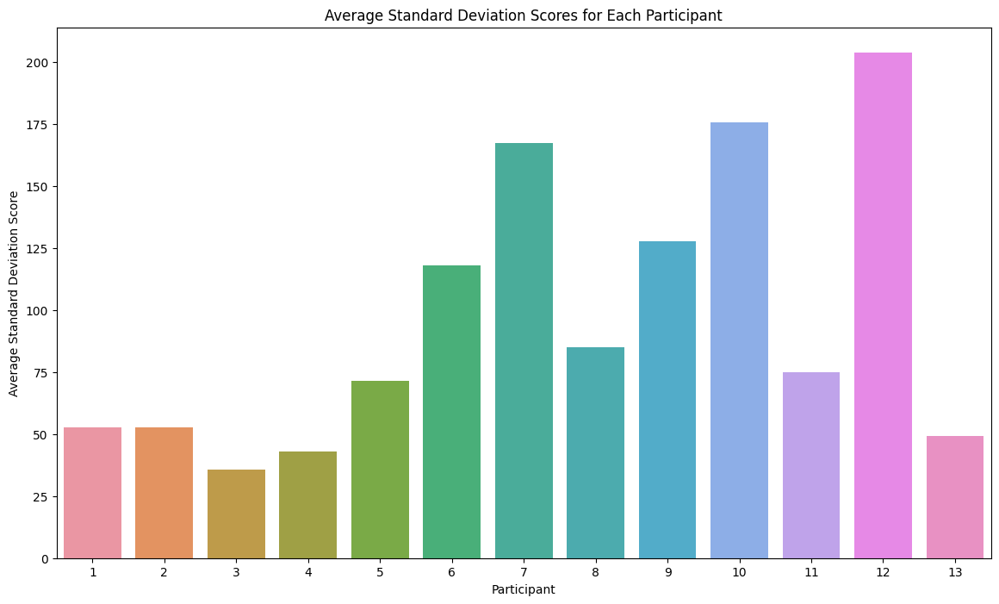

In [40]:
# Calculate the overall average mean, median, variance, and standard deviation for each participant with graphs:

average_stats = combined_df.groupby('Participant').agg({
    'Mean': 'mean',
    'Median': 'mean',
    'Variance': 'mean',
    'Standard Deviation': 'mean'
}).reset_index()

print(average_stats)

# Visualize average mean scores
plt.figure(figsize = (14, 8))
sns.barplot(x = 'Participant', y = 'Mean', data = average_stats)
plt.title('Average Mean Scores for Each Participant')
plt.xlabel('Participant')
plt.ylabel('Average Mean Score')
plt.show()

# Visualize average median scores
plt.figure(figsize = (14, 8))
sns.barplot(x = 'Participant', y = 'Median', data = average_stats)
plt.title('Average Median Scores for Each Participant')
plt.xlabel('Participant')
plt.ylabel('Average Median Score')
plt.show()

# Visualize average variance scores
plt.figure(figsize = (14, 8))
sns.barplot(x = 'Participant', y = 'Variance', data = average_stats)
plt.title('Average Variance Scores for Each Participant')
plt.xlabel('Participant')
plt.ylabel('Average Variance Score')
plt.show()

# Visualize average standard deviation scores
plt.figure(figsize = (14, 8))
sns.barplot(x = 'Participant', y = 'Standard Deviation', data = average_stats)
plt.title('Average Standard Deviation Scores for Each Participant')
plt.xlabel('Participant')
plt.ylabel('Average Standard Deviation Score')
plt.show()
